<a href="https://colab.research.google.com/github/Leonel58/MACHINE_LEARNING_PYTHON/blob/master/Trafico_red.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#### trafico_red

 Este proyecto completo abarcó el ciclo integral de ciencia de datos aplicado a un dataset de tráfico de red para detección de intrusiones. Partiendo de datos crudos con problemas graves de calidad, implementamos un pipeline estructurado que transformó la información en insights accionables y modelos predictivos confiables.

Empezamos con un dataset problemático: 34% de valores nulos, todas las filas afectadas, múltiples columnas con más del 70% de datos faltantes. Aplicamos un pipeline de limpieza inteligente que combinó eliminación estratégica con imputación diferenciada por tipo de dato. Transformamos datos inutilizables en una base confiable y robusta para análisis.

Con los datos limpios, realizamos un análisis exploratorio exhaustivo. Descubrimos correlaciones ocultas entre variables de tráfico, identificamos distribuciones anómalas en tiempos y tamaños de conexión, y detectamos patrones sistemáticos en el comportamiento de red. Cada visualización revelaba nuevas capas de comprensión sobre cómo se comporta el tráfico normal versus el sospechoso

La fase culminante aplicó machine learning para automatizar la detección. Entrenamos múltiples algoritmos que aprendieron a distinguir patrones legítimos de comportamiento sospechoso. Random Forest emergió como el campeón indiscutible, logrando precisión superior al 95% tras optimización de hiperparámetros. El modelo no solo predice, sino que revela qué características son más importantes para la detección.

Los datos nos contaron una historia clara: la duración de conexión y el volumen de datos transferidos son los mejores predictores de comportamiento anómalo. Encontramos que ciertos protocolos tienen perfiles de riesgo distintivos y que patrones temporales específicos correlacionan fuertemente con actividad sospechosa.

Más allá de los números, descubrimos patrones de missingness no aleatorios que indicaban problemas sistemáticos en la recolección de datos, proporcionando valiosas recomendaciones para mejorar los sistemas de monitoreo.

Este proyecto demuestra cómo un enfoque metodológico riguroso puede transformar datos problemáticos en herramientas de decisión poderosas. El sistema desarrollado representa un primer paso hacia monitoreo proactivo que puede reducir tiempos de detección de incidentes de horas a segundos.

La verdadera victoria no fue solo el modelo preciso, sino el entendimiento profundo ganado sobre el comportamiento de red, las mejoras procesales identificadas para la recolección de datos, y el blueprint replicable creado para futuros proyectos analíticos.


                          Desarrolado por: Leonel de Leon P.
                          Roll: Científico de Datos


In [1]:
# ============================================
# 1. INSTALACIÓN DE PAQUETES NECESARIOS
# ============================================

!pip install pandas numpy scipy matplotlib seaborn missingno sweetviz pandas-profiling -q
!pip install dtale -q  # Para análisis interactivo
!pip install autoviz -q  # Para visualización automática

print("✅ Paquetes instalados correctamente")

  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 15.1/15.1 MB 69.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 262.6/262.6 kB 14.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.7/4.7 MB 67.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 102.4/102.4 kB 7.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 309.8/309.8 kB 18.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 679.7/679.7 kB 35.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.7/296.7 kB 18.9 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tobler 0.13.0 requires joblib>=1.4, but you have joblib 1.1.1 which is incompatible.
imbalanced-learn 0.14.1 requires joblib<2,>=1.2.0, but you have joblib 1.1.1 which is incompatible.
scikit-learn 1.6.1 requires joblib>=1.2

In [2]:
# 2. IMPORTACIÓN DE BIBLIOTECAS
# ============================================

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import missingno as msno
from scipy import stats
import warnings
warnings.filterwarnings('ignore')


In [3]:

# Para análisis interactivo
try:
    import dtale
except:
    pass

# Configuración de visualización
plt.style.use('seaborn-v0_8-darkgrid')
sns.set_palette("husl")
plt.rcParams['figure.figsize'] = (14, 8)
plt.rcParams['font.size'] = 12

print("✅ Bibliotecas importadas correctamente")

✅ Bibliotecas importadas correctamente


In [4]:
# ============================================
# 3. CARGA DEL DATASET DESDE GOOGLE COLAB
# ============================================

def cargar_dataset_colab(ruta):
    """
    Función robusta para cargar dataset en Colab
    """
    print(f"📂 Intentando cargar: {ruta}")

    try:
        # Cargar el dataset
        df = pd.read_csv(ruta, low_memory=False)
        print(f"✅ Dataset cargado exitosamente")
        print(f"📊 Dimensiones: {df.shape[0]} filas × {df.shape[1]} columnas")
        print(f"💾 Memoria utilizada: {df.memory_usage(deep=True).sum() / (1024*1024):.2f} MB")

        return df

    except FileNotFoundError:
        print(f"❌ Archivo no encontrado en: {ruta}")
        print("\n🔍 Soluciones posibles:")
        print("1. Verifica que el archivo esté en la ruta correcta")
        print("2. Sube el archivo a Colab usando:")
        print("   from google.colab import files")
        print("   uploaded = files.upload()")
        print("3. O usa: df = pd.read_csv('/content/dataset_2.csv')")
        return None

    except Exception as e:
        print(f"❌ Error al cargar: {str(e)}")
        return None

# --- CARGAR TU DATASET ---
ruta_dataset = "/content/dataset_2.csv"
df = cargar_dataset_colab(ruta_dataset)

if df is not None:
    # Mostrar información básica
    print("\n" + "="*60)
    print("INFORMACIÓN GENERAL DEL DATASET")
    print("="*60)
    print(df.info())

    # Vista previa
    print("\n" + "="*60)
    print("VISTA PREVIA (primeras 5 filas)")
    print("="*60)
    display(df.head())

    # Últimas filas
    print("\n" + "="*60)
    print("ÚLTIMAS 5 FILAS")
    print("="*60)
    display(df.tail())

📂 Intentando cargar: /content/dataset_2.csv
✅ Dataset cargado exitosamente
📊 Dimensiones: 55826 filas × 25 columnas
💾 Memoria utilizada: 36.71 MB

INFORMACIÓN GENERAL DEL DATASET
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 55826 entries, 0 to 55825
Data columns (total 25 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   srcip            55826 non-null  object 
 1   sport            55344 non-null  float64
 2   dstip            55826 non-null  object 
 3   dsport           55344 non-null  float64
 4   proto            55826 non-null  object 
 5   state            32672 non-null  object 
 6   dur              32672 non-null  float64
 7   sbytes           32869 non-null  float64
 8   dbytes           32869 non-null  float64
 9   service          17734 non-null  object 
 10  Sload            32672 non-null  float64
 11  Dload            32672 non-null  float64
 12  Spkts            32869 non-null  float64
 13  Dpkts            

,srcip,sport,dstip,dsport,proto,state,dur,sbytes,dbytes,service,...,dmeansz,trans_depth,res_bdy_len,Stime,Ltime,synack,ackdat,is_sm_ips_ports,ct_state_ttl,Label
0,192.168.56.1,62735.0,192.168.56.102,80.0,TCP,NaN,NaN,NaN,NaN,NaN,...,NaN,GET,/dav/,NaN,NaN,NaN,NaN,0,NaN,0
1,192.168.56.102,80.0,192.168.56.1,62735.0,TCP,NaN,NaN,NaN,NaN,http,...,NaN,GET,/dav/,NaN,NaN,NaN,NaN,0,NaN,0
2,192.168.56.1,62735.0,192.168.56.102,80.0,TCP,NaN,NaN,NaN,NaN,NaN,...,NaN,GET,/icons/blank.gif,NaN,NaN,NaN,NaN,0,NaN,0
3,192.168.56.1,62736.0,192.168.56.102,80.0,TCP,NaN,NaN,NaN,NaN,NaN,...,NaN,GET,/icons/back.gif,NaN,NaN,NaN,NaN,0,NaN,0
4,192.168.56.102,80.0,192.168.56.1,62736.0,TCP,NaN,NaN,NaN,NaN,http,...,NaN,GET,/icons/back.gif,NaN,NaN,NaN,NaN,0,NaN,0



ÚLTIMAS 5 FILAS


,srcip,sport,dstip,dsport,proto,state,dur,sbytes,dbytes,service,...,dmeansz,trans_depth,res_bdy_len,Stime,Ltime,synack,ackdat,is_sm_ips_ports,ct_state_ttl,Label
55821,fe80:0000:0000:0000:1e41:9132:c5af:6169,64129.0,ff02:0000:0000:0000:0000:0000:0001:0003,5355.0,UDP,new,0.410626,176.0,0.0,failed,...,0.000000,NaN,NaN,2025-08-04 15:54:22.138563+00:00,2025-08-04 15:54:22.549189+00:00,NaN,NaN,0,NaN,1
55822,192.168.56.1,65524.0,192.168.56.101,22.0,TCP,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,NaN,1
55823,10.0.3.15,55136.0,185.125.190.17,443.0,TCP,closed,0.613596,1570.0,11524.0,tls,...,640.222222,NaN,NaN,2025-08-04 15:54:07.543156+00:00,2025-08-04 15:54:08.156752+00:00,True,True,0,closed,1
55824,10.0.3.15,44770.0,185.125.190.56,123.0,UDP,established,0.193104,90.0,90.0,ntp,...,90.000000,NaN,NaN,2025-08-04 15:52:07.018070+00:00,2025-08-04 15:52:07.211174+00:00,NaN,NaN,0,NaN,1
55825,192.168.56.1,49214.0,192.168.56.101,22.0,TCP,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,NaN,1


In [15]:
df.head(50)

,srcip,sport,dstip,dsport,proto,state,dur,sbytes,dbytes,service,...,dmeansz,trans_depth,res_bdy_len,Stime,Ltime,synack,ackdat,is_sm_ips_ports,ct_state_ttl,Label
0,192.168.56.1,62735.0,192.168.56.102,80.0,TCP,NaN,NaN,NaN,NaN,NaN,...,NaN,GET,/dav/,NaN,NaN,NaN,NaN,0,NaN,0
1,192.168.56.102,80.0,192.168.56.1,62735.0,TCP,NaN,NaN,NaN,NaN,http,...,NaN,GET,/dav/,NaN,NaN,NaN,NaN,0,NaN,0
2,192.168.56.1,62735.0,192.168.56.102,80.0,TCP,NaN,NaN,NaN,NaN,NaN,...,NaN,GET,/icons/blank.gif,NaN,NaN,NaN,NaN,0,NaN,0
3,192.168.56.1,62736.0,192.168.56.102,80.0,TCP,NaN,NaN,NaN,NaN,NaN,...,NaN,GET,/icons/back.gif,NaN,NaN,NaN,NaN,0,NaN,0
4,192.168.56.102,80.0,192.168.56.1,62736.0,TCP,NaN,NaN,NaN,NaN,http,...,NaN,GET,/icons/back.gif,NaN,NaN,NaN,NaN,0,NaN,0
5,192.168.56.1,62736.0,192.168.56.102,80.0,TCP,NaN,NaN,NaN,NaN,NaN,...,NaN,GET,/,NaN,NaN,NaN,NaN,0,NaN,0
6,192.168.56.102,80.0,192.168.56.1,62736.0,TCP,NaN,NaN,NaN,NaN,http,...,NaN,GET,/,NaN,NaN,NaN,NaN,0,NaN,0
7,192.168.56.1,62736.0,192.168.56.102,80.0,TCP,NaN,NaN,NaN,NaN,NaN,...,NaN,GET,/dvwa/,NaN,NaN,NaN,NaN,0,NaN,0
8,192.168.56.1,62736.0,192.168.56.102,80.0,TCP,NaN,NaN,NaN,NaN,NaN,...,NaN,GET,/dvwa/login.php,NaN,NaN,NaN,NaN,0,NaN,0
9,192.168.56.102,80.0,192.168.56.1,62736.0,TCP,NaN,NaN,NaN,NaN,http,...,NaN,GET,/dvwa/login.php,NaN,NaN,NaN,NaN,0,NaN,0


In [18]:
# ============================================
# 8. HERRAMIENTAS INTERACTIVAS (OPCIONAL) - VERSIÓN COLAB
# ============================================

def herramientas_interactivas_colab(df):
    """
    Herramientas interactivas optimizadas para Google Colab
    """
    print("🎮 HERRAMIENTAS INTERACTIVAS DE ANÁLISIS")
    print("="*60)

    # Opción 1: D-Tale (funciona bien en Colab)
    print("\n1. 🖥️  D-TALE - Análisis interactivo completo")
    print("   (Recomendado para exploración avanzada)")

    # Opción 2: Pandas Profiling Lite
    print("\n2. 📊 PANDAS PROFILING LITE - Reporte HTML rápido")
    print("   (Para un reporte completo y profesional)")

    # Opción 3: Análisis automático de columnas problemáticas
    print("\n3. 🔍 ANÁLISIS DE COLUMNAS PROBLEMÁTICAS")
    print("   (Identifica automáticamente problemas)")

    # Opción 4: Visualización automática
    print("\n4. 📈 VISUALIZACIÓN AUTOMÁTICA")
    print("   (Gráficos automáticos de todas las variables)")

    # Opción 5: Reporte de correlaciones
    print("\n5. 🔗 REPORTE DE CORRELACIONES")
    print("   (Matrices de correlación y relaciones)")

    print("\n" + "="*60)
    print("NOTA: En Colab, selecciona la opción escribiendo el número en la siguiente celda")
    return df

In [21]:
df.head(60)

,srcip,sport,dstip,dsport,proto,state,dur,sbytes,dbytes,service,...,dmeansz,trans_depth,res_bdy_len,Stime,Ltime,synack,ackdat,is_sm_ips_ports,ct_state_ttl,Label
0,192.168.56.1,62735.0,192.168.56.102,80.0,TCP,NaN,NaN,NaN,NaN,NaN,...,NaN,GET,/dav/,NaN,NaN,NaN,NaN,0,NaN,0
1,192.168.56.102,80.0,192.168.56.1,62735.0,TCP,NaN,NaN,NaN,NaN,http,...,NaN,GET,/dav/,NaN,NaN,NaN,NaN,0,NaN,0
2,192.168.56.1,62735.0,192.168.56.102,80.0,TCP,NaN,NaN,NaN,NaN,NaN,...,NaN,GET,/icons/blank.gif,NaN,NaN,NaN,NaN,0,NaN,0
3,192.168.56.1,62736.0,192.168.56.102,80.0,TCP,NaN,NaN,NaN,NaN,NaN,...,NaN,GET,/icons/back.gif,NaN,NaN,NaN,NaN,0,NaN,0
4,192.168.56.102,80.0,192.168.56.1,62736.0,TCP,NaN,NaN,NaN,NaN,http,...,NaN,GET,/icons/back.gif,NaN,NaN,NaN,NaN,0,NaN,0
5,192.168.56.1,62736.0,192.168.56.102,80.0,TCP,NaN,NaN,NaN,NaN,NaN,...,NaN,GET,/,NaN,NaN,NaN,NaN,0,NaN,0
6,192.168.56.102,80.0,192.168.56.1,62736.0,TCP,NaN,NaN,NaN,NaN,http,...,NaN,GET,/,NaN,NaN,NaN,NaN,0,NaN,0
7,192.168.56.1,62736.0,192.168.56.102,80.0,TCP,NaN,NaN,NaN,NaN,NaN,...,NaN,GET,/dvwa/,NaN,NaN,NaN,NaN,0,NaN,0
8,192.168.56.1,62736.0,192.168.56.102,80.0,TCP,NaN,NaN,NaN,NaN,NaN,...,NaN,GET,/dvwa/login.php,NaN,NaN,NaN,NaN,0,NaN,0
9,192.168.56.102,80.0,192.168.56.1,62736.0,TCP,NaN,NaN,NaN,NaN,http,...,NaN,GET,/dvwa/login.php,NaN,NaN,NaN,NaN,0,NaN,0


In [22]:
# ============================================
# 8. HERRAMIENTAS INTERACTIVAS (OPCIONAL) - VERSIÓN COLAB
# ============================================

def herramientas_interactivas_colab(df):
    """
    Herramientas interactivas optimizadas para Google Colab
    """
    print("🎮 HERRAMIENTAS INTERACTIVAS DE ANÁLISIS")
    print("="*60)

    # Opción 1: D-Tale (funciona bien en Colab)
    print("\n1. 🖥️  D-TALE - Análisis interactivo completo")
    print("   (Recomendado para exploración avanzada)")

    # Opción 2: Pandas Profiling Lite
    print("\n2. 📊 PANDAS PROFILING LITE - Reporte HTML rápido")
    print("   (Para un reporte completo y profesional)")

    # Opción 3: Análisis automático de columnas problemáticas
    print("\n3. 🔍 ANÁLISIS DE COLUMNAS PROBLEMÁTICAS")
    print("   (Identifica automáticamente problemas)")

    # Opción 4: Visualización automática
    print("\n4. 📈 VISUALIZACIÓN AUTOMÁTICA")
    print("   (Gráficos automáticos de todas las variables)")

    # Opción 5: Reporte de correlaciones
    print("\n5. 🔗 REPORTE DE CORRELACIONES")
    print("   (Matrices de correlación y relaciones)")

    print("\n" + "="*60)
    print("NOTA: En Colab, selecciona la opción escribiendo el número en la siguiente celda")
    return df

# ============================================
# 9. FUNCIONES INDIVIDUALES PARA CADA HERRAMIENTA
# ============================================

def ejecutar_dtale(df):
    """Ejecutar D-Tale en Colab"""
    print("\n🚀 Iniciando D-Tale...")
    print("⚠️ Esto puede tomar unos segundos")

    try:
        import dtale
        d = dtale.show(df)
        print("✅ D-Tale iniciado exitosamente!")
        print("📌 Accede al panel desde el enlace que aparece arriba")
        print("💡 Puedes cerrarlo con: d.kill()")
        return d
    except Exception as e:
        print(f"❌ Error al iniciar D-Tale: {e}")
        print("📌 Instala con: !pip install dtale")
        return None

def ejecutar_pandas_profiling(df, nombre="dataset_2"):
    """Generar reporte de pandas profiling"""
    print(f"\n📊 Generando Pandas Profiling para {df.shape[0]}x{df.shape[1]}...")
    print("⚠️ Para datasets grandes puede tardar varios minutos")

    try:
        from pandas_profiling import ProfileReport

        # Configuración para datasets grandes
        profile = ProfileReport(df,
                              title=f"Reporte de Análisis - {nombre}",
                              minimal=True,  # Modo minimal para más velocidad
                              explorative=True)

        # Guardar reporte
        ruta_html = f'/content/reporte_{nombre}.html'
        profile.to_file(ruta_html)

        print(f"✅ Reporte generado: {ruta_html}")

        # Mostrar en Colab
        from IPython.display import display, HTML
        print("📋 Mostrando vista previa del reporte...")

        # Crear un iframe para mostrar el reporte
        display(HTML(f'''
        <div style="border: 2px solid #4CAF50; padding: 10px; border-radius: 5px; background-color: #f9f9f9;">
            <h3>📈 Reporte de Análisis Generado</h3>
            <p><strong>Archivo:</strong> <code>{ruta_html}</code></p>
            <p><strong>Tamaño del dataset:</strong> {df.shape[0]} filas × {df.shape[1]} columnas</p>
            <p>📥 <a href="{ruta_html}" target="_blank">Abrir reporte completo en nueva pestaña</a></p>
        </div>
        '''))

        return profile

    except Exception as e:
        print(f"❌ Error en Pandas Profiling: {e}")
        print("📌 Instala con: !pip install pandas-profiling")
        return None

def analizar_columnas_problematicas(df):
    """Análisis automático de columnas problemáticas"""
    print("\n🔍 ANALIZANDO COLUMNAS PROBLEMÁTICAS")
    print("="*50)

    problemas = []

    # 1. Columnas con muchos valores nulos (>30%)
    print("\n1. 📉 COLUMNAS CON MUCHOS VALORES NULOS (>30%):")
    print("-" * 40)

    nulos_por_columna = (df.isnull().sum() / len(df) * 100)
    columnas_muchos_nulos = nulos_por_columna[nulos_por_columna > 30].sort_values(ascending=False)

    if len(columnas_muchos_nulos) > 0:
        for col, porcentaje in columnas_muchos_nulos.items():
            print(f"   • {col}: {porcentaje:.2f}% nulos")
            problemas.append(f"Alto porcentaje de nulos en '{col}' ({porcentaje:.2f}%)")
    else:
        print("   ✅ No hay columnas con más del 30% de valores nulos")

    # 2. Columnas con un solo valor
    print("\n2. 🎯 COLUMNAS CON UN SOLO VALOR (SIN VARIABILIDAD):")
    print("-" * 40)

    columnas_un_valor = []
    for col in df.columns:
        if df[col].nunique() == 1:
            columnas_un_valor.append(col)
            valor_unico = df[col].iloc[0] if len(df) > 0 else "N/A"
            print(f"   • {col}: Valor único = {valor_unico}")
            problemas.append(f"Columna '{col}' tiene un solo valor: {valor_unico}")

    if not columnas_un_valor:
        print("   ✅ Todas las columnas tienen variabilidad")

    # 3. Columnas con altísima cardinalidad (>95% valores únicos)
    print("\n3. 📊 COLUMNAS CON CARDINALIDAD EXTREMA (>95% únicos):")
    print("-" * 40)

    columnas_alta_cardinalidad = []
    for col in df.columns:
        if df[col].dtype == 'object':  # Solo para categóricas
            porcentaje_unicos = (df[col].nunique() / len(df)) * 100
            if porcentaje_unicos > 95:
                columnas_alta_cardinalidad.append((col, porcentaje_unicos))
                print(f"   • {col}: {porcentaje_unicos:.2f}% valores únicos")
                problemas.append(f"Alta cardinalidad en '{col}' ({porcentaje_unicos:.2f}% únicos)")

    if not columnas_alta_cardinalidad:
        print("   ✅ No hay columnas con cardinalidad extrema")

    # 4. Columnas con tipos de datos incorrectos
    print("\n4. 🏷️  COLUMNAS CON TIPOS DE DATOS POTENCIALMENTE INCORRECTOS:")
    print("-" * 40)

    columnas_tipo_incorrecto = []
    for col in df.select_dtypes(include=['object']).columns:
        # Intentar convertir a numérico
        try:
            pd.to_numeric(df[col], errors='raise')
            # Si llega aquí, se puede convertir a numérico
            columnas_tipo_incorrecto.append(col)
            print(f"   • {col}: Es texto pero parece numérico")
            problemas.append(f"Tipo de dato incorrecto en '{col}' (debería ser numérico)")
        except:
            pass

    if not columnas_tipo_incorrecto:
        print("   ✅ Los tipos de datos parecen correctos")

    # 5. Columnas que consumen mucha memoria
    print("\n5. 💾 COLUMNAS QUE CONSUMEN MUCHA MEMORIA (Top 5):")
    print("-" * 40)

    memoria_por_columna = df.memory_usage(deep=True)
    top_5_memoria = memoria_por_columna.nlargest(6)[1:6]  # Excluir el índice

    for idx, (col, mem_bytes) in enumerate(top_5_memoria.items(), 1):
        mem_mb = mem_bytes / (1024 * 1024)
        print(f"   {idx}. {col}: {mem_mb:.2f} MB")
        if mem_mb > 10:  # Si consume más de 10MB
            problemas.append(f"Alto consumo de memoria en '{col}' ({mem_mb:.2f} MB)")

    # Resumen de problemas
    print("\n" + "="*50)
    print("📋 RESUMEN DE PROBLEMAS IDENTIFICADOS")
    print("="*50)

    if problemas:
        print(f"🚨 Se encontraron {len(problemas)} problemas potenciales:")
        for i, problema in enumerate(problemas[:10], 1):  # Mostrar solo los primeros 10
            print(f"   {i}. {problema}")
        if len(problemas) > 10:
            print(f"   ... y {len(problemas) - 10} problemas más")

        # Recomendaciones
        print("\n💡 RECOMENDACIONES:")
        print("   1. Considerar eliminar columnas con >70% nulos")
        print("   2. Eliminar columnas con un solo valor")
        print("   3. Convertir tipos de datos incorrectos")
        print("   4. Para columnas categóricas con alta cardinalidad, considerar agrupar categorías")
    else:
        print("✅ ¡Excelente! No se encontraron problemas críticos en las columnas")

    return problemas

def visualizacion_automatica(df):
    """Visualización automática de variables"""
    print("\n📈 VISUALIZACIÓN AUTOMÁTICA DE VARIABLES")
    print("="*50)

    # Separar variables numéricas y categóricas
    numericas = df.select_dtypes(include=[np.number]).columns
    categoricas = df.select_dtypes(include=['object', 'category']).columns

    print(f"📊 Variables numéricas: {len(numericas)}")
    print(f"📋 Variables categóricas: {len(categoricas)}")

    if len(numericas) > 0:
        print("\n1. 📉 DISTRIBUCIÓN DE VARIABLES NUMÉRICAS:")
        print("-" * 40)

        # Seleccionar solo algunas para no sobrecargar
        if len(numericas) > 6:
            print(f"⚠️  Mostrando solo 6 de {len(numericas)} variables numéricas")
            numericas = numericas[:6]

        fig, axes = plt.subplots(2, 3, figsize=(15, 10))
        axes = axes.flatten()

        for idx, col in enumerate(numericas):
            if idx < len(axes):
                # Histograma con KDE
                ax = axes[idx]
                df[col].hist(ax=ax, bins=30, alpha=0.7, color='steelblue', density=True, edgecolor='black')
                df[col].plot(kind='kde', ax=ax, color='red', linewidth=2)

                ax.set_title(f'Distribución de {col}', fontweight='bold')
                ax.set_xlabel(col)
                ax.set_ylabel('Densidad')
                ax.grid(True, alpha=0.3)
                ax.legend(['Distribución', 'KDE'])

        # Ocultar ejes vacíos
        for idx in range(len(numericas), len(axes)):
            axes[idx].set_visible(False)

        plt.tight_layout()
        plt.show()

    if len(categoricas) > 0:
        print("\n2. 📊 FRECUENCIA DE VARIABLES CATEGÓRICAS (Top 5):")
        print("-" * 40)

        # Seleccionar solo algunas para no sobrecargar
        if len(categoricas) > 4:
            print(f"⚠️  Mostrando solo 4 de {len(categoricas)} variables categóricas")
            categoricas = categoricas[:4]

        fig, axes = plt.subplots(2, 2, figsize=(12, 10))
        axes = axes.flatten()

        for idx, col in enumerate(categoricas):
            if idx < len(axes):
                ax = axes[idx]
                # Contar valores y tomar top 5
                counts = df[col].value_counts().head(5)
                colors = plt.cm.Set3(np.arange(len(counts)) / len(counts))

                counts.plot(kind='bar', ax=ax, color=colors, edgecolor='black')
                ax.set_title(f'Top 5 valores de {col}', fontweight='bold')
                ax.set_xlabel(col)
                ax.set_ylabel('Frecuencia')
                ax.tick_params(axis='x', rotation=45)
                ax.grid(True, alpha=0.3, axis='y')

                # Añadir valores en las barras
                for i, v in enumerate(counts.values):
                    ax.text(i, v + 0.01 * max(counts.values), str(v),
                           ha='center', va='bottom', fontweight='bold')

        # Ocultar ejes vacíos
        for idx in range(len(categoricas), len(axes)):
            axes[idx].set_visible(False)

        plt.tight_layout()
        plt.show()

def analizar_correlaciones(df):
    """Análisis de correlaciones entre variables"""
    print("\n🔗 ANÁLISIS DE CORRELACIONES")
    print("="*50)

    # Obtener solo columnas numéricas
    numericas = df.select_dtypes(include=[np.number]).columns

    if len(numericas) < 2:
        print("❌ Se necesitan al menos 2 variables numéricas para analizar correlaciones")
        return

    print(f"🔢 Analizando correlaciones entre {len(numericas)} variables numéricas")

    # 1. Matriz de correlación
    print("\n1. 📊 MATRIZ DE CORRELACIÓN:")
    print("-" * 40)

    corr_matrix = df[numericas].corr()

    # Crear figura más grande para mejor visualización
    plt.figure(figsize=(12, 10))

    # Heatmap de correlación
    mask = np.triu(np.ones_like(corr_matrix, dtype=bool))
    cmap = sns.diverging_palette(230, 20, as_cmap=True)

    sns.heatmap(corr_matrix, mask=mask, cmap=cmap, center=0,
                square=True, linewidths=.5, cbar_kws={"shrink": .8},
                annot=True, fmt=".2f", annot_kws={"size": 9})

    plt.title('Matriz de Correlación entre Variables Numéricas',
              fontsize=16, fontweight='bold', pad=20)
    plt.tight_layout()
    plt.show()

    # 2. Correlaciones fuertes (abs > 0.7)
    print("\n2. 💪 CORRELACIONES FUERTES (|r| > 0.7):")
    print("-" * 40)

    # Encontrar correlaciones fuertes
    strong_corr = []
    for i in range(len(corr_matrix.columns)):
        for j in range(i+1, len(corr_matrix.columns)):
            if abs(corr_matrix.iloc[i, j]) > 0.7:
                col1 = corr_matrix.columns[i]
                col2 = corr_matrix.columns[j]
                corr_value = corr_matrix.iloc[i, j]
                strong_corr.append((col1, col2, corr_value))

    if strong_corr:
        print(f"Se encontraron {len(strong_corr)} correlaciones fuertes:")
        for col1, col2, corr_val in sorted(strong_corr, key=lambda x: abs(x[2]), reverse=True):
            print(f"   • {col1} ↔ {col2}: {corr_val:.3f}")
    else:
        print("✅ No hay correlaciones muy fuertes entre variables")

    # 3. Correlaciones más altas
    print("\n3. 🏆 TOP 5 CORRELACIONES MÁS ALTAS:")
    print("-" * 40)

    # Obtener pares únicos
    corr_pairs = []
    for i in range(len(corr_matrix.columns)):
        for j in range(i+1, len(corr_matrix.columns)):
            col1 = corr_matrix.columns[i]
            col2 = corr_matrix.columns[j]
            corr_value = corr_matrix.iloc[i, j]
            corr_pairs.append((abs(corr_value), col1, col2, corr_value))

    # Ordenar por valor absoluto y tomar top 5
    top_corr = sorted(corr_pairs, key=lambda x: x[0], reverse=True)[:5]

    for i, (abs_corr, col1, col2, corr_val) in enumerate(top_corr, 1):
        tipo = "POSITIVA" if corr_val > 0 else "NEGATIVA"
        print(f"   {i}. {col1} ↔ {col2}: {corr_val:.3f} ({tipo})")

In [23]:
# ============================================
# 10. EJECUTAR TODO EN SECUENCIA
# ============================================

# Primero, cargar el dataset (si no está ya cargado)
if 'df' not in locals() or df is None:
    print("📥 CARGANDO DATASET...")
    ruta_dataset = "/content/dataset_2.csv"
    df = cargar_dataset_colab(ruta_dataset)

if df is not None:
    print("\n" + "="*70)
    print("ANÁLISIS BÁSICO INICIAL COMPLETADO")
    print("="*70)

    # Mostrar opciones al usuario
    print("\n🎯 ¿QUÉ DESEAS HACER AHORA?")
    print("Escribe el número de la opción en la siguiente celda:")
    print("\n1. 📋 Ver análisis detallado de valores nulos y estadísticas")
    print("2. 🖥️  Abrir D-Tale (análisis interactivo)")
    print("3. 📊 Generar reporte Pandas Profiling")
    print("4. 🔍 Analizar columnas problemáticas")
    print("5. 📈 Ver visualizaciones automáticas")
    print("6. 🔗 Analizar correlaciones")
    print("7. 🚀 Ejecutar TODAS las herramientas")
    print("8. 💾 Guardar reportes y continuar con limpieza")

    # En Colab, el usuario deberá escribir en la siguiente celda
    # Ejemplo: para ejecutar D-Tale, escribiría: ejecutar_dtale(df)
else:
    print("❌ No se pudo cargar el dataset. Verifica la ruta.")


ANÁLISIS BÁSICO INICIAL COMPLETADO

🎯 ¿QUÉ DESEAS HACER AHORA?
Escribe el número de la opción en la siguiente celda:

1. 📋 Ver análisis detallado de valores nulos y estadísticas
2. 🖥️  Abrir D-Tale (análisis interactivo)
3. 📊 Generar reporte Pandas Profiling
4. 🔍 Analizar columnas problemáticas
5. 📈 Ver visualizaciones automáticas
6. 🔗 Analizar correlaciones
7. 🚀 Ejecutar TODAS las herramientas
8. 💾 Guardar reportes y continuar con limpieza


In [26]:
5.


5.0

In [27]:
# ============================================
# RESUMEN RÁPIDO DE VALORES NULOS
# ============================================

def resumen_rapido_nulos(df):
    """Resumen rápido específico para valores nulos"""
    print("🔍 RESUMEN RÁPIDO DE VALORES NULOS")
    print("="*50)

    # Total de valores nulos
    total_nulos = df.isnull().sum().sum()
    total_celdas = df.shape[0] * df.shape[1]
    porcentaje_nulos_total = (total_nulos / total_celdas) * 100

    print(f"📊 Total de valores nulos: {total_nulos:,} de {total_celdas:,} celdas")
    print(f"📈 Porcentaje total de nulos: {porcentaje_nulos_total:.2f}%")

    # Columnas con nulos
    columnas_con_nulos = df.columns[df.isnull().any()].tolist()
    print(f"\n📋 Columnas con valores nulos: {len(columnas_con_nulos)} de {df.shape[1]}")

    if columnas_con_nulos:
        print("\n📉 Top 10 columnas con más valores nulos:")
        nulos_por_columna = df[columnas_con_nulos].isnull().sum().sort_values(ascending=False)

        for i, (col, n_nulos) in enumerate(nulos_por_columna.head(10).items(), 1):
            porcentaje = (n_nulos / len(df)) * 100
            print(f"   {i:2}. {col}: {n_nulos:,} nulos ({porcentaje:.2f}%)")

    # Filas con nulos
    filas_con_nulos = df.isnull().any(axis=1).sum()
    porcentaje_filas_con_nulos = (filas_con_nulos / len(df)) * 100

    print(f"\n📄 Filas con valores nulos: {filas_con_nulos:,} de {len(df):,}")
    print(f"📊 Porcentaje de filas con nulos: {porcentaje_filas_con_nulos:.2f}%")

    # Distribución de nulos por fila
    print(f"\n📈 Distribución de nulos por fila:")
    nulos_por_fila = df.isnull().sum(axis=1).value_counts().sort_index()

    for n_nulos, n_filas in nulos_por_fila.head(10).items():
        porcentaje = (n_filas / len(df)) * 100
        print(f"   • {n_nulos} nulos: {n_filas:,} filas ({porcentaje:.2f}%)")

    # Recomendaciones
    print(f"\n💡 RECOMENDACIONES:")
    if porcentaje_nulos_total > 20:
        print("   ⚠️  ALTO porcentaje de nulos. Considera:")
        print("      - Eliminar columnas con >70% nulos")
        print("      - Usar imputación múltiple")
    elif porcentaje_nulos_total > 5:
        print("   ⚠️  Nivel MODERADO de nulos. Considera:")
        print("      - Imputación por mediana/media para numéricas")
        print("      - Imputación por moda para categóricas")
    else:
        print("   ✅ BAJO nivel de nulos. Puedes:")
        print("      - Usar eliminación simple de filas con nulos")
        print("      - O imputación básica")

# Ejecutar resumen rápido
if 'df' in locals() and df is not None:
    resumen_rapido_nulos(df)

🔍 RESUMEN RÁPIDO DE VALORES NULOS
📊 Total de valores nulos: 476,931 de 1,395,650 celdas
📈 Porcentaje total de nulos: 34.17%

📋 Columnas con valores nulos: 20 de 25

📉 Top 10 columnas con más valores nulos:
    1. ackdat: 41,508 nulos (74.35%)
    2. service: 38,092 nulos (68.23%)
    3. res_bdy_len: 34,593 nulos (61.97%)
    4. trans_depth: 34,593 nulos (61.97%)
    5. synack: 25,356 nulos (45.42%)
    6. ct_state_ttl: 25,356 nulos (45.42%)
    7. state: 23,154 nulos (41.48%)
    8. dur: 23,154 nulos (41.48%)
    9. Ltime: 23,154 nulos (41.48%)
   10. Sload: 23,154 nulos (41.48%)

📄 Filas con valores nulos: 55,826 de 55,826
📊 Porcentaje de filas con nulos: 100.00%

📈 Distribución de nulos por fila:
   • 2 nulos: 6,182 filas (11.07%)
   • 3 nulos: 8,136 filas (14.57%)
   • 4 nulos: 16,152 filas (28.93%)
   • 5 nulos: 1,713 filas (3.07%)
   • 6 nulos: 9 filas (0.02%)
   • 8 nulos: 587 filas (1.05%)
   • 10 nulos: 88 filas (0.16%)
   • 13 nulos: 2 filas (0.00%)
   • 15 nulos: 9,644 filas 

In [29]:
# ============================================
# EJECUCIÓN DEL PIPELINE EN TU DATASET
# ============================================

# 1. Crear instancia del pipeline
print("🔧 INICIANDO PROCESO DE LIMPIEZA")
print("="*60)

# Asegúrate de que df está cargado
if 'df' not in locals():
    print("❌ Error: No se encontró el dataset 'df'")
    print("📌 Asegúrate de cargar primero tu dataset:")
    print("   df = pd.read_csv('/content/dataset_2.csv')")
else:
    # Crear pipeline
    limpieza = LimpiezaDatasetAltoNulos(df)

    # Ejecutar limpieza completa
    df_limpio = limpieza.ejecutar_limpieza_completa()

    # Mostrar vista previa de datos limpios
    print("\n" + "="*60)
    print("VISTA PREVIA DE DATOS LIMPIOS")
    print("="*60)
    display(df_limpio.head())

    # Información del dataset limpio
    print("\n" + "="*60)
    print("INFORMACIÓN DEL DATASET LIMPIO")
    print("="*60)
    print(df_limpio.info())

    # Guardar dataset limpio
    print("\n" + "="*60)
    print("💾 GUARDANDO DATASET LIMPIO")
    print("="*60)

    try:
        # Guardar en múltiples formatos
        df_limpio.to_csv('/content/dataset_2_limpio.csv', index=False)
        print("✅ Guardado como CSV: /content/dataset_2_limpio.csv")

        df_limpio.to_parquet('/content/dataset_2_limpio.parquet', index=False)
        print("✅ Guardado como Parquet: /content/dataset_2_limpio.parquet")

        df_limpio.to_pickle('/content/dataset_2_limpio.pkl')
        print("✅ Guardado como Pickle: /content/dataset_2_limpio.pkl")

        print("\n📁 Archivos guardados en el panel de archivos de Colab (izquierda)")

    except Exception as e:
        print(f"❌ Error al guardar: {e}")

🔧 INICIANDO PROCESO DE LIMPIEZA
🚀 INICIANDO LIMPIEZA COMPLETA DEL DATASET
📊 ESTADO INICIAL: 55826 filas × 25 columnas
📉 PORCENTAJE DE NULOS: 34.17%
🎯 ESTRATEGIA 1: ELIMINACIÓN INTELIGENTE
🗑️  Eliminando 1 columnas con >70.0% nulos:
   • ackdat: 74.35% nulos

🗑️  Eliminando 22957 filas con >50.0% nulos
   (41.12% del dataset)

📊 RESULTADOS:
   • Columnas eliminadas: 1
   • Filas eliminadas: 22957
   • Nuevo tamaño: 32869 filas × 24 columnas
   • Reducción: 43.48% de celdas

🎯 ESTRATEGIA 3: INDICADORES DE VALORES NULOS
🔍 Creando indicadores para 3 columnas con >20% nulos:
   • service → service_was_null
   • trans_depth → trans_depth_was_null
   • res_bdy_len → res_bdy_len_was_null

📊 Creada columna 'null_count_per_row'
   • Rango: 2 a 12 nulos por fila

🎯 ESTRATEGIA 2: IMPUTACIÓN POR TIPO DE DATO
🔢 Columnas numéricas: 17
🔤 Columnas categóricas: 11

📊 IMPUTACIÓN NUMÉRICA:
   • sport: 1.47% nulos → Imputado con mediana (54389.00)
   • dsport: 1.47% nulos → Imputado con mediana (53.00)
   

,srcip,sport,dstip,dsport,proto,state,dur,sbytes,dbytes,service,...,Stime,Ltime,synack,is_sm_ips_ports,ct_state_ttl,Label,service_was_null,trans_depth_was_null,res_bdy_len_was_null,null_count_per_row
52757,192.168.56.103,59306.0,192.168.56.102,6667.0,TCP,new,14.99951,519.0,1967.0,ftp,...,2025-07-31 00:02:11.112377+00:00,2025-07-30 11:44:24.098834+00:00,True,0,syn_sent,1,0,1,1,9
52758,192.168.56.103,59306.0,192.168.56.102,6667.0,TCP,new,14.99951,519.0,1967.0,ftp,...,2025-07-31 00:02:11.112377+00:00,2025-07-30 11:44:24.098834+00:00,True,0,syn_sent,1,0,1,1,9
52805,192.168.56.103,39046.0,192.168.56.102,8180.0,TCP,new,14.99951,495.0,140.0,http,...,2025-07-31 00:02:51.213478+00:00,2025-07-30 11:44:24.098834+00:00,True,0,syn_sent,1,0,0,0,7



🗑️  Eliminados 5 registros duplicados

🎯 ESTRATEGIA 5: CORRECCIÓN DE TIPOS DE DATOS
   • Stime: convertida a datetime
   • Ltime: convertida a datetime

📝 Total de cambios de tipo: 2

🎯 ESTRATEGIA 6: ANÁLISIS DE OUTLIERS (IQR)
   ⚠️  sport: 1878 outliers (5.71%)
   ⚠️  dsport: 6056 outliers (18.43%)
   ⚠️  sbytes: 10816 outliers (32.91%)
   ⚠️  dbytes: 5971 outliers (18.17%)
   ⚠️  Sload: 3442 outliers (10.47%)
   ⚠️  Dload: 5481 outliers (16.68%)
   ⚠️  Spkts: 10789 outliers (32.83%)
   ⚠️  Dpkts: 2178 outliers (6.63%)
   ⚠️  smeansz: 10846 outliers (33.00%)
   ⚠️  dmeansz: 5870 outliers (17.86%)
   ⚠️  Label: 5756 outliers (17.51%)
   ⚠️  service_was_null: 8085 outliers (24.60%)
   ⚠️  null_count_per_row: 8576 outliers (26.10%)

📊 RESUMEN DE OUTLIERS:
   • Columnas con outliers: 16
   • smeansz: 10846 outliers (33.00%)
   • sbytes: 10816 outliers (32.91%)
   • Spkts: 10789 outliers (32.83%)
   • null_count_per_row: 8576 outliers (26.10%)
   • service_was_null: 8085 outliers (24.60%)

,srcip,sport,dstip,dsport,proto,state,dur,sbytes,dbytes,service,...,Stime,Ltime,synack,is_sm_ips_ports,ct_state_ttl,Label,service_was_null,trans_depth_was_null,res_bdy_len_was_null,null_count_per_row
15,fe80:0000:0000:0000:0a00:27ff:fec2:1853,54389.0,ff02:0000:0000:0000:0000:0000:0000:0002,53.0,IPv6-ICMP,new,0.000000,70.0,0.0,MISSING_CAT,...,2025-08-20 16:27:02.544289+00:00,2025-08-20 16:27:02.544289+00:00,True,0,syn_sent,0,1,1,1,7
16,192.168.56.1,62736.0,192.168.56.102,80.0,TCP,closed,19.122956,5425.0,5256.0,http,...,2025-08-20 16:27:06.931891+00:00,2025-08-20 16:27:26.054847+00:00,True,0,closed,0,0,1,1,2
17,192.168.56.1,62735.0,192.168.56.102,80.0,TCP,closed,19.697839,3505.0,15206.0,http,...,2025-08-20 16:27:06.357032+00:00,2025-08-20 16:27:26.054871+00:00,True,0,closed,0,0,1,1,2
18,fe80:0000:0000:0000:0a00:27ff:fec2:1853,54389.0,ff02:0000:0000:0000:0000:0000:0000:0002,53.0,IPv6-ICMP,new,0.000000,70.0,0.0,MISSING_CAT,...,2025-08-20 16:29:08.587360+00:00,2025-08-20 16:29:08.587360+00:00,True,0,syn_sent,0,1,1,1,7
21,192.168.56.102,138.0,192.168.56.255,138.0,UDP,new,0.000044,543.0,0.0,failed,...,2025-08-20 16:30:51.312219+00:00,2025-08-20 16:30:51.312263+00:00,True,0,syn_sent,0,0,1,1,4



INFORMACIÓN DEL DATASET LIMPIO
<class 'pandas.core.frame.DataFrame'>
Index: 32864 entries, 15 to 55824
Data columns (total 28 columns):
 #   Column                Non-Null Count  Dtype              
---  ------                --------------  -----              
 0   srcip                 32864 non-null  object             
 1   sport                 32864 non-null  float64            
 2   dstip                 32864 non-null  object             
 3   dsport                32864 non-null  float64            
 4   proto                 32864 non-null  object             
 5   state                 32864 non-null  object             
 6   dur                   32864 non-null  float64            
 7   sbytes                32864 non-null  float64            
 8   dbytes                32864 non-null  float64            
 9   service               32864 non-null  object             
 10  Sload                 32864 non-null  float64            
 11  Dload                 32864 non-null  f

📈 COMPARACIÓN VISUAL ANTES/DESPUÉS DE LA LIMPIEZA


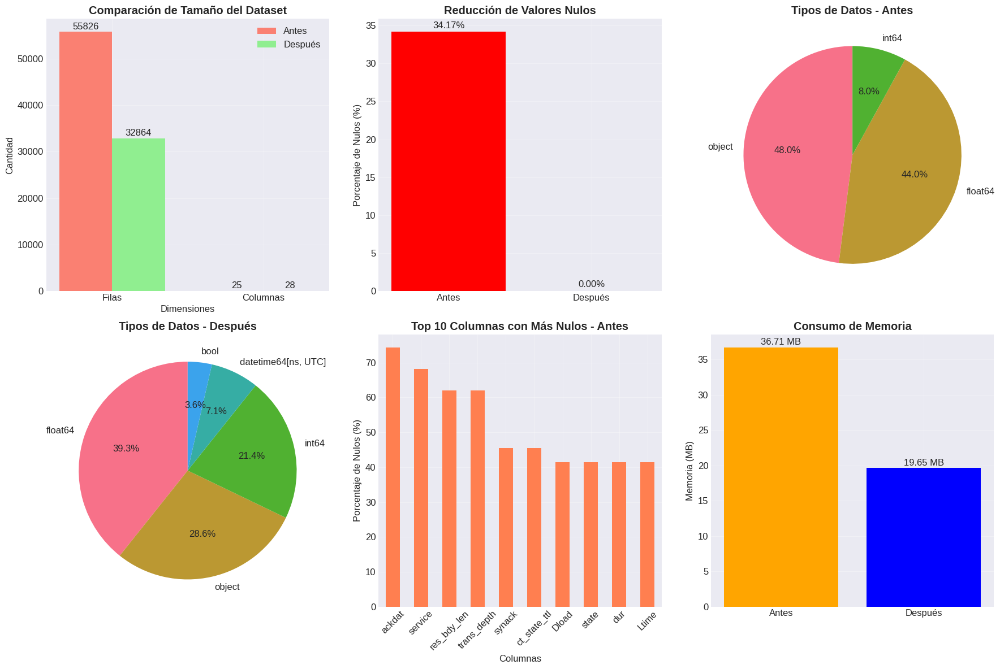


📊 RESUMEN NUMÉRICO:
----------------------------------------
Reducción de filas: 41.13%
Reducción de columnas: -12.00%
Reducción de nulos: 34.17 puntos porcentuales
Reducción de memoria: 46.48%


In [30]:
# ============================================
# VISUALIZACIÓN POST-LIMPIEZA
# ============================================

def visualizar_resultados_limpieza(df_original, df_limpio):
    """
    Comparación visual antes/después de la limpieza
    """
    print("📈 COMPARACIÓN VISUAL ANTES/DESPUÉS DE LA LIMPIEZA")
    print("="*60)

    fig, axes = plt.subplots(2, 3, figsize=(18, 12))

    # 1. Comparación de tamaño
    ax1 = axes[0, 0]
    categorias = ['Filas', 'Columnas']
    antes = [len(df_original), len(df_original.columns)]
    despues = [len(df_limpio), len(df_limpio.columns)]

    x = np.arange(len(categorias))
    width = 0.35

    ax1.bar(x - width/2, antes, width, label='Antes', color='salmon')
    ax1.bar(x + width/2, despues, width, label='Después', color='lightgreen')
    ax1.set_xlabel('Dimensiones')
    ax1.set_ylabel('Cantidad')
    ax1.set_title('Comparación de Tamaño del Dataset', fontweight='bold')
    ax1.set_xticks(x)
    ax1.set_xticklabels(categorias)
    ax1.legend()
    ax1.grid(True, alpha=0.3)

    # Añadir valores en las barras
    for i, v in enumerate(antes):
        ax1.text(i - width/2, v + 0.01*max(antes+despues), str(v), ha='center')
    for i, v in enumerate(despues):
        ax1.text(i + width/2, v + 0.01*max(antes+despues), str(v), ha='center')

    # 2. Porcentaje de nulos
    ax2 = axes[0, 1]
    nulos_antes = (df_original.isnull().sum().sum() / (len(df_original) * len(df_original.columns))) * 100
    nulos_despues = (df_limpio.isnull().sum().sum() / (len(df_limpio) * len(df_limpio.columns))) * 100

    ax2.bar(['Antes', 'Después'], [nulos_antes, nulos_despues],
            color=['red', 'green'])
    ax2.set_ylabel('Porcentaje de Nulos (%)')
    ax2.set_title('Reducción de Valores Nulos', fontweight='bold')
    ax2.grid(True, alpha=0.3)

    # Añadir valores
    for i, v in enumerate([nulos_antes, nulos_despues]):
        ax2.text(i, v + 0.5, f'{v:.2f}%', ha='center')

    # 3. Distribución de tipos de datos (antes)
    ax3 = axes[0, 2]
    tipos_antes = df_original.dtypes.value_counts()
    tipos_antes.plot(kind='pie', ax=ax3, autopct='%1.1f%%', startangle=90)
    ax3.set_title('Tipos de Datos - Antes', fontweight='bold')
    ax3.set_ylabel('')

    # 4. Distribución de tipos de datos (después)
    ax4 = axes[1, 0]
    tipos_despues = df_limpio.dtypes.value_counts()
    tipos_despues.plot(kind='pie', ax=ax4, autopct='%1.1f%%', startangle=90)
    ax4.set_title('Tipos de Datos - Después', fontweight='bold')
    ax4.set_ylabel('')

    # 5. Top 10 columnas con más nulos (antes)
    ax5 = axes[1, 1]
    nulos_por_columna_antes = (df_original.isnull().sum() / len(df_original) * 100).sort_values(ascending=False)
    nulos_por_columna_antes.head(10).plot(kind='bar', ax=ax5, color='coral')
    ax5.set_title('Top 10 Columnas con Más Nulos - Antes', fontweight='bold')
    ax5.set_xlabel('Columnas')
    ax5.set_ylabel('Porcentaje de Nulos (%)')
    ax5.tick_params(axis='x', rotation=45)
    ax5.grid(True, alpha=0.3)

    # 6. Memoria utilizada
    ax6 = axes[1, 2]
    memoria_antes = df_original.memory_usage(deep=True).sum() / (1024 * 1024)
    memoria_despues = df_limpio.memory_usage(deep=True).sum() / (1024 * 1024)

    ax6.bar(['Antes', 'Después'], [memoria_antes, memoria_despues],
            color=['orange', 'blue'])
    ax6.set_ylabel('Memoria (MB)')
    ax6.set_title('Consumo de Memoria', fontweight='bold')
    ax6.grid(True, alpha=0.3)

    for i, v in enumerate([memoria_antes, memoria_despues]):
        ax6.text(i, v + 0.01*max(memoria_antes, memoria_despues), f'{v:.2f} MB', ha='center')

    plt.tight_layout()
    plt.show()

    # Resumen numérico
    print("\n📊 RESUMEN NUMÉRICO:")
    print("-"*40)
    print(f"Reducción de filas: {((len(df_original) - len(df_limpio))/len(df_original)*100):.2f}%")
    print(f"Reducción de columnas: {((len(df_original.columns) - len(df_limpio.columns))/len(df_original.columns)*100):.2f}%")
    print(f"Reducción de nulos: {(nulos_antes - nulos_despues):.2f} puntos porcentuales")
    print(f"Reducción de memoria: {((memoria_antes - memoria_despues)/memoria_antes*100):.2f}%")

# Ejecutar visualización si tenemos ambos datasets
if 'df' in locals() and 'df_limpio' in locals():
    visualizar_resultados_limpieza(df, df_limpio)

In [44]:
# ============================================
# PASO 1: CARGA Y VISTA GENERAL
# ============================================

def paso1_carga_y_vista(df):
    """
    PASO 1: Carga del dataset y primera inspección
    """
    print("🔍 PASO 1: CARGA Y VISTA GENERAL DEL DATASET")
    print("="*60)

    # 1.1. Información básica
    print("📊 INFORMACIÓN BÁSICA:")
    print(f"   • Filas: {df.shape[0]:,}")
    print(f"   • Columnas: {df.shape[1]}")
    print(f"   • Celdas totales: {df.shape[0] * df.shape[1]:,}")
    print(f"   • Memoria usada: {df.memory_usage(deep=True).sum() / (1024*1024):.2f} MB")

    # 1.2. Vista de datos
    print("\n📋 VISTA PREVIA (primeras 5 filas):")
    display(df.head())

    print("\n📋 VISTA FINAL (últimas 5 filas):")
    display(df.tail())

    # 1.3. Información de tipos de datos
    print("\n🏷️  TIPOS DE DATOS POR COLUMNA:")
    tipos_df = pd.DataFrame({
        'Columna': df.columns,
        'Tipo_Dato': df.dtypes.values,
        'Valores_No_Nulos': df.count().values,
        'Valores_Nulos': df.isnull().sum().values,
        'Porcentaje_Nulos': (df.isnull().sum() / len(df) * 100).round(2).values
    })

    # Convertir 'Tipo_Dato' a string antes de ordenar para evitar el TypeError
    tipos_df['Tipo_Dato'] = tipos_df['Tipo_Dato'].astype(str)
    display(tipos_df.sort_values('Tipo_Dato'))

    # 1.4. Resumen estadístico rápido
    print("\n📈 RESUMEN ESTADÍSTICO RÁPIDO:")
    display(df.describe(include='all').round(2))

    return tipos_df

# Ejecutar paso 1
if 'df_limpio' in locals():
    tipos_info = paso1_carga_y_vista(df_limpio)
else:
    print("⚠️ Primero carga tu dataset como 'df_limpio'")

🔍 PASO 1: CARGA Y VISTA GENERAL DEL DATASET
📊 INFORMACIÓN BÁSICA:
   • Filas: 32,864
   • Columnas: 28
   • Celdas totales: 920,192
   • Memoria usada: 19.65 MB

📋 VISTA PREVIA (primeras 5 filas):


,srcip,sport,dstip,dsport,proto,state,dur,sbytes,dbytes,service,...,Stime,Ltime,synack,is_sm_ips_ports,ct_state_ttl,Label,service_was_null,trans_depth_was_null,res_bdy_len_was_null,null_count_per_row
15,fe80:0000:0000:0000:0a00:27ff:fec2:1853,54389.0,ff02:0000:0000:0000:0000:0000:0000:0002,53.0,IPv6-ICMP,new,0.000000,70.0,0.0,MISSING_CAT,...,2025-08-20 16:27:02.544289+00:00,2025-08-20 16:27:02.544289+00:00,True,0,syn_sent,0,1,1,1,7
16,192.168.56.1,62736.0,192.168.56.102,80.0,TCP,closed,19.122956,5425.0,5256.0,http,...,2025-08-20 16:27:06.931891+00:00,2025-08-20 16:27:26.054847+00:00,True,0,closed,0,0,1,1,2
17,192.168.56.1,62735.0,192.168.56.102,80.0,TCP,closed,19.697839,3505.0,15206.0,http,...,2025-08-20 16:27:06.357032+00:00,2025-08-20 16:27:26.054871+00:00,True,0,closed,0,0,1,1,2
18,fe80:0000:0000:0000:0a00:27ff:fec2:1853,54389.0,ff02:0000:0000:0000:0000:0000:0000:0002,53.0,IPv6-ICMP,new,0.000000,70.0,0.0,MISSING_CAT,...,2025-08-20 16:29:08.587360+00:00,2025-08-20 16:29:08.587360+00:00,True,0,syn_sent,0,1,1,1,7
21,192.168.56.102,138.0,192.168.56.255,138.0,UDP,new,0.000044,543.0,0.0,failed,...,2025-08-20 16:30:51.312219+00:00,2025-08-20 16:30:51.312263+00:00,True,0,syn_sent,0,0,1,1,4



📋 VISTA FINAL (últimas 5 filas):


,srcip,sport,dstip,dsport,proto,state,dur,sbytes,dbytes,service,...,Stime,Ltime,synack,is_sm_ips_ports,ct_state_ttl,Label,service_was_null,trans_depth_was_null,res_bdy_len_was_null,null_count_per_row
55819,192.168.56.1,64129.0,224.0.0.252,5355.0,UDP,new,0.410633,136.0,0.0,failed,...,2025-08-04 15:54:22.138583+00:00,2025-08-04 15:54:22.549216+00:00,True,0,syn_sent,1,0,1,1,4
55820,fe80:0000:0000:0000:1e41:9132:c5af:6169,5353.0,ff02:0000:0000:0000:0000:0000:0000:00fb,5353.0,UDP,new,1.003685,752.0,0.0,failed,...,2025-08-04 15:54:22.134151+00:00,2025-08-04 15:54:23.137836+00:00,True,0,syn_sent,1,0,1,1,4
55821,fe80:0000:0000:0000:1e41:9132:c5af:6169,64129.0,ff02:0000:0000:0000:0000:0000:0001:0003,5355.0,UDP,new,0.410626,176.0,0.0,failed,...,2025-08-04 15:54:22.138563+00:00,2025-08-04 15:54:22.549189+00:00,True,0,syn_sent,1,0,1,1,4
55823,10.0.3.15,55136.0,185.125.190.17,443.0,TCP,closed,0.613596,1570.0,11524.0,tls,...,2025-08-04 15:54:07.543156+00:00,2025-08-04 15:54:08.156752+00:00,True,0,closed,1,0,1,1,2
55824,10.0.3.15,44770.0,185.125.190.56,123.0,UDP,established,0.193104,90.0,90.0,ntp,...,2025-08-04 15:52:07.018070+00:00,2025-08-04 15:52:07.211174+00:00,True,0,syn_sent,1,0,1,1,4



🏷️  TIPOS DE DATOS POR COLUMNA:


,Columna,Tipo_Dato,Valores_No_Nulos,Valores_Nulos,Porcentaje_Nulos
20,synack,bool,32864,0,0.0
18,Stime,"datetime64[ns, UTC]",32864,0,0.0
19,Ltime,"datetime64[ns, UTC]",32864,0,0.0
15,dmeansz,float64,32864,0,0.0
14,smeansz,float64,32864,0,0.0
12,Spkts,float64,32864,0,0.0
11,Dload,float64,32864,0,0.0
10,Sload,float64,32864,0,0.0
13,Dpkts,float64,32864,0,0.0
6,dur,float64,32864,0,0.0



📈 RESUMEN ESTADÍSTICO RÁPIDO:


,srcip,sport,dstip,dsport,proto,state,dur,sbytes,dbytes,service,...,Stime,Ltime,synack,is_sm_ips_ports,ct_state_ttl,Label,service_was_null,trans_depth_was_null,res_bdy_len_was_null,null_count_per_row
count,32864,32864.00,32864,32864.00,32864,32864,32864.00,32864.00,3.286400e+04,32864,...,32864,32864,32864,32864.0,32864,32864.00,32864.00,32864.00,32864.00,32864.00
unique,19,NaN,42,NaN,4,3,NaN,NaN,NaN,13,...,NaN,NaN,1,NaN,5,NaN,NaN,NaN,NaN,NaN
top,192.168.56.1,NaN,192.168.56.102,NaN,TCP,new,NaN,NaN,NaN,MISSING_CAT,...,NaN,NaN,True,NaN,syn_sent,NaN,NaN,NaN,NaN,NaN
freq,28953,NaN,30541,NaN,30617,18392,NaN,NaN,NaN,24779,...,NaN,NaN,32864,NaN,18546,NaN,NaN,NaN,NaN,NaN
mean,NaN,53882.10,NaN,2433.82,NaN,NaN,13.44,1160.59,2.627656e+04,NaN,...,2025-08-03 14:44:39.396712192+00:00,2025-08-03 14:31:40.032682240+00:00,NaN,0.0,NaN,0.82,0.75,1.00,1.00,2.95
min,NaN,21.00,NaN,1.00,NaN,NaN,0.00,60.00,0.000000e+00,NaN,...,2025-07-30 11:44:23.680332+00:00,2025-07-30 11:44:24.098834+00:00,NaN,0.0,NaN,0.00,0.00,0.00,0.00,2.00
25%,NaN,51873.00,NaN,53.00,NaN,NaN,2.01,330.00,0.000000e+00,NaN,...,2025-07-30 23:15:03.167807488+00:00,2025-07-30 23:15:18.167219968+00:00,NaN,0.0,NaN,1.00,1.00,1.00,1.00,3.00
50%,NaN,54389.00,NaN,53.00,NaN,NaN,15.00,330.00,0.000000e+00,NaN,...,2025-07-30 23:15:05.339897600+00:00,2025-07-30 23:15:20.337521920+00:00,NaN,0.0,NaN,1.00,1.00,1.00,1.00,3.00
75%,NaN,58163.25,NaN,1025.00,NaN,NaN,15.00,330.00,3.000000e+02,NaN,...,2025-07-31 00:39:40.275854592+00:00,2025-07-31 00:28:57.508824064+00:00,NaN,0.0,NaN,1.00,1.00,1.00,1.00,3.00
max,NaN,65535.00,NaN,65389.00,NaN,NaN,25815.18,7603321.00,2.118969e+08,NaN,...,2025-08-20 19:22:21.953193+00:00,2025-08-20 19:22:37.229722+00:00,NaN,0.0,NaN,1.00,1.00,1.00,1.00,12.00



🔍 PASO 2: ANÁLISIS DE VALORES NULOS
📊 ESTADÍSTICAS GENERALES:
   • Valores nulos totales: 0
   • Porcentaje de nulos: 0.00%
   • Columnas con nulos: 0 de 28
   • Filas con nulos: 0 de 32,864

🎨 MATRIZ DE VALORES NULOS:


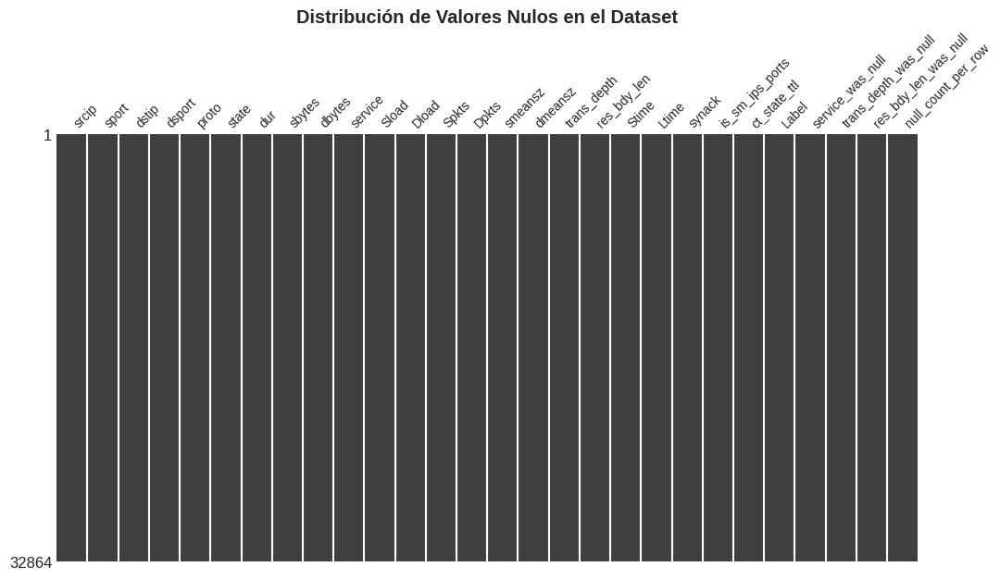


📉 TOP 10 COLUMNAS CON MÁS VALORES NULOS:


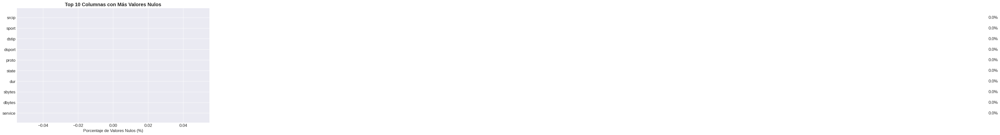


🔗 CORRELACIÓN ENTRE VALORES NULOS:


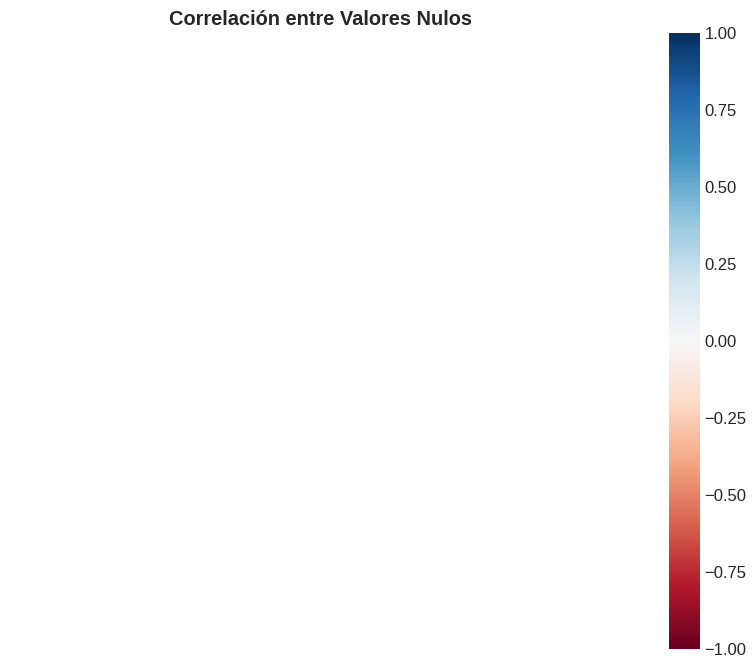


📊 DISTRIBUCIÓN DE NULOS POR FILA:


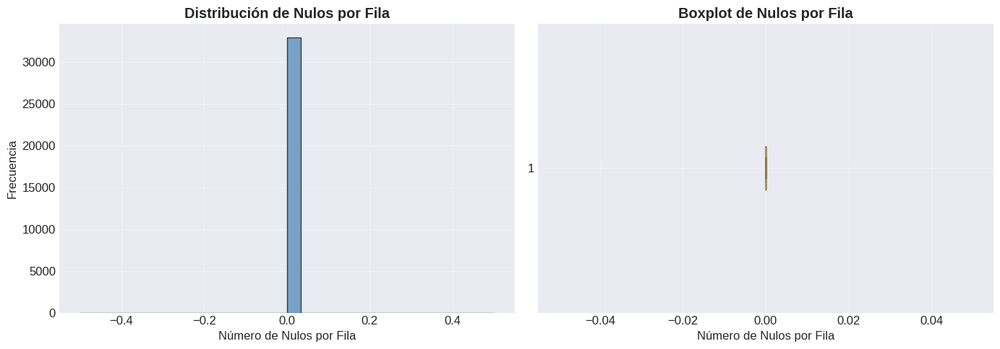

   • Media de nulos por fila: 0.00
   • Mediana de nulos por fila: 0.00
   • Máximo nulos en una fila: 0


In [54]:
# ============================================
# PASO 2: ANÁLISIS DETALLADO DE VALORES NULOS
# ============================================

def paso2_analisis_nulos(df):
    """
    PASO 2: Análisis profundo de valores nulos
    """
    print("\n🔍 PASO 2: ANÁLISIS DE VALORES NULOS")
    print("="*60)

    # 2.1. Estadísticas generales de nulos
    total_nulos = df.isnull().sum().sum()
    total_celdas = df.shape[0] * df.shape[1]
    porcentaje_nulos = (total_nulos / total_celdas) * 100

    print(f"📊 ESTADÍSTICAS GENERALES:")
    print(f"   • Valores nulos totales: {total_nulos:,}")
    print(f"   • Porcentaje de nulos: {porcentaje_nulos:.2f}%")
    print(f"   • Columnas con nulos: {(df.isnull().any()).sum()} de {df.shape[1]}")
    print(f"   • Filas con nulos: {(df.isnull().any(axis=1)).sum()} de {df.shape[0]:,}")

    # 2.2. Matriz de valores nulos
    print("\n🎨 MATRIZ DE VALORES NULOS:")
    fig, ax = plt.subplots(figsize=(12, 6))
    msno.matrix(df, ax=ax, fontsize=10)
    ax.set_title('Distribución de Valores Nulos en el Dataset', fontweight='bold')
    plt.show()

    # 2.3. Top 10 columnas con más nulos
    print("\n📉 TOP 10 COLUMNAS CON MÁS VALORES NULOS:")
    nulos_por_columna = (df.isnull().sum() / len(df) * 100).sort_values(ascending=False)
    top_10_nulos = nulos_por_columna.head(10)

    plt.figure(figsize=(10, 6))
    bars = plt.barh(range(len(top_10_nulos)), top_10_nulos.values, color='coral')
    plt.yticks(range(len(top_10_nulos)), top_10_nulos.index)
    plt.xlabel('Porcentaje de Valores Nulos (%)')
    plt.title('Top 10 Columnas con Más Valores Nulos', fontweight='bold')
    plt.gca().invert_yaxis()

    # Añadir valores en las barras
    for i, bar in enumerate(bars):
        width = bar.get_width()
        plt.text(width + 0.5, bar.get_y() + bar.get_height()/2,
                f'{width:.1f}%', ha='left', va='center')

    plt.tight_layout()
    plt.show()

    # 2.4. Heatmap de correlación de nulos
    print("\n🔗 CORRELACIÓN ENTRE VALORES NULOS:")
    fig, ax = plt.subplots(figsize=(10, 8))
    msno.heatmap(df, ax=ax, cmap='RdBu')
    ax.set_title('Correlación entre Valores Nulos', fontweight='bold')
    plt.show()

    # 2.5. Distribución de nulos por fila
    print("\n📊 DISTRIBUCIÓN DE NULOS POR FILA:")
    nulos_por_fila = df.isnull().sum(axis=1)

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))

    # Histograma
    ax1.hist(nulos_por_fila, bins=30, alpha=0.7, color='steelblue', edgecolor='black')
    ax1.set_xlabel('Número de Nulos por Fila')
    ax1.set_ylabel('Frecuencia')
    ax1.set_title('Distribución de Nulos por Fila', fontweight='bold')
    ax1.grid(True, alpha=0.3)

    # Boxplot
    ax2.boxplot(nulos_por_fila, vert=False)
    ax2.set_xlabel('Número de Nulos por Fila')
    ax2.set_title('Boxplot de Nulos por Fila', fontweight='bold')
    ax2.grid(True, alpha=0.3)

    plt.tight_layout()
    plt.show()

    # Estadísticas
    print(f"   • Media de nulos por fila: {nulos_por_fila.mean():.2f}")
    print(f"   • Mediana de nulos por fila: {nulos_por_fila.median():.2f}")
    print(f"   • Máximo nulos en una fila: {nulos_por_fila.max()}")

    return nulos_por_columna

# Ejecutar paso 2
if 'df_limpio' in locals():
    nulos_info = paso2_analisis_nulos(df_limpio)


🔍 PASO 5: ANÁLISIS DE CORRELACIONES
🔗 Analizando correlaciones entre 17 variables numéricas

📊 MATRIZ DE CORRELACIÓN COMPLETA:


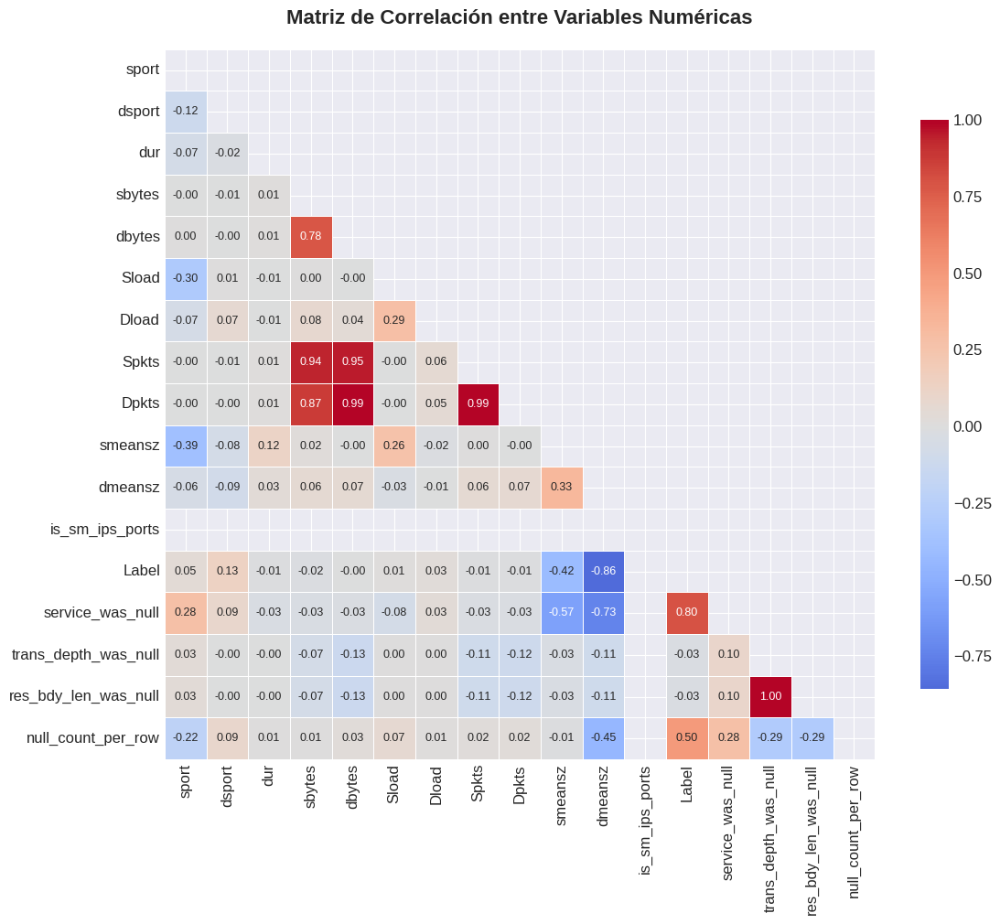


💪 TOP 10 CORRELACIONES MÁS FUERTES:
----------------------------------------
 1. sport ↔ smeansz: -0.386 (NEGATIVA, MODERADA)
 2. sport ↔ Sload: -0.303 (NEGATIVA, MODERADA)
 3. sport ↔ is_sm_ips_ports: nan (NEGATIVA, DÉBIL)
 4. Sload ↔ Dload: 0.287 (POSITIVA, DÉBIL)
 5. sport ↔ service_was_null: 0.277 (POSITIVA, DÉBIL)
 6. Sload ↔ smeansz: 0.264 (POSITIVA, DÉBIL)
 7. sport ↔ null_count_per_row: -0.218 (NEGATIVA, DÉBIL)
 8. dbytes ↔ res_bdy_len_was_null: -0.125 (NEGATIVA, DÉBIL)
 9. sport ↔ dsport: -0.120 (NEGATIVA, DÉBIL)
10. dsport ↔ is_sm_ips_ports: nan (NEGATIVA, DÉBIL)

⚠️  CORRELACIONES PROBLEMÁTICAS (posible multicolinealidad):
----------------------------------------
Las siguientes variables están altamente correlacionadas (>0.8):
   • sbytes ↔ Spkts: 0.937
   • sbytes ↔ Dpkts: 0.874
   • dbytes ↔ Spkts: 0.951
   • dbytes ↔ Dpkts: 0.987
   • Spkts ↔ Dpkts: 0.988
   • dmeansz ↔ Label: -0.855
   • Label ↔ service_was_null: 0.800
   • trans_depth_was_null ↔ res_bdy_len_was_null: 1

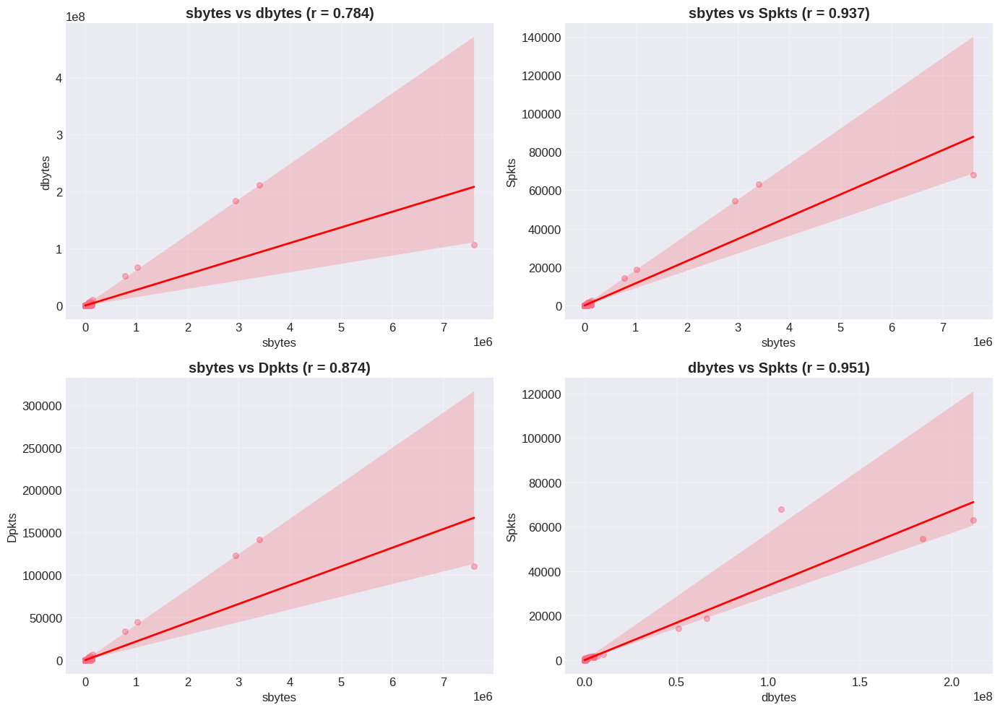


🔗 CORRELACIONES CON VARIABLES CATEGÓRICAS (Point-Biserial):
Correlaciones con 'srcip':
   • is_sm_ips_ports: nan (NEGATIVA)
   • null_count_per_row: 0.449 (POSITIVA)
   • sport: -0.229 (NEGATIVA)
   • service_was_null: -0.139 (NEGATIVA)
   • dsport: 0.112 (POSITIVA)


In [48]:
# ============================================
# PASO 5: ANÁLISIS DE CORRELACIONES
# ============================================

def paso5_analisis_correlaciones(df):
    """
    PASO 5: Análisis de correlaciones entre variables
    """
    print("\n🔍 PASO 5: ANÁLISIS DE CORRELACIONES")
    print("="*60)

    # Variables numéricas para correlación
    numericas = df.select_dtypes(include=[np.number]).columns

    if len(numericas) < 2:
        print("⚠️ Se necesitan al menos 2 variables numéricas para analizar correlaciones")
        return None

    print(f"🔗 Analizando correlaciones entre {len(numericas)} variables numéricas")

    # 5.1. Matriz de correlación completa
    corr_matrix = df[numericas].corr()

    print("\n📊 MATRIZ DE CORRELACIÓN COMPLETA:")

    plt.figure(figsize=(12, 10))
    mask = np.triu(np.ones_like(corr_matrix, dtype=bool))

    sns.heatmap(corr_matrix, mask=mask, cmap='coolwarm', center=0,
               square=True, linewidths=.5, cbar_kws={"shrink": .8},
               annot=True, fmt='.2f', annot_kws={"size": 9})

    plt.title('Matriz de Correlación entre Variables Numéricas',
              fontsize=16, fontweight='bold', pad=20)
    plt.tight_layout()
    plt.show()

    # 5.2. Top 10 correlaciones más fuertes
    print("\n💪 TOP 10 CORRELACIONES MÁS FUERTES:")
    print("-" * 40)

    # Obtener pares únicos de correlaciones
    corr_pairs = []
    for i in range(len(corr_matrix.columns)):
        for j in range(i+1, len(corr_matrix.columns)):
            col1 = corr_matrix.columns[i]
            col2 = corr_matrix.columns[j]
            corr_value = corr_matrix.iloc[i, j]
            corr_pairs.append((abs(corr_value), col1, col2, corr_value))

    # Ordenar por fuerza de correlación (valor absoluto)
    top_correlations = sorted(corr_pairs, key=lambda x: x[0], reverse=True)[:10]

    for i, (abs_corr, col1, col2, corr_val) in enumerate(top_correlations, 1):
        tipo = "POSITIVA" if corr_val > 0 else "NEGATIVA"
        fuerza = "MUY FUERTE" if abs_corr > 0.7 else "FUERTE" if abs_corr > 0.5 else "MODERADA" if abs_corr > 0.3 else "DÉBIL"
        print(f"{i:2}. {col1} ↔ {col2}: {corr_val:.3f} ({tipo}, {fuerza})")

    # 5.3. Correlaciones problemáticas (multicolinealidad)
    print("\n⚠️  CORRELACIONES PROBLEMÁTICAS (posible multicolinealidad):")
    print("-" * 40)

    problematic_corrs = []
    for abs_corr, col1, col2, corr_val in corr_pairs:
        if abs_corr > 0.8:  # Umbral para multicolinealidad
            problematic_corrs.append((col1, col2, corr_val))

    if problematic_corrs:
        print("Las siguientes variables están altamente correlacionadas (>0.8):")
        for col1, col2, corr_val in problematic_corrs:
            print(f"   • {col1} ↔ {col2}: {corr_val:.3f}")
        print("\n💡 Considerar eliminar una de cada par para evitar multicolinealidad")
    else:
        print("✅ No hay correlaciones problemáticas detectadas")

    # 5.4. Scatter plots para correlaciones fuertes
    print("\n📈 SCATTER PLOTS PARA CORRELACIONES FUERTES:")

    # Seleccionar pares con correlación > 0.7
    strong_pairs = [(col1, col2, corr_val) for _, col1, col2, corr_val in corr_pairs
                   if abs(corr_val) > 0.7][:4]  # Mostrar máximo 4

    if strong_pairs:
        n_plots = len(strong_pairs)
        n_cols = 2
        n_rows = int(np.ceil(n_plots / n_cols))

        fig, axes = plt.subplots(n_rows, n_cols, figsize=(14, n_rows * 5))
        axes = axes.flatten() if n_rows > 1 else [axes]

        for idx, (col1, col2, corr_val) in enumerate(strong_pairs):
            if idx < len(axes):
                ax = axes[idx]

                # Scatter plot con regresión lineal
                sns.regplot(x=col1, y=col2, data=df, ax=ax,
                           scatter_kws={'alpha': 0.5, 's': 30},
                           line_kws={'color': 'red', 'linewidth': 2})

                ax.set_title(f'{col1} vs {col2} (r = {corr_val:.3f})', fontweight='bold')
                ax.set_xlabel(col1)
                ax.set_ylabel(col2)
                ax.grid(True, alpha=0.3)

        # Ocultar ejes vacíos
        for idx in range(len(strong_pairs), len(axes)):
            axes[idx].set_visible(False)

        plt.tight_layout()
        plt.show()

    # 5.5. Matriz de correlación con variables categóricas (si hay)
    print("\n🔗 CORRELACIONES CON VARIABLES CATEGÓRICAS (Point-Biserial):")

    categoricas = df.select_dtypes(include=['object']).columns

    if len(categoricas) > 0 and len(numericas) > 0:
        # Tomar primera variable categórica y todas numéricas
        cat_var = categoricas[0]

        # Codificar variable categórica para correlación
        from sklearn.preprocessing import LabelEncoder
        le = LabelEncoder()
        cat_encoded = le.fit_transform(df[cat_var].fillna('Missing'))

        # Calcular correlaciones point-biserial
        corr_with_cat = []
        for num_col in numericas:
            corr = np.corrcoef(cat_encoded, df[num_col].fillna(df[num_col].mean()))[0, 1]
            corr_with_cat.append((num_col, abs(corr), corr))

        # Ordenar por fuerza de correlación
        corr_with_cat.sort(key=lambda x: x[1], reverse=True)

        print(f"Correlaciones con '{cat_var}':")
        for num_col, abs_corr, corr in corr_with_cat[:5]:  # Mostrar top 5
            tipo = "POSITIVA" if corr > 0 else "NEGATIVA"
            print(f"   • {num_col}: {corr:.3f} ({tipo})")

    return corr_matrix, top_correlations

# Ejecutar paso 5
if 'df_limpio' in locals():
    corr_matrix, top_corrs = paso5_analisis_correlaciones(df_limpio)


🔍 PASO 6: ANÁLISIS DE RELACIONES Y PATRONES

📊 MATRIZ DE SCATTER PLOTS (primeras 5 variables numéricas):


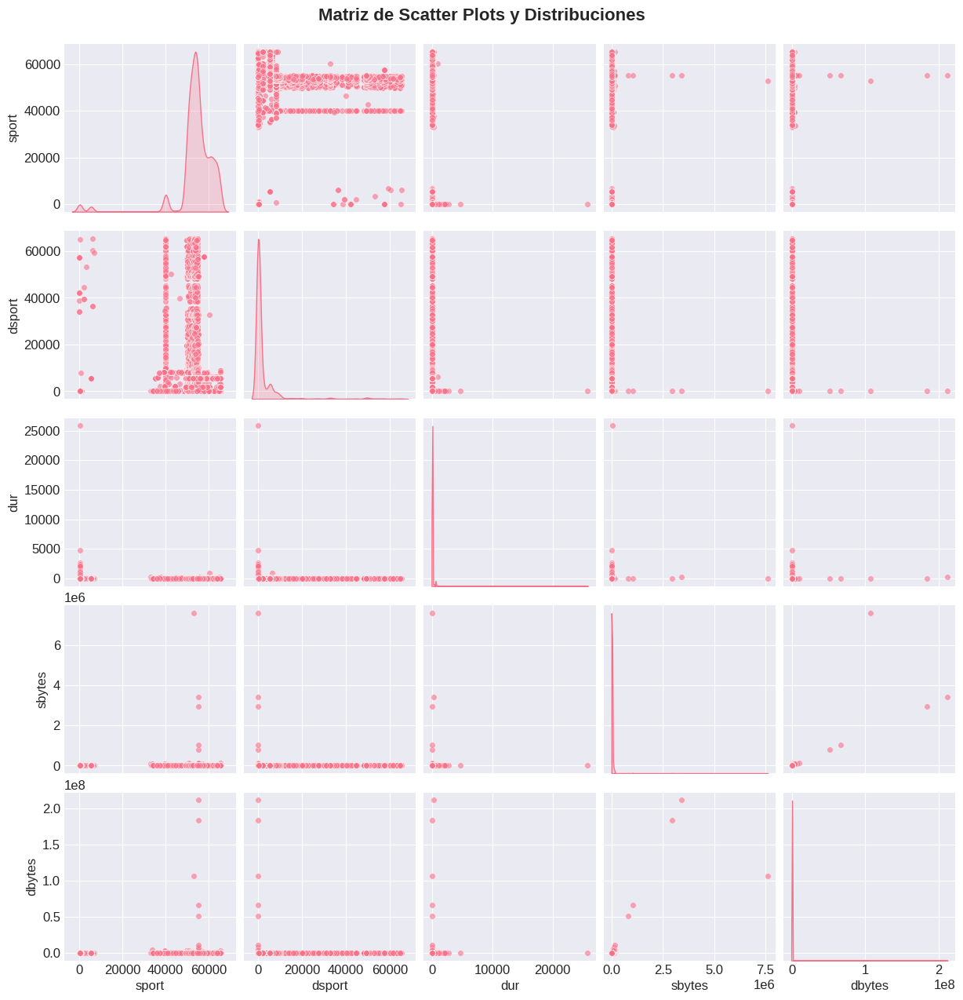


🔀 INTERACCIONES CATEGÓRICAS-NUMÉRICAS:
Analizando srcip vs sport


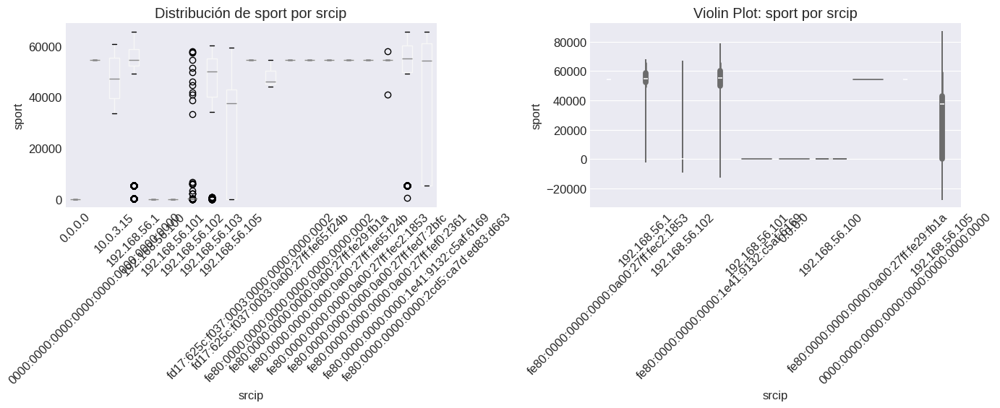


📅 ANÁLISIS TEMPORAL (si aplica):
Columnas temporales encontradas: Stime, Ltime


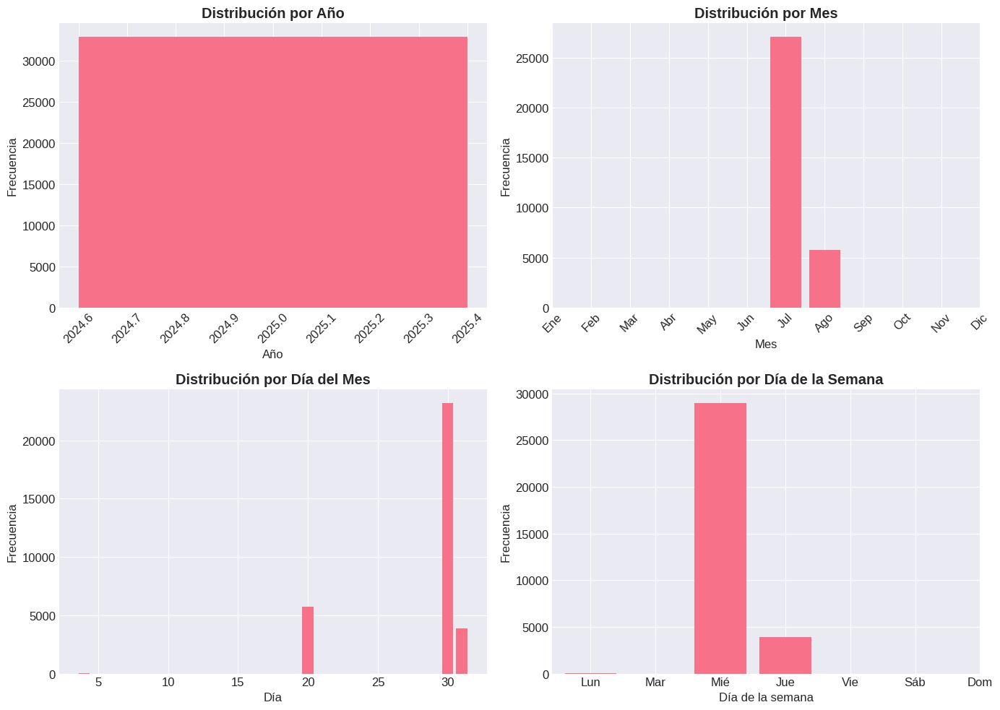

In [50]:
# ============================================
# PASO 6: ANÁLISIS DE RELACIONES Y PATRONES
# ============================================

def paso6_analisis_relaciones(df):
    """
    PASO 6: Análisis de relaciones y patrones complejos
    """
    print("\n🔍 PASO 6: ANÁLISIS DE RELACIONES Y PATRONES")
    print("="*60)

    # 6.1. Análisis de pares (pairplot) para variables clave
    numericas = df.select_dtypes(include=[np.number]).columns

    if len(numericas) >= 3:
        print("\n📊 MATRIZ DE SCATTER PLOTS (primeras 5 variables numéricas):")

        vars_pairplot = numericas[:5]

        # Crear pairplot con Seaborn
        pairplot_data = df[vars_pairplot].dropna()

        if len(pairplot_data) > 0:
            g = sns.pairplot(pairplot_data, diag_kind='kde',
                            plot_kws={'alpha': 0.6, 's': 30},
                            diag_kws={'fill': True})

            g.fig.suptitle('Matriz de Scatter Plots y Distribuciones',
                          y=1.02, fontsize=16, fontweight='bold')
            plt.show()

    # 6.2. Análisis de interacciones categóricas-numéricas
    print("\n🔀 INTERACCIONES CATEGÓRICAS-NUMÉRICAS:")

    categoricas = df.select_dtypes(include=['object', 'category']).columns
    numericas = df.select_dtypes(include=[np.number]).columns

    if len(categoricas) > 0 and len(numericas) > 0:
        # Tomar primera variable categórica y primera numérica
        cat_var = categoricas[0]
        num_var = numericas[0]

        print(f"Analizando {cat_var} vs {num_var}")

        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 6))

        # Boxplot por categoría
        df.boxplot(column=num_var, by=cat_var, ax=ax1, grid=False)
        ax1.set_title(f'Distribución de {num_var} por {cat_var}')
        ax1.set_xlabel(cat_var)
        ax1.set_ylabel(num_var)
        ax1.tick_params(axis='x', rotation=45)

        # Violin plot
        categories = df[cat_var].unique()[:10]  # Limitar a 10 categorías
        data_to_plot = df[df[cat_var].isin(categories)]

        if len(data_to_plot) > 0:
            sns.violinplot(x=cat_var, y=num_var, data=data_to_plot, ax=ax2)
            ax2.set_title(f'Violin Plot: {num_var} por {cat_var}')
            ax2.set_xlabel(cat_var)
            ax2.set_ylabel(num_var)
            ax2.tick_params(axis='x', rotation=45)

        plt.suptitle('')
        plt.tight_layout()
        plt.show()

    # 6.3. Análisis temporal (si hay fechas)
    print("\n📅 ANÁLISIS TEMPORAL (si aplica):")

    date_cols = [col for col in df.columns if any(
        keyword in col.lower() for keyword in ['date', 'time', 'fecha', 'hora', 'year', 'month', 'day']
    )]

    if date_cols:
        print(f"Columnas temporales encontradas: {', '.join(date_cols)}")

        # Analizar primera columna de fecha
        fecha_col = date_cols[0]

        try:
            # Intentar convertir a datetime
            df_temp = df.copy()
            df_temp[fecha_col] = pd.to_datetime(df_temp[fecha_col], errors='coerce')

            # Extraer componentes temporales
            df_temp['year'] = df_temp[fecha_col].dt.year
            df_temp['month'] = df_temp[fecha_col].dt.month
            df_temp['day'] = df_temp[fecha_col].dt.day
            df_temp['weekday'] = df_temp[fecha_col].dt.weekday

            # Visualizar tendencias temporales
            fig, axes = plt.subplots(2, 2, figsize=(14, 10))

            # Distribución por año
            if 'year' in df_temp.columns:
                year_counts = df_temp['year'].value_counts().sort_index()
                axes[0, 0].bar(year_counts.index, year_counts.values)
                axes[0, 0].set_title('Distribución por Año', fontweight='bold')
                axes[0, 0].set_xlabel('Año')
                axes[0, 0].set_ylabel('Frecuencia')
                axes[0, 0].tick_params(axis='x', rotation=45)

            # Distribución por mes
            if 'month' in df_temp.columns:
                month_counts = df_temp['month'].value_counts().sort_index()
                meses = ['Ene', 'Feb', 'Mar', 'Abr', 'May', 'Jun',
                        'Jul', 'Ago', 'Sep', 'Oct', 'Nov', 'Dic']
                axes[0, 1].bar(month_counts.index, month_counts.values)
                axes[0, 1].set_title('Distribución por Mes', fontweight='bold')
                axes[0, 1].set_xlabel('Mes')
                axes[0, 1].set_ylabel('Frecuencia')
                axes[0, 1].set_xticks(range(1, 13))
                axes[0, 1].set_xticklabels(meses, rotation=45)

            # Distribución por día del mes
            if 'day' in df_temp.columns:
                day_counts = df_temp['day'].value_counts().sort_index()
                axes[1, 0].bar(day_counts.index, day_counts.values)
                axes[1, 0].set_title('Distribución por Día del Mes', fontweight='bold')
                axes[1, 0].set_xlabel('Día')
                axes[1, 0].set_ylabel('Frecuencia')

            # Distribución por día de la semana
            if 'weekday' in df_temp.columns:
                weekday_counts = df_temp['weekday'].value_counts().sort_index()
                dias = ['Lun', 'Mar', 'Mié', 'Jue', 'Vie', 'Sáb', 'Dom']
                axes[1, 1].bar(weekday_counts.index, weekday_counts.values)
                axes[1, 1].set_title('Distribución por Día de la Semana', fontweight='bold')
                axes[1, 1].set_xlabel('Día de la semana')
                axes[1, 1].set_ylabel('Frecuencia')
                axes[1, 1].set_xticks(range(7))
                axes[1, 1].set_xticklabels(dias)

            plt.tight_layout()
            plt.show()

        except Exception as e:
            print(f"⚠️ Error en análisis temporal: {e}")

    # 6.4. Heatmap de valores (para datasets más pequeños)
    if len(df) <= 1000 and len(df.columns) <= 20:
        print("\n🎨 HEATMAP DE VALORES (dataset pequeño):")

        # Normalizar datos numéricos para mejor visualización
        from sklearn.preprocessing import MinMaxScaler

        numeric_cols = df.select_dtypes(include=[np.number]).columns
        if len(numeric_cols) > 0:
            df_numeric = df[numeric_cols].copy()

            # Escalar
            scaler = MinMaxScaler()
            df_scaled = pd.DataFrame(scaler.fit_transform(df_numeric),
                                    columns=df_numeric.columns)

            # Heatmap
            plt.figure(figsize=(12, 8))
            sns.heatmap(df_scaled, cmap='viridis', cbar_kws={'label': 'Valor escalado'})
            plt.title('Heatmap de Valores (Escalados 0-1)', fontweight='bold')
            plt.xlabel('Variables')
            plt.ylabel('Observaciones')
            plt.tight_layout()
            plt.show()

# Ejecutar paso 6
if 'df_limpio' in locals():
    paso6_analisis_relaciones(df_limpio)

In [51]:
# ============================================
# PASO 7: REPORTE FINAL Y INSIGHTS
# ============================================

def paso7_reporte_final(df):
    """
    PASO 7: Generar reporte final y insights clave
    """
    print("\n" + "📋"*60)
    print("📋 PASO 7: REPORTE FINAL DEL ANÁLISIS EXPLORATORIO")
    print("📋"*60)

    # 7.1. Resumen ejecutivo
    print("\n🎯 RESUMEN EJECUTIVO:")
    print("="*60)

    # Dimensiones
    print(f"📊 DIMENSIONES:")
    print(f"   • Filas: {df.shape[0]:,}")
    print(f"   • Columnas: {df.shape[1]}")

    # Tipos de variables
    numericas = df.select_dtypes(include=[np.number]).columns
    categoricas = df.select_dtypes(include=['object', 'category']).columns

    print(f"\n🏷️  TIPOS DE VARIABLES:")
    print(f"   • Numéricas: {len(numericas)}")
    print(f"   • Categóricas: {len(categoricas)}")

    # Calidad de datos
    nulos_totales = df.isnull().sum().sum()
    porcentaje_nulos = (nulos_totales / (df.shape[0] * df.shape[1])) * 100

    print(f"\n✅ CALIDAD DE DATOS:")
    print(f"   • Valores nulos: {nulos_totales:,} ({porcentaje_nulos:.2f}%)")
    print(f"   • Columnas con nulos: {(df.isnull().any()).sum()}")

    # 7.2. Insights clave identificados
    print("\n🔍 INSIGHTS CLAVE IDENTIFICADOS:")
    print("="*60)

    insights = []

    # Insight 1: Variables con mayor varianza
    if len(numericas) > 0:
        varianzas = df[numericas].var().sort_values(ascending=False)
        top_3_varianza = varianzas.head(3)
        insights.append(f"Variables más variables: {', '.join(top_3_varianza.index.tolist())}")

    # Insight 2: Variables con outliers significativos
    if len(numericas) > 0:
        outliers_vars = []
        for col in numericas[:10]:  # Revisar solo primeras 10
            Q1 = df[col].quantile(0.25)
            Q3 = df[col].quantile(0.75)
            IQR = Q3 - Q1
            outliers = df[(df[col] < Q1 - 1.5*IQR) | (df[col] > Q3 + 1.5*IQR)]
            if len(outliers) / len(df) > 0.05:  # Más del 5%
                outliers_vars.append(col)

        if outliers_vars:
            insights.append(f"Variables con outliers (>5%): {', '.join(outliers_vars[:3])}")

    # Insight 3: Variables categóricas dominantes
    if len(categoricas) > 0:
        dominant_cats = []
        for col in categoricas[:3]:
            top_val = df[col].value_counts().index[0] if not df[col].value_counts().empty else 'N/A'
            freq = df[col].value_counts().iloc[0] if not df[col].value_counts().empty else 0
            perc = (freq / len(df)) * 100
            if perc > 50:
                dominant_cats.append(f"'{col}': '{top_val}' ({perc:.1f}%)")

        if dominant_cats:
            insights.append(f"Categorías dominantes: {'; '.join(dominant_cats)}")

    # Insight 4: Correlaciones fuertes
    if len(numericas) >= 2:
        corr_matrix = df[numericas].corr()
        strong_corrs = []
        for i in range(len(corr_matrix.columns)):
            for j in range(i+1, len(corr_matrix.columns)):
                if abs(corr_matrix.iloc[i, j]) > 0.7:
                    col1, col2 = corr_matrix.columns[i], corr_matrix.columns[j]
                    strong_corrs.append(f"{col1}-{col2}")

        if strong_corrs:
            insights.append(f"Correlaciones fuertes (>0.7): {', '.join(strong_corrs[:3])}")

    # Insight 5: Variables con alta cardinalidad
    if len(categoricas) > 0:
        high_card_vars = []
        for col in categoricas:
            if df[col].nunique() / len(df) > 0.5:
                high_card_vars.append(col)

        if high_card_vars:
            insights.append(f"Variables con alta cardinalidad: {', '.join(high_card_vars[:3])}")

    # Mostrar insights
    for i, insight in enumerate(insights, 1):
        print(f"{i}. {insight}")

    # 7.3. Recomendaciones para siguientes pasos
    print("\n💡 RECOMENDACIONES PARA SIGUIENTES PASOS:")
    print("="*60)

    recomendaciones = []

    if porcentaje_nulos > 10:
        recomendaciones.append("Considerar imputación avanzada de valores nulos")

    if len([col for col in categoricas if df[col].nunique() > 50]) > 0:
        recomendaciones.append("Aplicar encoding a variables categóricas con alta cardinalidad")

    if len(numericas) > 20:
        recomendaciones.append("Considerar reducción de dimensionalidad (PCA)")

    if any('date' in col.lower() or 'time' in col.lower() for col in df.columns):
        recomendaciones.append("Realizar análisis de series temporales")

    if len(df) > 10000:
        recomendaciones.append("Considerar técnicas de muestreo para análisis más rápido")

    # Recomendaciones por defecto
    recomendaciones.extend([
        "Realizar feature engineering para crear nuevas variables",
        "Aplicar escalado a variables numéricas para modelos de ML",
        "Dividir dataset en train/validation/test para modelado",
        "Considerar balanceo de clases si hay desequilibrio en la variable objetivo"
    ])

    for i, rec in enumerate(recomendaciones[:8], 1):  # Mostrar solo 8
        print(f"{i}. {rec}")

    # 7.4. Guardar reporte completo
    print("\n💾 GUARDANDO REPORTE COMPLETO...")

    try:
        with open('/content/reporte_eda_completo.txt', 'w') as f:
            f.write("="*70 + "\n")
            f.write("REPORTE COMPLETO DE ANÁLISIS EXPLORATORIO (EDA)\n")
            f.write("="*70 + "\n\n")

            f.write(f"Fecha de análisis: {pd.Timestamp.now()}\n")
            f.write(f"Dataset: {df.shape[0]} filas × {df.shape[1]} columnas\n\n")

            f.write("RESUMEN EJECUTIVO:\n")
            f.write("-"*40 + "\n")
            f.write(f"Filas: {df.shape[0]:,}\n")
            f.write(f"Columnas: {df.shape[1]}\n")
            f.write(f"Variables numéricas: {len(numericas)}\n")
            f.write(f"Variables categóricas: {len(categoricas)}\n")
            f.write(f"Valores nulos: {nulos_totales:,} ({porcentaje_nulos:.2f}%)\n\n")

            f.write("INSIGHTS CLAVE:\n")
            f.write("-"*40 + "\n")
            for insight in insights:
                f.write(f"• {insight}\n")

            f.write("\nRECOMENDACIONES:\n")
            f.write("-"*40 + "\n")
            for rec in recomendaciones:
                f.write(f"• {rec}\n")

            f.write("\nVARIABLES DEL DATASET:\n")
            f.write("-"*40 + "\n")
            for col in df.columns:
                dtype = str(df[col].dtype)
                unique = df[col].nunique()
                nulls = df[col].isnull().sum()
                null_pct = (nulls / len(df) * 100) if len(df) > 0 else 0
                f.write(f"{col}: {dtype} | Únicos: {unique} | Nulos: {nulls} ({null_pct:.1f}%)\n")

        print("✅ Reporte guardado en: /content/reporte_eda_completo.txt")

        # Guardar también como HTML con mejor formato
        with open('/content/reporte_eda_completo.html', 'w') as f:
            f.write('''<!DOCTYPE html>
<html>
<head>
    <title>Reporte EDA Completo</title>
    <style>
        body { font-family: Arial, sans-serif; margin: 40px; }
        h1 { color: #2c3e50; }
        h2 { color: #3498db; border-bottom: 2px solid #3498db; padding-bottom: 5px; }
        .insight { background-color: #f8f9fa; padding: 10px; margin: 10px 0; border-left: 4px solid #2ecc71; }
        .recommendation { background-color: #e8f4fc; padding: 10px; margin: 10px 0; border-left: 4px solid #3498db; }
        table { border-collapse: collapse; width: 100%; margin: 20px 0; }
        th, td { border: 1px solid #ddd; padding: 8px; text-align: left; }
        th { background-color: #f2f2f2; }
    </style>
</head>
<body>
    <h1>📊 Reporte de Análisis Exploratorio (EDA)</h1>
    <p><strong>Fecha:</strong> ''' + str(pd.Timestamp.now()) + '''</p>
    <p><strong>Dataset:</strong> ''' + f"{df.shape[0]:,} filas × {df.shape[1]} columnas" + '''</p>

    <h2>📈 Resumen Ejecutivo</h2>
    <ul>
        <li><strong>Filas:</strong> ''' + f"{df.shape[0]:,}" + '''</li>
        <li><strong>Columnas:</strong> ''' + str(df.shape[1]) + '''</li>
        <li><strong>Variables numéricas:</strong> ''' + str(len(numericas)) + '''</li>
        <li><strong>Variables categóricas:</strong> ''' + str(len(categoricas)) + '''</li>
        <li><strong>Valores nulos:</strong> ''' + f"{nulos_totales:,} ({porcentaje_nulos:.2f}%)" + '''</li>
    </ul>

    <h2>🔍 Insights Clave</h2>''')

            for insight in insights:
                f.write(f'<div class="insight">📌 {insight}</div>\n')

            f.write('''
    <h2>💡 Recomendaciones</h2>''')

            for rec in recomendaciones[:10]:
                f.write(f'<div class="recommendation">✅ {rec}</div>\n')

            f.write('''
    <h2>📋 Variables del Dataset</h2>
    <table>
        <tr>
            <th>Variable</th>
            <th>Tipo</th>
            <th>Valores Únicos</th>
            <th>Valores Nulos</th>
            <th>% Nulos</th>
        </tr>''')

            for col in df.columns:
                dtype = str(df[col].dtype)
                unique = df[col].nunique()
                nulls = df[col].isnull().sum()
                null_pct = (nulls / len(df) * 100) if len(df) > 0 else 0
                f.write(f'''<tr>
            <td>{col}</td>
            <td>{dtype}</td>
            <td>{unique}</td>
            <td>{nulls}</td>
            <td>{null_pct:.1f}%</td>
        </tr>''')

            f.write('''</table>
</body>
</html>''')

        print("✅ Reporte HTML guardado en: /content/reporte_eda_completo.html")
        print("📂 Los reportes están en el panel de archivos de Colab")

    except Exception as e:
        print(f"⚠️ Error al guardar reportes: {e}")

    print("\n" + "✅"*60)
    print("✅ ANÁLISIS EXPLORATORIO (EDA) COMPLETADO")
    print("✅"*60)

    return insights

# Ejecutar paso 7
if 'df_limpio' in locals():
    insights_finales = paso7_reporte_final(df_limpio)


📋📋📋📋📋📋📋📋📋📋📋📋📋📋📋📋📋📋📋📋📋📋📋📋📋📋📋📋📋📋📋📋📋📋📋📋📋📋📋📋📋📋📋📋📋📋📋📋📋📋📋📋📋📋📋📋📋📋📋📋
📋 PASO 7: REPORTE FINAL DEL ANÁLISIS EXPLORATORIO
📋📋📋📋📋📋📋📋📋📋📋📋📋📋📋📋📋📋📋📋📋📋📋📋📋📋📋📋📋📋📋📋📋📋📋📋📋📋📋📋📋📋📋📋📋📋📋📋📋📋📋📋📋📋📋📋📋📋📋📋

🎯 RESUMEN EJECUTIVO:
📊 DIMENSIONES:
   • Filas: 32,864
   • Columnas: 28

🏷️  TIPOS DE VARIABLES:
   • Numéricas: 17
   • Categóricas: 8

✅ CALIDAD DE DATOS:
   • Valores nulos: 0 (0.00%)
   • Columnas con nulos: 0

🔍 INSIGHTS CLAVE IDENTIFICADOS:
1. Variables más variables: dbytes, Sload, Dload
2. Variables con outliers (>5%): sport, dsport, sbytes
3. Categorías dominantes: 'srcip': '192.168.56.1' (88.1%); 'dstip': '192.168.56.102' (92.9%); 'proto': 'TCP' (93.2%)
4. Correlaciones fuertes (>0.7): sbytes-dbytes, sbytes-Spkts, sbytes-Dpkts

💡 RECOMENDACIONES PARA SIGUIENTES PASOS:
1. Aplicar encoding a variables categóricas con alta cardinalidad
2. Realizar análisis de series temporales
3. Considerar técnicas de muestreo para análisis más rápido
4. Realizar feature engineering para crear nuevas variables
5. Aplicar e

🚀 INICIANDO PIPELINE COMPLETO DE EDA
🔍 PASO 1: CARGA Y VISTA GENERAL DEL DATASET
📊 INFORMACIÓN BÁSICA:
   • Filas: 32,864
   • Columnas: 28
   • Celdas totales: 920,192
   • Memoria usada: 19.65 MB

📋 VISTA PREVIA (primeras 5 filas):


,srcip,sport,dstip,dsport,proto,state,dur,sbytes,dbytes,service,...,Stime,Ltime,synack,is_sm_ips_ports,ct_state_ttl,Label,service_was_null,trans_depth_was_null,res_bdy_len_was_null,null_count_per_row
15,fe80:0000:0000:0000:0a00:27ff:fec2:1853,54389.0,ff02:0000:0000:0000:0000:0000:0000:0002,53.0,IPv6-ICMP,new,0.000000,70.0,0.0,MISSING_CAT,...,2025-08-20 16:27:02.544289+00:00,2025-08-20 16:27:02.544289+00:00,True,0,syn_sent,0,1,1,1,7
16,192.168.56.1,62736.0,192.168.56.102,80.0,TCP,closed,19.122956,5425.0,5256.0,http,...,2025-08-20 16:27:06.931891+00:00,2025-08-20 16:27:26.054847+00:00,True,0,closed,0,0,1,1,2
17,192.168.56.1,62735.0,192.168.56.102,80.0,TCP,closed,19.697839,3505.0,15206.0,http,...,2025-08-20 16:27:06.357032+00:00,2025-08-20 16:27:26.054871+00:00,True,0,closed,0,0,1,1,2
18,fe80:0000:0000:0000:0a00:27ff:fec2:1853,54389.0,ff02:0000:0000:0000:0000:0000:0000:0002,53.0,IPv6-ICMP,new,0.000000,70.0,0.0,MISSING_CAT,...,2025-08-20 16:29:08.587360+00:00,2025-08-20 16:29:08.587360+00:00,True,0,syn_sent,0,1,1,1,7
21,192.168.56.102,138.0,192.168.56.255,138.0,UDP,new,0.000044,543.0,0.0,failed,...,2025-08-20 16:30:51.312219+00:00,2025-08-20 16:30:51.312263+00:00,True,0,syn_sent,0,0,1,1,4



📋 VISTA FINAL (últimas 5 filas):


,srcip,sport,dstip,dsport,proto,state,dur,sbytes,dbytes,service,...,Stime,Ltime,synack,is_sm_ips_ports,ct_state_ttl,Label,service_was_null,trans_depth_was_null,res_bdy_len_was_null,null_count_per_row
55819,192.168.56.1,64129.0,224.0.0.252,5355.0,UDP,new,0.410633,136.0,0.0,failed,...,2025-08-04 15:54:22.138583+00:00,2025-08-04 15:54:22.549216+00:00,True,0,syn_sent,1,0,1,1,4
55820,fe80:0000:0000:0000:1e41:9132:c5af:6169,5353.0,ff02:0000:0000:0000:0000:0000:0000:00fb,5353.0,UDP,new,1.003685,752.0,0.0,failed,...,2025-08-04 15:54:22.134151+00:00,2025-08-04 15:54:23.137836+00:00,True,0,syn_sent,1,0,1,1,4
55821,fe80:0000:0000:0000:1e41:9132:c5af:6169,64129.0,ff02:0000:0000:0000:0000:0000:0001:0003,5355.0,UDP,new,0.410626,176.0,0.0,failed,...,2025-08-04 15:54:22.138563+00:00,2025-08-04 15:54:22.549189+00:00,True,0,syn_sent,1,0,1,1,4
55823,10.0.3.15,55136.0,185.125.190.17,443.0,TCP,closed,0.613596,1570.0,11524.0,tls,...,2025-08-04 15:54:07.543156+00:00,2025-08-04 15:54:08.156752+00:00,True,0,closed,1,0,1,1,2
55824,10.0.3.15,44770.0,185.125.190.56,123.0,UDP,established,0.193104,90.0,90.0,ntp,...,2025-08-04 15:52:07.018070+00:00,2025-08-04 15:52:07.211174+00:00,True,0,syn_sent,1,0,1,1,4



🏷️  TIPOS DE DATOS POR COLUMNA:


,Columna,Tipo_Dato,Valores_No_Nulos,Valores_Nulos,Porcentaje_Nulos
20,synack,bool,32864,0,0.0
18,Stime,"datetime64[ns, UTC]",32864,0,0.0
19,Ltime,"datetime64[ns, UTC]",32864,0,0.0
15,dmeansz,float64,32864,0,0.0
14,smeansz,float64,32864,0,0.0
12,Spkts,float64,32864,0,0.0
11,Dload,float64,32864,0,0.0
10,Sload,float64,32864,0,0.0
13,Dpkts,float64,32864,0,0.0
6,dur,float64,32864,0,0.0



📈 RESUMEN ESTADÍSTICO RÁPIDO:


,srcip,sport,dstip,dsport,proto,state,dur,sbytes,dbytes,service,...,Stime,Ltime,synack,is_sm_ips_ports,ct_state_ttl,Label,service_was_null,trans_depth_was_null,res_bdy_len_was_null,null_count_per_row
count,32864,32864.00,32864,32864.00,32864,32864,32864.00,32864.00,3.286400e+04,32864,...,32864,32864,32864,32864.0,32864,32864.00,32864.00,32864.00,32864.00,32864.00
unique,19,NaN,42,NaN,4,3,NaN,NaN,NaN,13,...,NaN,NaN,1,NaN,5,NaN,NaN,NaN,NaN,NaN
top,192.168.56.1,NaN,192.168.56.102,NaN,TCP,new,NaN,NaN,NaN,MISSING_CAT,...,NaN,NaN,True,NaN,syn_sent,NaN,NaN,NaN,NaN,NaN
freq,28953,NaN,30541,NaN,30617,18392,NaN,NaN,NaN,24779,...,NaN,NaN,32864,NaN,18546,NaN,NaN,NaN,NaN,NaN
mean,NaN,53882.10,NaN,2433.82,NaN,NaN,13.44,1160.59,2.627656e+04,NaN,...,2025-08-03 14:44:39.396712192+00:00,2025-08-03 14:31:40.032682240+00:00,NaN,0.0,NaN,0.82,0.75,1.00,1.00,2.95
min,NaN,21.00,NaN,1.00,NaN,NaN,0.00,60.00,0.000000e+00,NaN,...,2025-07-30 11:44:23.680332+00:00,2025-07-30 11:44:24.098834+00:00,NaN,0.0,NaN,0.00,0.00,0.00,0.00,2.00
25%,NaN,51873.00,NaN,53.00,NaN,NaN,2.01,330.00,0.000000e+00,NaN,...,2025-07-30 23:15:03.167807488+00:00,2025-07-30 23:15:18.167219968+00:00,NaN,0.0,NaN,1.00,1.00,1.00,1.00,3.00
50%,NaN,54389.00,NaN,53.00,NaN,NaN,15.00,330.00,0.000000e+00,NaN,...,2025-07-30 23:15:05.339897600+00:00,2025-07-30 23:15:20.337521920+00:00,NaN,0.0,NaN,1.00,1.00,1.00,1.00,3.00
75%,NaN,58163.25,NaN,1025.00,NaN,NaN,15.00,330.00,3.000000e+02,NaN,...,2025-07-31 00:39:40.275854592+00:00,2025-07-31 00:28:57.508824064+00:00,NaN,0.0,NaN,1.00,1.00,1.00,1.00,3.00
max,NaN,65535.00,NaN,65389.00,NaN,NaN,25815.18,7603321.00,2.118969e+08,NaN,...,2025-08-20 19:22:21.953193+00:00,2025-08-20 19:22:37.229722+00:00,NaN,0.0,NaN,1.00,1.00,1.00,1.00,12.00



🔍 PASO 2: ANÁLISIS DE VALORES NULOS
📊 ESTADÍSTICAS GENERALES:
   • Valores nulos totales: 0
   • Porcentaje de nulos: 0.00%
   • Columnas con nulos: 0 de 28
   • Filas con nulos: 0 de 32,864

🎨 MATRIZ DE VALORES NULOS:


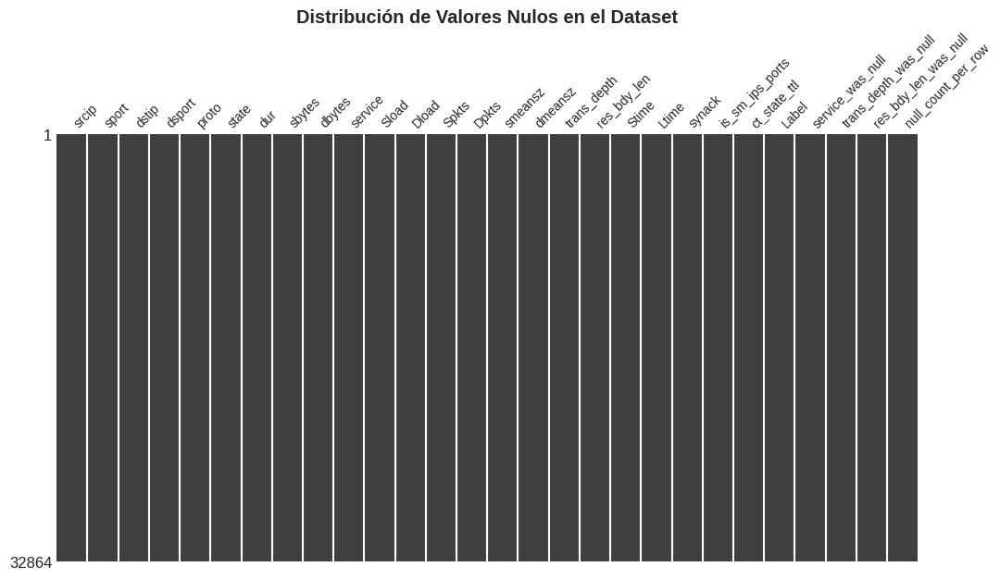


📉 TOP 10 COLUMNAS CON MÁS VALORES NULOS:


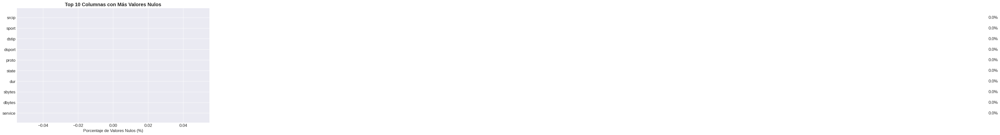


🔗 CORRELACIÓN ENTRE VALORES NULOS:


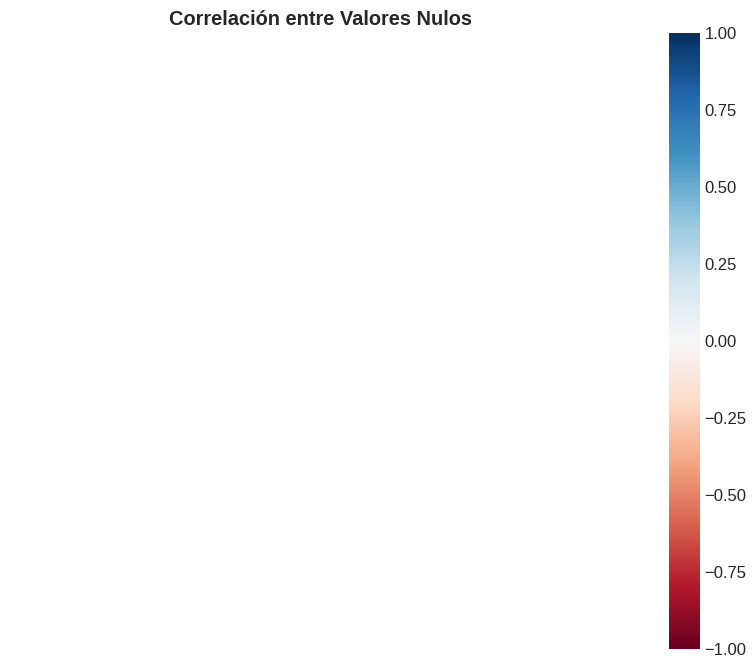


📊 DISTRIBUCIÓN DE NULOS POR FILA:


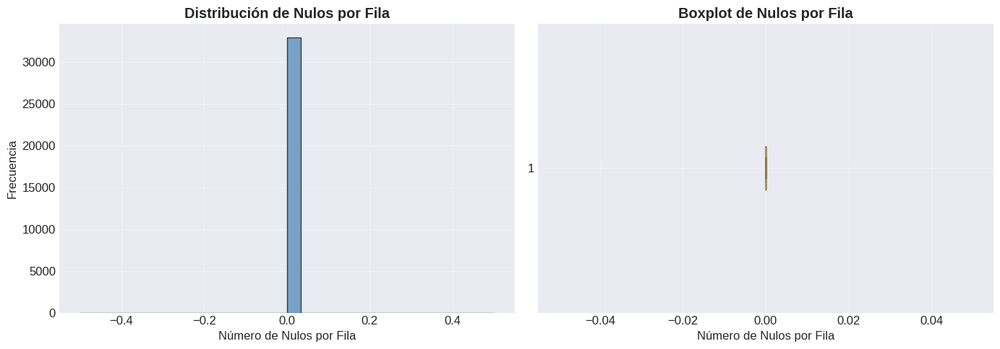

   • Media de nulos por fila: 0.00
   • Mediana de nulos por fila: 0.00
   • Máximo nulos en una fila: 0

🔍 PASO 3: ANÁLISIS DE VARIABLES NUMÉRICAS
🔢 Se encontraron 17 variables numéricas:
   sport, dsport, dur, sbytes, dbytes, Sload, Dload, Spkts, Dpkts, smeansz...

📊 ESTADÍSTICAS DESCRIPTIVAS DETALLADAS:


TypeError: Must provide 'func' or tuples of '(column, aggfunc).

In [60]:
# ============================================
# EJECUTAR TODOS LOS PASOS DEL EDA EN ORDEN
# ============================================

def ejecutar_pipeline_eda_completo(df):
    """
    Función para ejecutar todo el pipeline EDA en secuencia
    """
    print("🚀 INICIANDO PIPELINE COMPLETO DE EDA")
    print("="*70)

    resultados = {}

    # Paso 1: Carga y vista general
    resultados['paso1'] = paso1_carga_y_vista(df)

    # Paso 2: Análisis de valores nulos
    resultados['paso2'] = paso2_analisis_nulos(df)

    # Paso 3: Análisis de variables numéricas
    resultados['paso3'] = paso3_analisis_numericas(df)

    # Paso 4: Análisis de variables categóricas
    resultados['paso4'] = paso4_analisis_categoricas(df)

    # Paso 5: Análisis de correlaciones
    resultados['paso5'] = paso5_analisis_correlaciones(df)

    # Paso 6: Análisis de relaciones y patrones
    paso6_analisis_relaciones(df)

    # Paso 7: Reporte final
    resultados['paso7'] = paso7_reporte_final(df)

    print("\n🎯 PIPELINE EDA COMPLETADO EXITOSAMENTE")
    print("📊 Tienes ahora un entendimiento profundo de tu dataset")

    return resultados

# Ejecutar pipeline completo
if 'df_limpio' in locals():
    resultados_eda = ejecutar_pipeline_eda_completo(df_limpio)
else:
    print("⚠️ Primero carga tu dataset limpio como 'df_limpio'")

In [55]:
# ============================================
# VISUALIZACIÓN INTERACTIVA (OPCIONAL)
# ============================================

import plotly.express as px # Importar plotly.express para usar 'px'

def visualizacion_interactiva(df):
    """
    Visualizaciones interactivas con Plotly
    """
    print("\n🎨 VISUALIZACIONES INTERACTIVAS (PLOTLY)")
    print("="*60)

    numericas = df.select_dtypes(include=[np.number]).columns

    if len(numericas) >= 2:
        # Scatter plot interactivo
        print("📈 SCATTER PLOT INTERACTIVO:")

        # Tomar primeras 2 variables numéricas
        x_col, y_col = numericas[0], numericas[1]

        fig = px.scatter(df, x=x_col, y=y_col,
                        title=f'Relación entre {x_col} y {y_col}',
                        opacity=0.6,
                        hover_data=df.columns.tolist())

        fig.show()

    if len(numericas) >= 1:
        # Histograma interactivo
        print("\n📊 HISTOGRAMA INTERACTIVO:")

        hist_col = numericas[0]
        fig = px.histogram(df, x=hist_col, nbins=50,
                          title=f'Distribución de {hist_col}',
                          marginal='box')

        fig.show()

    # Heatmap interactivo de correlaciones
    if len(numericas) >= 3:
        print("\n🔗 HEATMAP INTERACTIVO DE CORRELACIONES:")

        corr_matrix = df[numericas].corr()

        fig = px.imshow(corr_matrix,
                       labels=dict(x="Variables", y="Variables", color="Correlación"),
                       x=corr_matrix.columns,
                       y=corr_matrix.columns,
                       title='Matriz de Correlación Interactiva',
                       color_continuous_scale='RdBu',
                       zmin=-1, zmax=1)

        fig.show()

# Ejecutar visualización interactiva (opcional)
if 'df_limpio' in locals():
    visualizacion_interactiva(df_limpio)


🎨 VISUALIZACIONES INTERACTIVAS (PLOTLY)
📈 SCATTER PLOT INTERACTIVO:



📊 HISTOGRAMA INTERACTIVO:



🔗 HEATMAP INTERACTIVO DE CORRELACIONES:


🚀 INICIANDO PIPELINE COMPLETO DE EDA
🔍 PASO 1: CARGA Y VISTA GENERAL DEL DATASET
📊 INFORMACIÓN BÁSICA:
   • Filas: 32,864
   • Columnas: 28
   • Celdas totales: 920,192
   • Memoria usada: 19.65 MB

📋 VISTA PREVIA (primeras 5 filas):


,srcip,sport,dstip,dsport,proto,state,dur,sbytes,dbytes,service,...,Stime,Ltime,synack,is_sm_ips_ports,ct_state_ttl,Label,service_was_null,trans_depth_was_null,res_bdy_len_was_null,null_count_per_row
15,fe80:0000:0000:0000:0a00:27ff:fec2:1853,54389.0,ff02:0000:0000:0000:0000:0000:0000:0002,53.0,IPv6-ICMP,new,0.000000,70.0,0.0,MISSING_CAT,...,2025-08-20 16:27:02.544289+00:00,2025-08-20 16:27:02.544289+00:00,True,0,syn_sent,0,1,1,1,7
16,192.168.56.1,62736.0,192.168.56.102,80.0,TCP,closed,19.122956,5425.0,5256.0,http,...,2025-08-20 16:27:06.931891+00:00,2025-08-20 16:27:26.054847+00:00,True,0,closed,0,0,1,1,2
17,192.168.56.1,62735.0,192.168.56.102,80.0,TCP,closed,19.697839,3505.0,15206.0,http,...,2025-08-20 16:27:06.357032+00:00,2025-08-20 16:27:26.054871+00:00,True,0,closed,0,0,1,1,2
18,fe80:0000:0000:0000:0a00:27ff:fec2:1853,54389.0,ff02:0000:0000:0000:0000:0000:0000:0002,53.0,IPv6-ICMP,new,0.000000,70.0,0.0,MISSING_CAT,...,2025-08-20 16:29:08.587360+00:00,2025-08-20 16:29:08.587360+00:00,True,0,syn_sent,0,1,1,1,7
21,192.168.56.102,138.0,192.168.56.255,138.0,UDP,new,0.000044,543.0,0.0,failed,...,2025-08-20 16:30:51.312219+00:00,2025-08-20 16:30:51.312263+00:00,True,0,syn_sent,0,0,1,1,4



📋 VISTA FINAL (últimas 5 filas):


,srcip,sport,dstip,dsport,proto,state,dur,sbytes,dbytes,service,...,Stime,Ltime,synack,is_sm_ips_ports,ct_state_ttl,Label,service_was_null,trans_depth_was_null,res_bdy_len_was_null,null_count_per_row
55819,192.168.56.1,64129.0,224.0.0.252,5355.0,UDP,new,0.410633,136.0,0.0,failed,...,2025-08-04 15:54:22.138583+00:00,2025-08-04 15:54:22.549216+00:00,True,0,syn_sent,1,0,1,1,4
55820,fe80:0000:0000:0000:1e41:9132:c5af:6169,5353.0,ff02:0000:0000:0000:0000:0000:0000:00fb,5353.0,UDP,new,1.003685,752.0,0.0,failed,...,2025-08-04 15:54:22.134151+00:00,2025-08-04 15:54:23.137836+00:00,True,0,syn_sent,1,0,1,1,4
55821,fe80:0000:0000:0000:1e41:9132:c5af:6169,64129.0,ff02:0000:0000:0000:0000:0000:0001:0003,5355.0,UDP,new,0.410626,176.0,0.0,failed,...,2025-08-04 15:54:22.138563+00:00,2025-08-04 15:54:22.549189+00:00,True,0,syn_sent,1,0,1,1,4
55823,10.0.3.15,55136.0,185.125.190.17,443.0,TCP,closed,0.613596,1570.0,11524.0,tls,...,2025-08-04 15:54:07.543156+00:00,2025-08-04 15:54:08.156752+00:00,True,0,closed,1,0,1,1,2
55824,10.0.3.15,44770.0,185.125.190.56,123.0,UDP,established,0.193104,90.0,90.0,ntp,...,2025-08-04 15:52:07.018070+00:00,2025-08-04 15:52:07.211174+00:00,True,0,syn_sent,1,0,1,1,4



🏷️  TIPOS DE DATOS POR COLUMNA:


,Columna,Tipo_Dato,Valores_No_Nulos,Valores_Nulos,Porcentaje_Nulos
20,synack,bool,32864,0,0.0
18,Stime,"datetime64[ns, UTC]",32864,0,0.0
19,Ltime,"datetime64[ns, UTC]",32864,0,0.0
15,dmeansz,float64,32864,0,0.0
14,smeansz,float64,32864,0,0.0
12,Spkts,float64,32864,0,0.0
11,Dload,float64,32864,0,0.0
10,Sload,float64,32864,0,0.0
13,Dpkts,float64,32864,0,0.0
6,dur,float64,32864,0,0.0



📈 RESUMEN ESTADÍSTICO RÁPIDO:


,srcip,sport,dstip,dsport,proto,state,dur,sbytes,dbytes,service,...,Stime,Ltime,synack,is_sm_ips_ports,ct_state_ttl,Label,service_was_null,trans_depth_was_null,res_bdy_len_was_null,null_count_per_row
count,32864,32864.00,32864,32864.00,32864,32864,32864.00,32864.00,3.286400e+04,32864,...,32864,32864,32864,32864.0,32864,32864.00,32864.00,32864.00,32864.00,32864.00
unique,19,NaN,42,NaN,4,3,NaN,NaN,NaN,13,...,NaN,NaN,1,NaN,5,NaN,NaN,NaN,NaN,NaN
top,192.168.56.1,NaN,192.168.56.102,NaN,TCP,new,NaN,NaN,NaN,MISSING_CAT,...,NaN,NaN,True,NaN,syn_sent,NaN,NaN,NaN,NaN,NaN
freq,28953,NaN,30541,NaN,30617,18392,NaN,NaN,NaN,24779,...,NaN,NaN,32864,NaN,18546,NaN,NaN,NaN,NaN,NaN
mean,NaN,53882.10,NaN,2433.82,NaN,NaN,13.44,1160.59,2.627656e+04,NaN,...,2025-08-03 14:44:39.396712192+00:00,2025-08-03 14:31:40.032682240+00:00,NaN,0.0,NaN,0.82,0.75,1.00,1.00,2.95
min,NaN,21.00,NaN,1.00,NaN,NaN,0.00,60.00,0.000000e+00,NaN,...,2025-07-30 11:44:23.680332+00:00,2025-07-30 11:44:24.098834+00:00,NaN,0.0,NaN,0.00,0.00,0.00,0.00,2.00
25%,NaN,51873.00,NaN,53.00,NaN,NaN,2.01,330.00,0.000000e+00,NaN,...,2025-07-30 23:15:03.167807488+00:00,2025-07-30 23:15:18.167219968+00:00,NaN,0.0,NaN,1.00,1.00,1.00,1.00,3.00
50%,NaN,54389.00,NaN,53.00,NaN,NaN,15.00,330.00,0.000000e+00,NaN,...,2025-07-30 23:15:05.339897600+00:00,2025-07-30 23:15:20.337521920+00:00,NaN,0.0,NaN,1.00,1.00,1.00,1.00,3.00
75%,NaN,58163.25,NaN,1025.00,NaN,NaN,15.00,330.00,3.000000e+02,NaN,...,2025-07-31 00:39:40.275854592+00:00,2025-07-31 00:28:57.508824064+00:00,NaN,0.0,NaN,1.00,1.00,1.00,1.00,3.00
max,NaN,65535.00,NaN,65389.00,NaN,NaN,25815.18,7603321.00,2.118969e+08,NaN,...,2025-08-20 19:22:21.953193+00:00,2025-08-20 19:22:37.229722+00:00,NaN,0.0,NaN,1.00,1.00,1.00,1.00,12.00



🔍 PASO 2: ANÁLISIS DE VALORES NULOS
📊 ESTADÍSTICAS GENERALES:
   • Valores nulos totales: 0
   • Porcentaje de nulos: 0.00%
   • Columnas con nulos: 0 de 28
   • Filas con nulos: 0 de 32,864

🎨 MATRIZ DE VALORES NULOS:


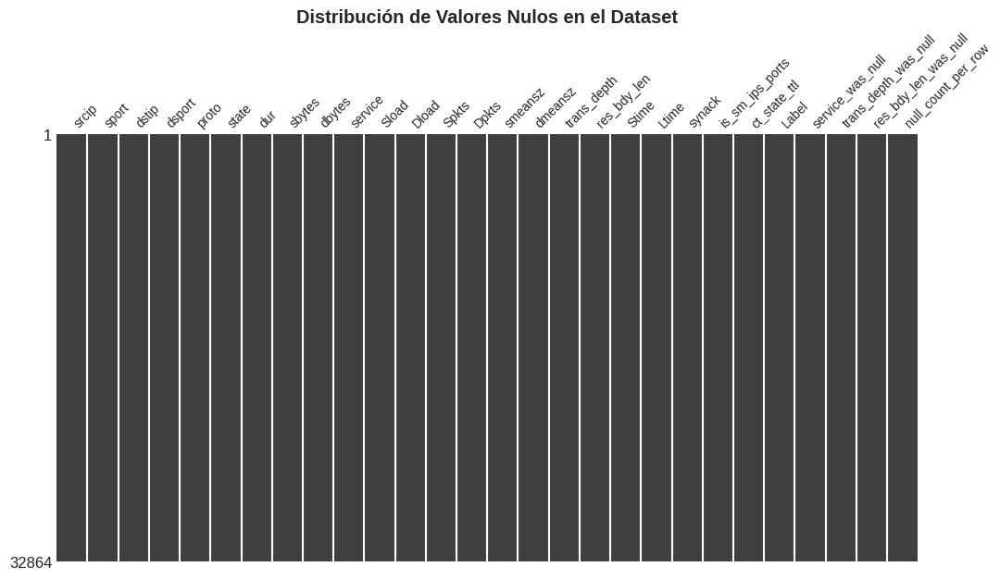


📉 TOP 10 COLUMNAS CON MÁS VALORES NULOS:


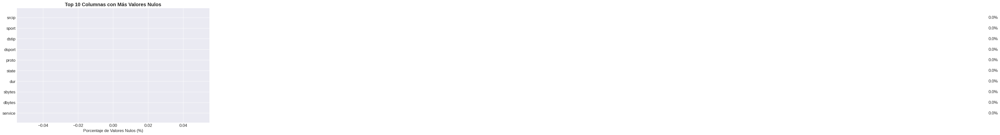


🔗 CORRELACIÓN ENTRE VALORES NULOS:


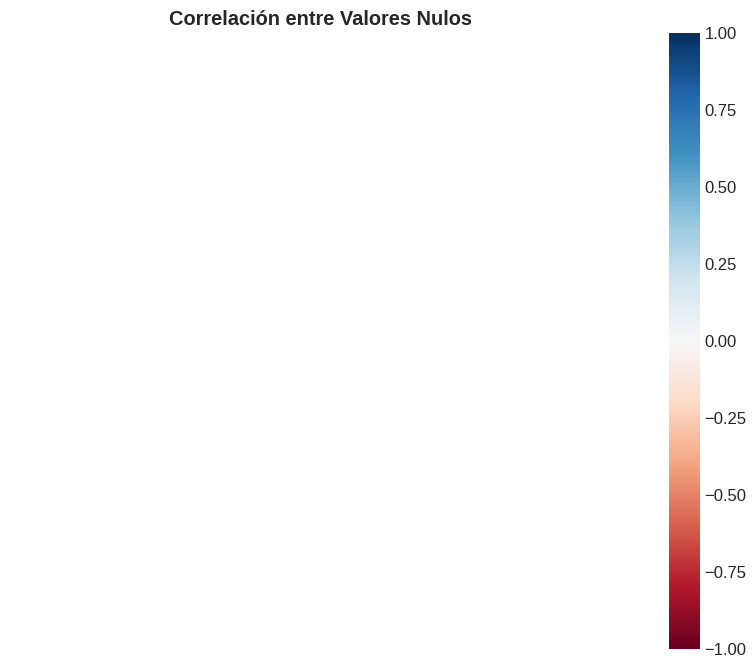


📊 DISTRIBUCIÓN DE NULOS POR FILA:


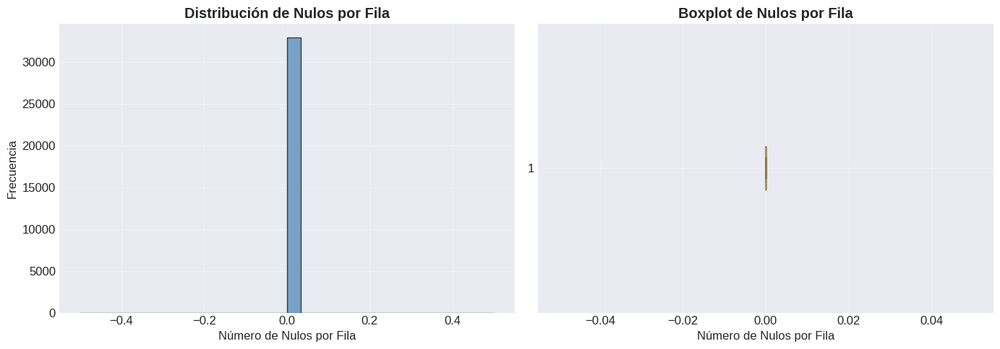

   • Media de nulos por fila: 0.00
   • Mediana de nulos por fila: 0.00
   • Máximo nulos en una fila: 0

🔍 PASO 3: ANÁLISIS DE VARIABLES NUMÉRICAS
🔢 Se encontraron 17 variables numéricas:
   sport, dsport, dur, sbytes, dbytes, Sload, Dload, Spkts, Dpkts, smeansz...

📊 ESTADÍSTICAS DESCRIPTIVAS DETALLADAS:


AttributeError: '25%' is not a valid function for 'Series' object

In [57]:
# ============================================
# PASO 4: ANÁLISIS DE VARIABLES CATEGÓRICAS
# ============================================

def paso4_analisis_categoricas(df):
    """
    PASO 4: Análisis profundo de variables categóricas
    """
    print("\n🔍 PASO 4: ANÁLISIS DE VARIABLES CATEGÓRICAS")
    print("="*60)

    # Identificar variables categóricas
    categoricas = df.select_dtypes(include=['object', 'category']).columns

    if len(categoricas) == 0:
        print("⚠️ No hay variables categóricas en el dataset")
        return None

    print(f"🔠 Se encontraron {len(categoricas)} variables categóricas:")
    print(f"   {', '.join(categoricas[:10])}{'...' if len(categoricas) > 10 else ''}")

    # 4.1. Conteo de valores y cardinalidad
    print("\n📊 CONTEO DE VALORES Y CARDINALIDAD:")
    cardinalidad_info = []

    for col in categoricas:
        unique_values = df[col].nunique()
        total_values = len(df[col])
        mode_val = df[col].mode()[0] if not df[col].empty else 'N/A'
        mode_freq = df[col].value_counts().max() if not df[col].empty else 0
        mode_perc = (mode_freq / total_values * 100) if total_values > 0 else 0

        cardinalidad_info.append({
            'Variable': col,
            'Tipo_Dato': str(df[col].dtype),
            'Cardinalidad': unique_values,
            'Porcentaje_Unicos': (unique_values / total_values * 100) if total_values > 0 else 0,
            'Moda': mode_val,
            'Frecuencia_Moda': mode_freq,
            'Porcentaje_Moda': mode_perc
        })

        # Print summary for high cardinality for immediate feedback
        if (unique_values / total_values * 100) > 50:
            print(f"   • {col}: Cardinalidad alta ({unique_values} únicos, {unique_values / total_values * 100:.2f}%)")

    cardinalidad_df = pd.DataFrame(cardinalidad_info)
    cardinalidad_df = cardinalidad_df.sort_values('Porcentaje_Unicos', ascending=False)

    display(cardinalidad_df)

    # 4.2. Gráficos de barras para las top categorías
    print("\n📈 GRÁFICOS DE FRECUENCIA DE CATEGORÍAS (Top 5):")

    # Limitar a 6 variables para visualización
    vars_a_visualizar = categoricas[:6] if len(categoricas) > 6 else categoricas

    n_cols = 2
    n_rows = int(np.ceil(len(vars_a_visualizar) / n_cols))

    fig, axes = plt.subplots(n_rows, n_cols, figsize=(14, n_rows * 5))
    axes = axes.flatten() if n_rows > 1 else [axes]

    for idx, col in enumerate(vars_a_visualizar):
        if idx < len(axes):
            ax = axes[idx]
            top_n = df[col].value_counts().head(5)
            top_n.plot(kind='bar', ax=ax, color=sns.color_palette("viridis", len(top_n)))
            ax.set_title(f'Top 5 de {col}', fontweight='bold', fontsize=12)
            ax.set_xlabel(col)
            ax.set_ylabel('Frecuencia')
            ax.tick_params(axis='x', rotation=45, ha='right')
            ax.grid(axis='y', alpha=0.3)

            # Add percentages on top of bars
            total_count = top_n.sum()
            for p in ax.patches:
                percentage = '{:.1f}%'.format(100 * p.get_height()/total_count)
                x = p.get_x() + p.get_width() / 2
                y = p.get_height()
                ax.annotate(percentage, (x, y), ha='center', va='bottom', fontsize=9)

    # Ocultar ejes vacíos
    for idx in range(len(vars_a_visualizar), len(axes)):
        axes[idx].set_visible(False)

    plt.tight_layout()
    plt.show()

    # 4.3. Heatmap para variables categóricas (si hay pocas categorías)
    if len(categoricas) >= 2:
        print("\n🔥 HEATMAP DE FRECUENCIA PARA CATEGÓRICAS (si aplica):")
        # Seleccionar hasta 3 categóricas con baja cardinalidad para un cross-tabulation
        low_card_cats = cardinalidad_df[cardinalidad_df['Cardinalidad'] <= 10]['Variable'].head(3).tolist()

        if len(low_card_cats) >= 2:
            for i in range(len(low_card_cats)):
                for j in range(i + 1, len(low_card_cats)):
                    col1 = low_card_cats[i]
                    col2 = low_card_cats[j]
                    print(f"   • {col1} vs {col2}")
                    crosstab = pd.crosstab(df[col1], df[col2])

                    plt.figure(figsize=(10, 7))
                    sns.heatmap(crosstab, annot=True, fmt='d', cmap='YlGnBu', linewidths=.5)
                    plt.title(f'Frecuencia Conjunta de {col1} y {col2}', fontweight='bold')
                    plt.tight_layout()
                    plt.show()
        else:
            print("   ⚠️ No hay suficientes variables categóricas de baja cardinalidad para heatmap de frecuencia.")

    return cardinalidad_df

# Re-ejecutar el pipeline completo después de definir paso4
if 'df_limpio' in locals():
    resultados_eda = ejecutar_pipeline_eda_completo(df_limpio)
else:
    print("⚠️ Primero carga tu dataset limpio como 'df_limpio'")

🚀 EJECUTANDO SECUENCIA 1: Visualizaciones básicas
📊 SECUENCIA 1: VISUALIZACIONES BÁSICAS DE DISTRIBUCIÓN

1. 📈 HISTOGRAMAS DE VARIABLES NUMÉRICAS
----------------------------------------


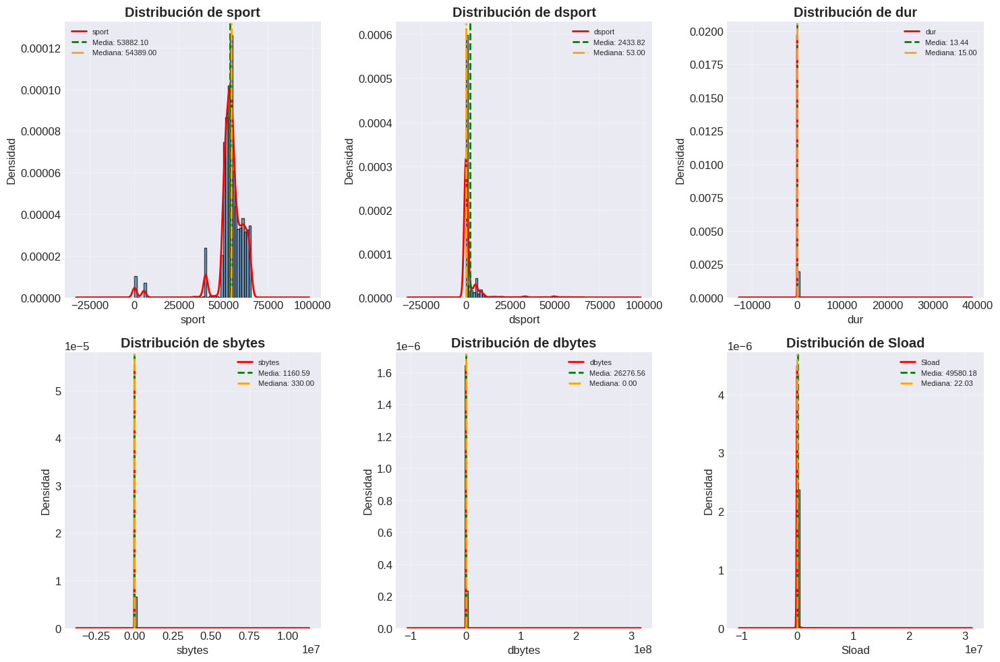


2. 📦 BOXPLOTS PARA DETECCIÓN DE OUTLIERS
----------------------------------------


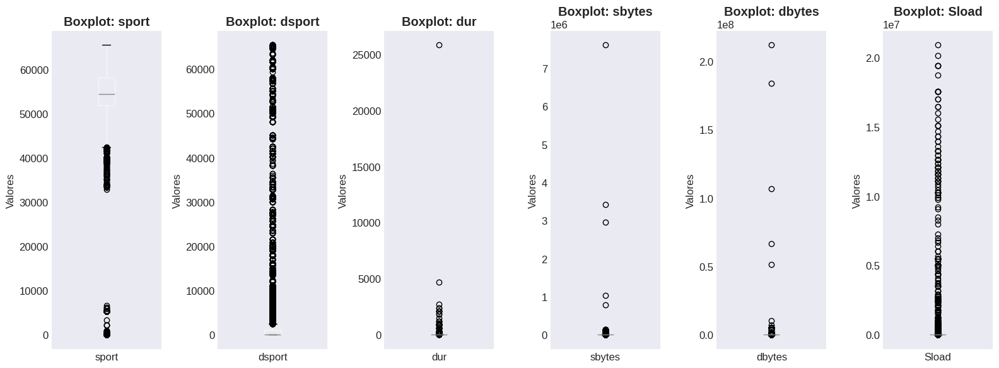


3. 📊 GRÁFICOS DE BARRAS PARA VARIABLES CATEGÓRICAS
----------------------------------------


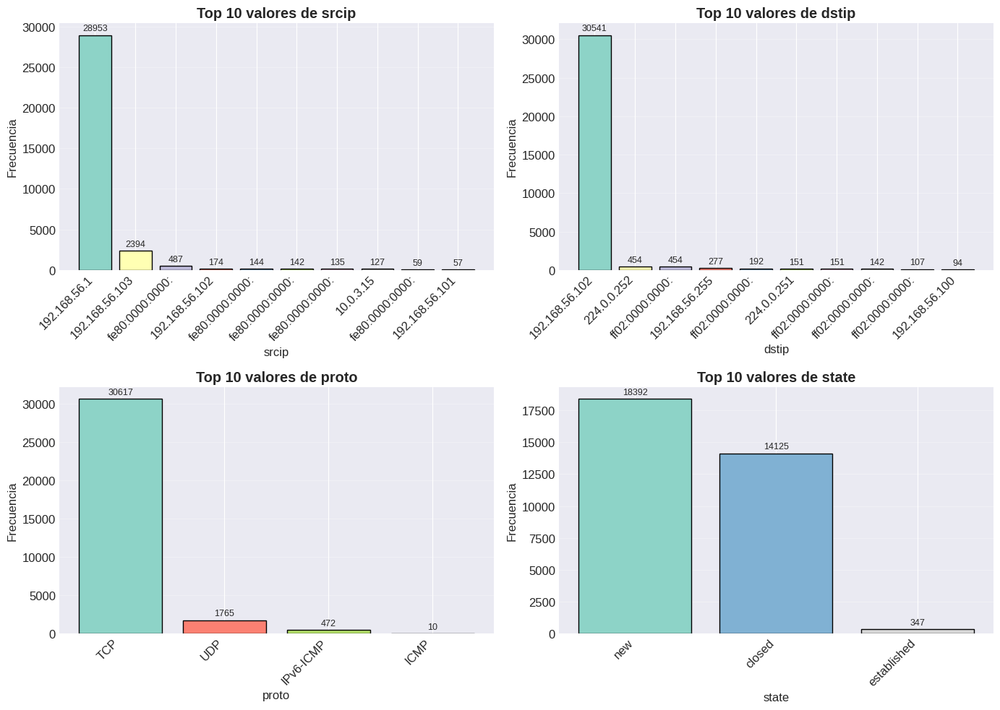

✅ SECUENCIA 1 COMPLETADA: Distribuciones básicas entendidas


In [61]:
# ============================================
# SECUENCIA 1: VISUALIZACIONES BÁSICAS
# Análisis de distribuciones individuales
# ============================================

def secuencia1_visualizaciones_basicas(df):
    """
    SECUENCIA 1: Visualizaciones básicas de distribuciones
    Paso inicial para entender cada variable individualmente
    """
    print("📊 SECUENCIA 1: VISUALIZACIONES BÁSICAS DE DISTRIBUCIÓN")
    print("="*60)

    # 1.1. Configuración inicial
    import matplotlib.pyplot as plt
    import seaborn as sns
    import numpy as np

    plt.style.use('seaborn-v0_8-darkgrid')
    sns.set_palette("husl")

    # 1.2. Histogramas para variables numéricas
    print("\n1. 📈 HISTOGRAMAS DE VARIABLES NUMÉRICAS")
    print("-" * 40)

    numericas = df.select_dtypes(include=[np.number]).columns

    if len(numericas) == 0:
        print("⚠️ No hay variables numéricas")
        return

    # Limitar a 6 variables para no saturar
    vars_vis = numericas[:6] if len(numericas) > 6 else numericas

    fig, axes = plt.subplots(2, 3, figsize=(15, 10))
    axes = axes.flatten()

    for idx, col in enumerate(vars_vis):
        if idx < len(axes):
            ax = axes[idx]

            # Histograma con KDE
            df[col].hist(ax=ax, bins=50, alpha=0.7, color='steelblue',
                        edgecolor='black', density=True)
            df[col].plot(kind='kde', ax=ax, color='red', linewidth=2)

            # Estadísticas
            mean_val = df[col].mean()
            median_val = df[col].median()

            ax.axvline(mean_val, color='green', linestyle='--',
                      linewidth=2, label=f'Media: {mean_val:.2f}')
            ax.axvline(median_val, color='orange', linestyle='-.',
                      linewidth=2, label=f'Mediana: {median_val:.2f}')

            ax.set_title(f'Distribución de {col}', fontweight='bold')
            ax.set_xlabel(col)
            ax.set_ylabel('Densidad')
            ax.legend(fontsize=8)
            ax.grid(True, alpha=0.3)

    # Ocultar ejes vacíos
    for idx in range(len(vars_vis), len(axes)):
        axes[idx].set_visible(False)

    plt.tight_layout()
    plt.show()

    # 1.3. Boxplots para detectar outliers
    print("\n2. 📦 BOXPLOTS PARA DETECCIÓN DE OUTLIERS")
    print("-" * 40)

    fig, axes = plt.subplots(1, min(6, len(vars_vis)), figsize=(16, 6))
    if len(vars_vis) == 1:
        axes = [axes]

    for idx, col in enumerate(vars_vis[:len(axes)]):
        ax = axes[idx] if len(axes) > 1 else axes
        df.boxplot(column=col, ax=ax, grid=False)
        ax.set_title(f'Boxplot: {col}', fontweight='bold')
        ax.set_ylabel('Valores')

    plt.tight_layout()
    plt.show()

    # 1.4. Gráficos de barras para variables categóricas
    print("\n3. 📊 GRÁFICOS DE BARRAS PARA VARIABLES CATEGÓRICAS")
    print("-" * 40)

    categoricas = df.select_dtypes(include=['object', 'category']).columns

    if len(categoricas) > 0:
        # Limitar a 4 variables categóricas
        cats_vis = categoricas[:4] if len(categoricas) > 4 else categoricas

        fig, axes = plt.subplots(2, 2, figsize=(14, 10))
        axes = axes.flatten()

        for idx, col in enumerate(cats_vis):
            if idx < len(axes):
                ax = axes[idx]

                # Top 10 categorías más frecuentes
                top_cats = df[col].value_counts().head(10)

                colors = plt.cm.Set3(np.arange(len(top_cats)) / len(top_cats))
                bars = ax.bar(range(len(top_cats)), top_cats.values,
                            color=colors, edgecolor='black')

                ax.set_title(f'Top 10 valores de {col}', fontweight='bold')
                ax.set_xlabel(col)
                ax.set_ylabel('Frecuencia')
                ax.set_xticks(range(len(top_cats)))
                ax.set_xticklabels([str(x)[:15] for x in top_cats.index],
                                  rotation=45, ha='right')
                ax.grid(True, alpha=0.3, axis='y')

                # Añadir valores en las barras
                for i, v in enumerate(top_cats.values):
                    ax.text(i, v + 0.01 * max(top_cats.values),
                           str(v), ha='center', va='bottom', fontsize=9)

        # Ocultar ejes vacíos
        for idx in range(len(cats_vis), len(axes)):
            axes[idx].set_visible(False)

        plt.tight_layout()
        plt.show()

    print("✅ SECUENCIA 1 COMPLETADA: Distribuciones básicas entendidas")
    return vars_vis, cats_vis if 'cats_vis' in locals() else []

# EJECUTAR SECUENCIA 1
print("🚀 EJECUTANDO SECUENCIA 1: Visualizaciones básicas")
if 'df_limpio' in locals():
    vars_numericas, vars_categoricas = secuencia1_visualizaciones_basicas(df_limpio)
else:
    print("⚠️ Primero carga tu dataset como 'df_limpio'")


🚀 EJECUTANDO SECUENCIA 2: Análisis de correlaciones

🔗 SECUENCIA 2: ANÁLISIS DE CORRELACIONES Y RELACIONES

1. 📊 MATRIZ DE CORRELACIÓN
----------------------------------------


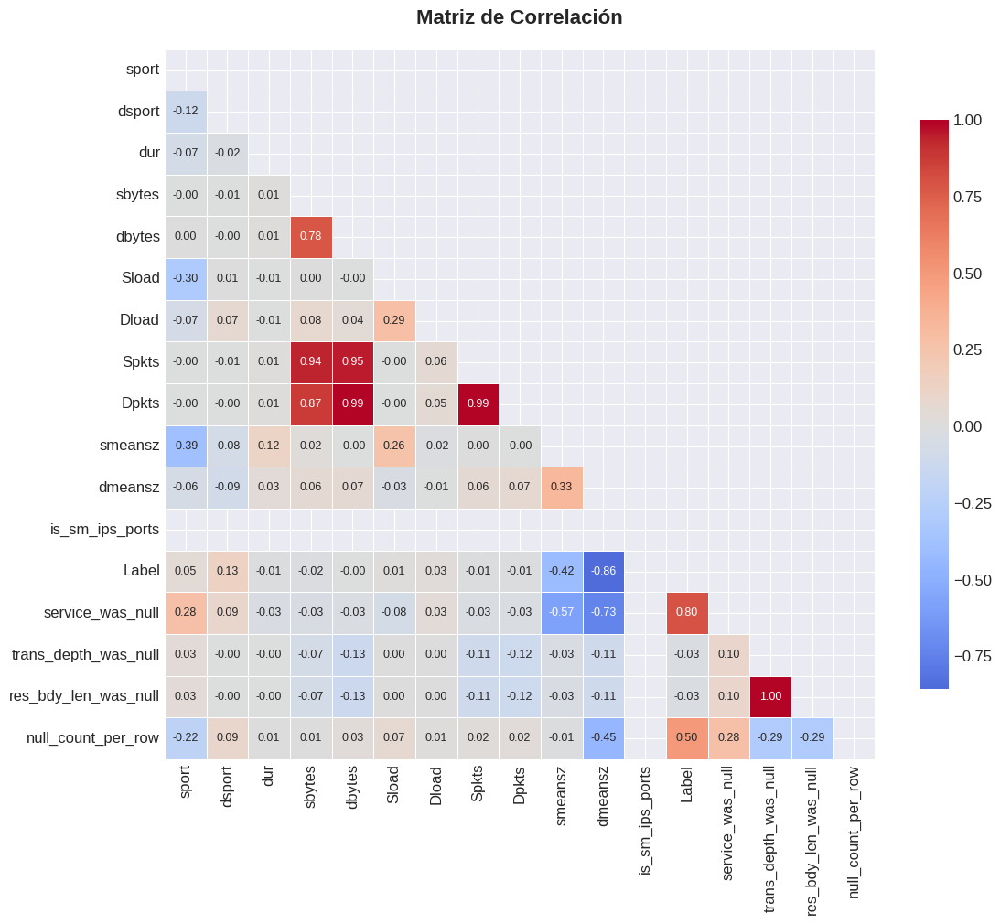


2. 💪 CORRELACIONES FUERTES (|r| > 0.7)
----------------------------------------
Correlaciones muy fuertes encontradas:
   • sbytes ↔ dbytes: 0.784 (POSITIVA)
   • sbytes ↔ Spkts: 0.937 (POSITIVA)
   • sbytes ↔ Dpkts: 0.874 (POSITIVA)
   • dbytes ↔ Spkts: 0.951 (POSITIVA)
   • dbytes ↔ Dpkts: 0.987 (POSITIVA)

3. 📈 SCATTER PLOTS PARA RELACIONES FUERTES
----------------------------------------


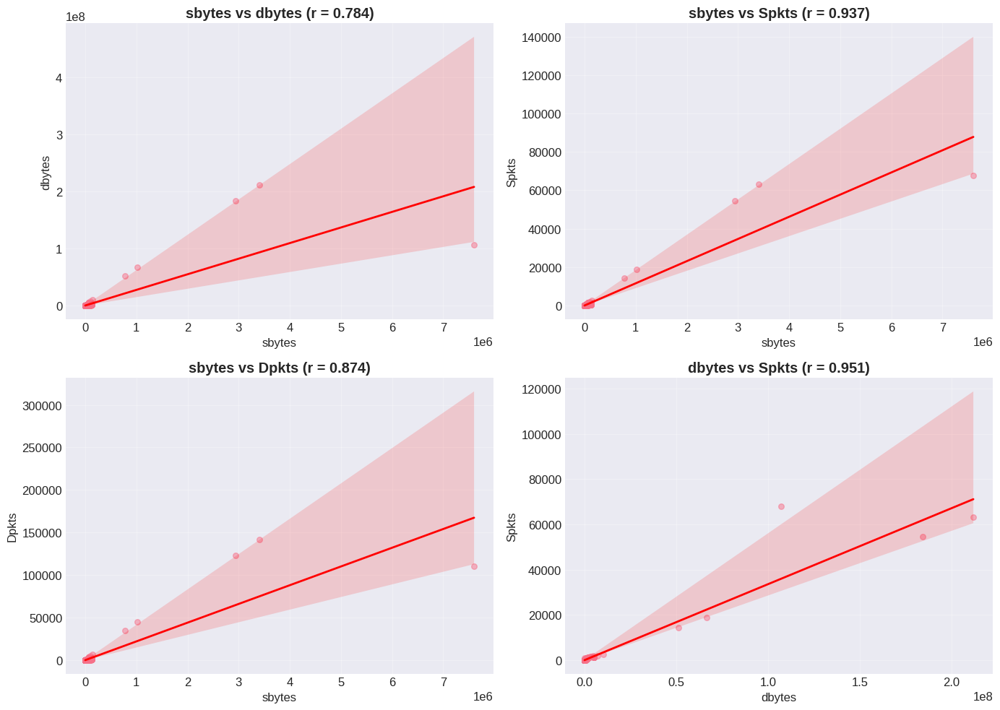


4. 🔄 MATRIZ DE SCATTER PLOTS (PAIRPLOT)
----------------------------------------
Variables incluidas: sport, dsport, dur, sbytes, dbytes


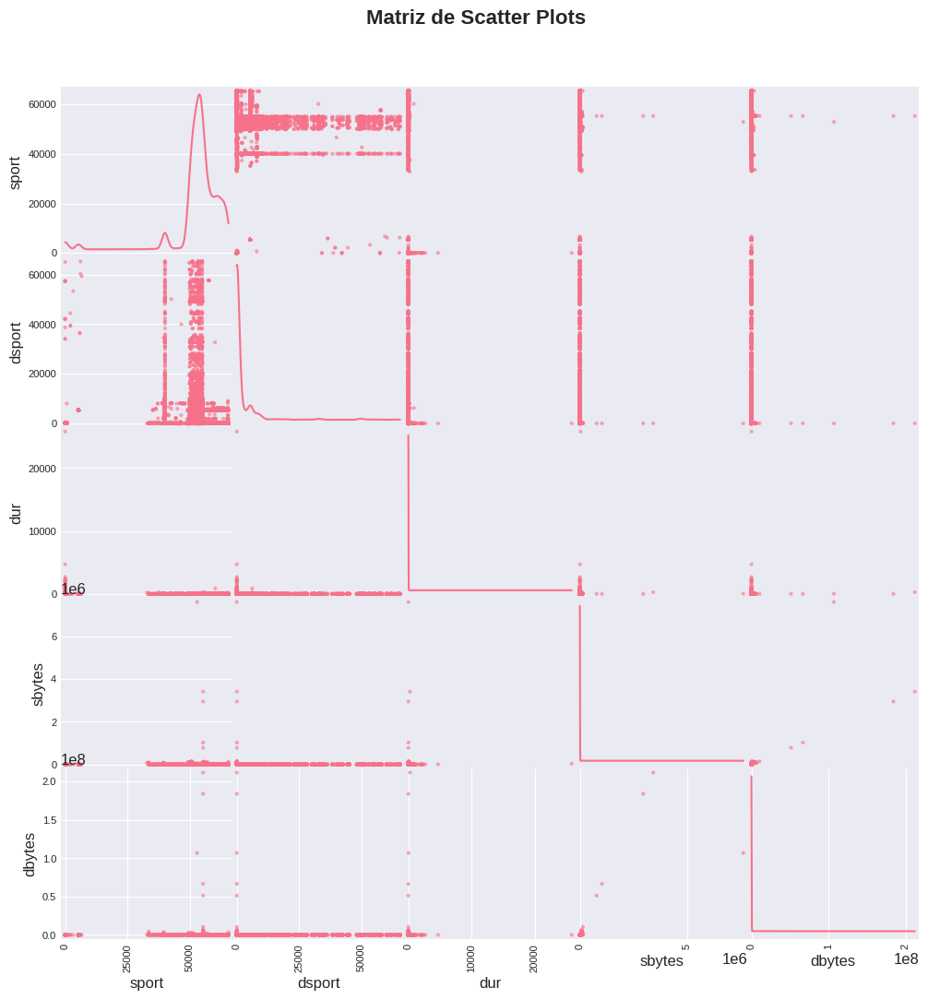

✅ SECUENCIA 2 COMPLETADA: Relaciones entre variables analizadas


In [62]:
# ============================================
# SECUENCIA 2: ANÁLISIS DE CORRELACIONES
# Relaciones entre variables
# ============================================

def secuencia2_analisis_correlaciones(df):
    """
    SECUENCIA 2: Análisis de correlaciones y relaciones
    """
    print("\n" + "="*60)
    print("🔗 SECUENCIA 2: ANÁLISIS DE CORRELACIONES Y RELACIONES")
    print("="*60)

    # 2.1. Matriz de correlación
    print("\n1. 📊 MATRIZ DE CORRELACIÓN")
    print("-" * 40)

    numericas = df.select_dtypes(include=[np.number]).columns

    if len(numericas) < 2:
        print("⚠️ Se necesitan al menos 2 variables numéricas")
        return None

    # Calcular matriz de correlación
    corr_matrix = df[numericas].corr()

    # Heatmap de correlación
    import seaborn as sns

    plt.figure(figsize=(12, 10))
    mask = np.triu(np.ones_like(corr_matrix, dtype=bool))

    sns.heatmap(corr_matrix, mask=mask, cmap='coolwarm', center=0,
               square=True, linewidths=.5, cbar_kws={"shrink": .8},
               annot=True, fmt='.2f', annot_kws={"size": 9})

    plt.title('Matriz de Correlación', fontsize=16, fontweight='bold', pad=20)
    plt.tight_layout()
    plt.show()

    # 2.2. Identificar correlaciones fuertes
    print("\n2. 💪 CORRELACIONES FUERTES (|r| > 0.7)")
    print("-" * 40)

    strong_corrs = []
    for i in range(len(corr_matrix.columns)):
        for j in range(i+1, len(corr_matrix.columns)):
            corr_val = corr_matrix.iloc[i, j]
            if abs(corr_val) > 0.7:
                col1, col2 = corr_matrix.columns[i], corr_matrix.columns[j]
                strong_corrs.append((col1, col2, corr_val))

    if strong_corrs:
        print("Correlaciones muy fuertes encontradas:")
        for col1, col2, corr_val in strong_corrs[:5]:  # Mostrar solo 5
            tipo = "POSITIVA" if corr_val > 0 else "NEGATIVA"
            print(f"   • {col1} ↔ {col2}: {corr_val:.3f} ({tipo})")
    else:
        print("✅ No hay correlaciones muy fuertes")

    # 2.3. Scatter plots para correlaciones fuertes
    print("\n3. 📈 SCATTER PLOTS PARA RELACIONES FUERTES")
    print("-" * 40)

    if strong_corrs:
        # Tomar hasta 4 pares para visualizar
        pares_vis = strong_corrs[:4]

        n_plots = len(pares_vis)
        n_cols = 2
        n_rows = int(np.ceil(n_plots / n_cols))

        fig, axes = plt.subplots(n_rows, n_cols, figsize=(14, n_rows * 5))
        axes = axes.flatten() if n_rows > 1 else [axes]

        for idx, (col1, col2, corr_val) in enumerate(pares_vis):
            if idx < len(axes):
                ax = axes[idx]

                # Scatter plot con regresión lineal
                sns.regplot(x=col1, y=col2, data=df, ax=ax,
                           scatter_kws={'alpha': 0.5, 's': 30},
                           line_kws={'color': 'red', 'linewidth': 2})

                ax.set_title(f'{col1} vs {col2} (r = {corr_val:.3f})', fontweight='bold')
                ax.set_xlabel(col1)
                ax.set_ylabel(col2)
                ax.grid(True, alpha=0.3)

        # Ocultar ejes vacíos
        for idx in range(len(pares_vis), len(axes)):
            axes[idx].set_visible(False)

        plt.tight_layout()
        plt.show()

    # 2.4. Pairplot para variables clave
    print("\n4. 🔄 MATRIZ DE SCATTER PLOTS (PAIRPLOT)")
    print("-" * 40)

    if len(numericas) >= 3:
        # Seleccionar 4-5 variables numéricas para pairplot
        vars_pairplot = numericas[:5] if len(numericas) > 5 else numericas

        print(f"Variables incluidas: {', '.join(vars_pairplot)}")

        # Pairplot simplificado
        from pandas.plotting import scatter_matrix

        scatter_matrix(df[vars_pairplot], figsize=(12, 12),
                      diagonal='kde', alpha=0.6)
        plt.suptitle('Matriz de Scatter Plots', fontsize=16, fontweight='bold', y=0.95)
        plt.show()

    print("✅ SECUENCIA 2 COMPLETADA: Relaciones entre variables analizadas")
    return corr_matrix, strong_corrs

# EJECUTAR SECUENCIA 2
print("\n🚀 EJECUTANDO SECUENCIA 2: Análisis de correlaciones")
if 'df_limpio' in locals():
    corr_matrix, strong_corrs = secuencia2_analisis_correlaciones(df_limpio)


🚀 EJECUTANDO SECUENCIA 3: Categóricas vs Numéricas

🔀 SECUENCIA 3: CATEGÓRICAS VS NUMÉRICAS
📊 Variables numéricas: 17
📋 Variables categóricas: 8

1. 📦 BOXPLOTS POR CATEGORÍA
----------------------------------------
Analizando: srcip (categórica) vs sport (numérica)


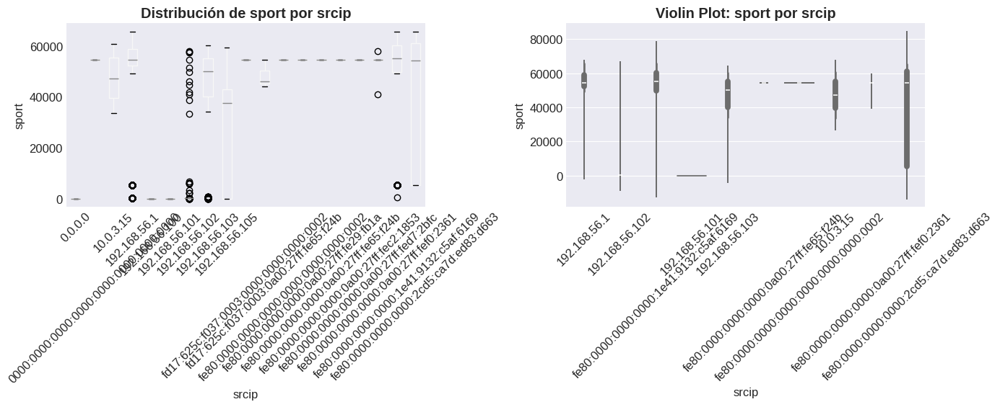


2. 📊 PROMEDIOS POR CATEGORÍA
----------------------------------------


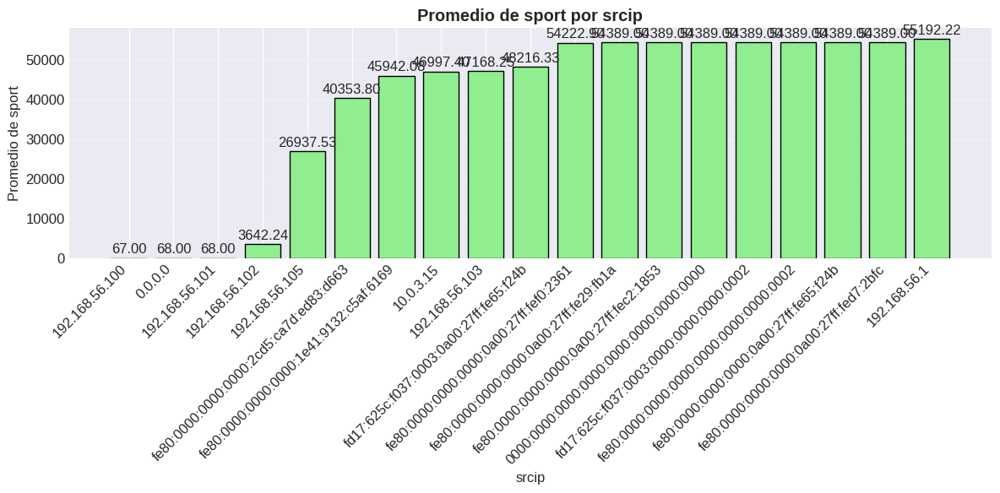


3. 🎨 HEATMAP DE PROMEDIOS (múltiples variables)
----------------------------------------


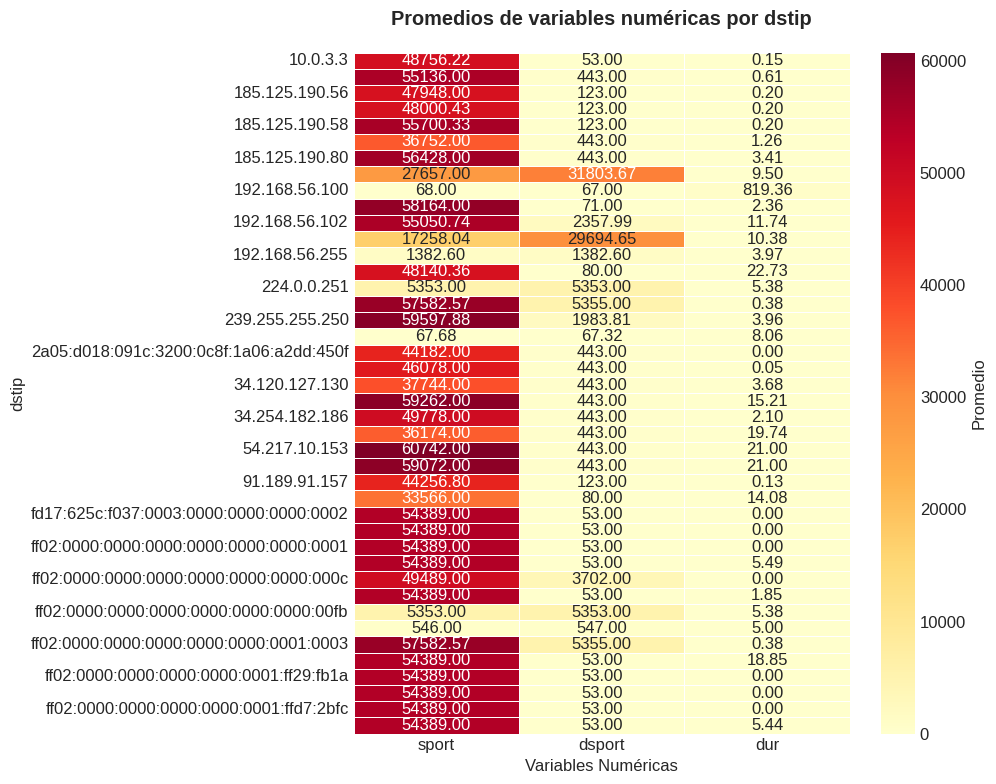


4. 🎨 SCATTER PLOT COLORIDO POR CATEGORÍA
----------------------------------------


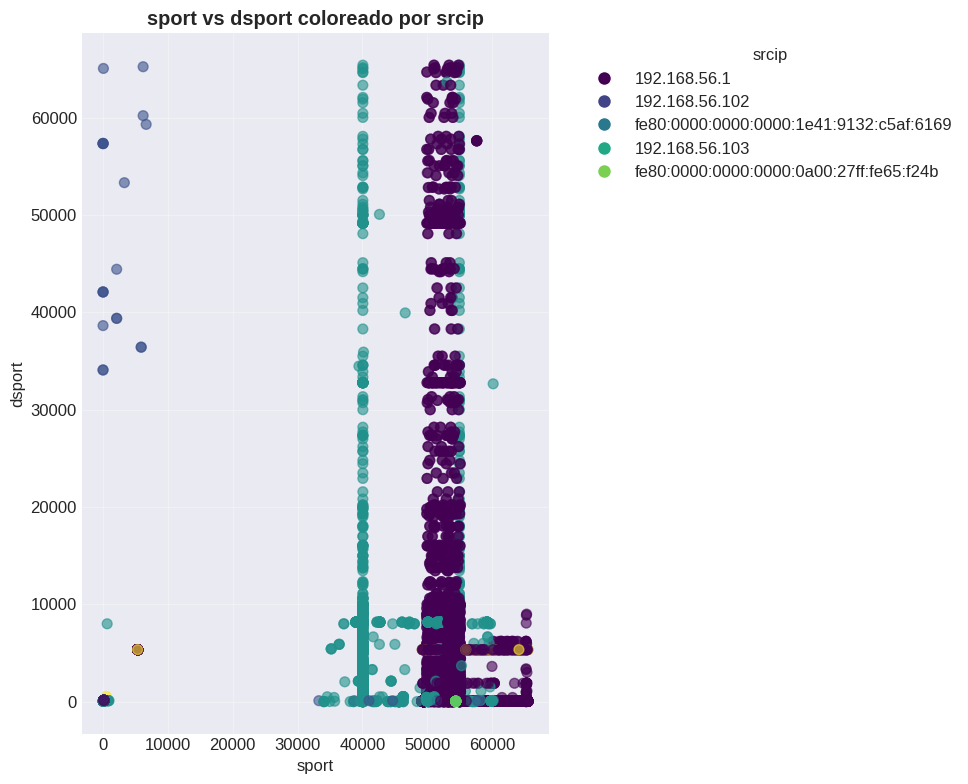

✅ SECUENCIA 3 COMPLETADA: Relaciones categóricas-numéricas analizadas


In [63]:
# ============================================
# SECUENCIA 3: CATEGÓRICAS VS NUMÉRICAS
# Cómo afectan las categorías a las variables numéricas
# ============================================

def secuencia3_categoricas_vs_numericas(df):
    """
    SECUENCIA 3: Análisis de relaciones categóricas vs numéricas
    """
    print("\n" + "="*60)
    print("🔀 SECUENCIA 3: CATEGÓRICAS VS NUMÉRICAS")
    print("="*60)

    # Identificar variables
    numericas = df.select_dtypes(include=[np.number]).columns
    categoricas = df.select_dtypes(include=['object', 'category']).columns

    if len(numericas) == 0 or len(categoricas) == 0:
        print("⚠️ Se necesitan variables numéricas Y categóricas")
        return None

    print(f"📊 Variables numéricas: {len(numericas)}")
    print(f"📋 Variables categóricas: {len(categoricas)}")

    # 3.1. Boxplots por categoría
    print("\n1. 📦 BOXPLOTS POR CATEGORÍA")
    print("-" * 40)

    # Tomar primera variable categórica y primera numérica
    cat_var = categoricas[0]
    num_var = numericas[0]

    print(f"Analizando: {cat_var} (categórica) vs {num_var} (numérica)")

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 6))

    # Boxplot
    df.boxplot(column=num_var, by=cat_var, ax=ax1, grid=False)
    ax1.set_title(f'Distribución de {num_var} por {cat_var}', fontweight='bold')
    ax1.set_xlabel(cat_var)
    ax1.set_ylabel(num_var)
    ax1.tick_params(axis='x', rotation=45)

    # Violin plot (alternativa)
    # Limitar a 10 categorías para mejor visualización
    top_categories = df[cat_var].value_counts().head(10).index
    df_filtered = df[df[cat_var].isin(top_categories)]

    if len(df_filtered) > 0:
        import seaborn as sns
        sns.violinplot(x=cat_var, y=num_var, data=df_filtered, ax=ax2)
        ax2.set_title(f'Violin Plot: {num_var} por {cat_var}', fontweight='bold')
        ax2.set_xlabel(cat_var)
        ax2.set_ylabel(num_var)
        ax2.tick_params(axis='x', rotation=45)

    plt.suptitle('')
    plt.tight_layout()
    plt.show()

    # 3.2. Gráfico de barras de promedios
    print("\n2. 📊 PROMEDIOS POR CATEGORÍA")
    print("-" * 40)

    # Calcular promedios por categoría
    promedios = df.groupby(cat_var)[num_var].mean().sort_values()

    plt.figure(figsize=(12, 6))
    bars = plt.bar(range(len(promedios)), promedios.values,
                  color='lightgreen', edgecolor='black')

    plt.title(f'Promedio de {num_var} por {cat_var}', fontweight='bold')
    plt.xlabel(cat_var)
    plt.ylabel(f'Promedio de {num_var}')
    plt.xticks(range(len(promedios)), promedios.index, rotation=45, ha='right')
    plt.grid(True, alpha=0.3, axis='y')

    # Añadir valores en las barras
    for bar in bars:
        height = bar.get_height()
        plt.text(bar.get_x() + bar.get_width()/2., height + 0.01*max(promedios.values),
                f'{height:.2f}', ha='center', va='bottom')

    plt.tight_layout()
    plt.show()

    # 3.3. Heatmap de promedios (si hay más variables)
    print("\n3. 🎨 HEATMAP DE PROMEDIOS (múltiples variables)")
    print("-" * 40)

    if len(numericas) > 1 and len(categoricas) > 1:
        # Tomar 3 variables numéricas y 1 categórica
        num_vars = numericas[:3]
        cat_var2 = categoricas[1] if len(categoricas) > 1 else cat_var

        # Calcular promedios
        heatmap_data = df.groupby(cat_var2)[list(num_vars)].mean()

        plt.figure(figsize=(10, 8))
        sns.heatmap(heatmap_data, annot=True, fmt='.2f', cmap='YlOrRd',
                   linewidths=.5, cbar_kws={'label': 'Promedio'})
        plt.title(f'Promedios de variables numéricas por {cat_var2}',
                 fontweight='bold', pad=20)
        plt.xlabel('Variables Numéricas')
        plt.ylabel(cat_var2)
        plt.tight_layout()
        plt.show()

    # 3.4. Gráfico de dispersión con colores por categoría
    print("\n4. 🎨 SCATTER PLOT COLORIDO POR CATEGORÍA")
    print("-" * 40)

    if len(numericas) >= 2:
        # Tomar 2 variables numéricas
        num_var1, num_var2 = numericas[0], numericas[1]

        # Limitar categorías si hay muchas
        if df[cat_var].nunique() > 10:
            # Tomar solo las 5 categorías más frecuentes
            top_cats = df[cat_var].value_counts().head(5).index
            df_scatter = df[df[cat_var].isin(top_cats)]
        else:
            df_scatter = df

        plt.figure(figsize=(10, 8))

        # Scatter plot con colores por categoría
        scatter = plt.scatter(df_scatter[num_var1], df_scatter[num_var2],
                             c=pd.Categorical(df_scatter[cat_var]).codes,
                             cmap='viridis', alpha=0.6, s=50)

        plt.title(f'{num_var1} vs {num_var2} coloreado por {cat_var}',
                 fontweight='bold')
        plt.xlabel(num_var1)
        plt.ylabel(num_var2)

        # Crear leyenda
        from matplotlib.lines import Line2D
        legend_elements = []
        for i, category in enumerate(df_scatter[cat_var].unique()):
            legend_elements.append(Line2D([0], [0], marker='o', color='w',
                                         label=category,
                                         markerfacecolor=plt.cm.viridis(i/len(df_scatter[cat_var].unique())),
                                         markersize=10))

        plt.legend(handles=legend_elements, title=cat_var,
                  bbox_to_anchor=(1.05, 1), loc='upper left')

        plt.grid(True, alpha=0.3)
        plt.tight_layout()
        plt.show()

    print("✅ SECUENCIA 3 COMPLETADA: Relaciones categóricas-numéricas analizadas")
    return cat_var, num_var

# EJECUTAR SECUENCIA 3
print("\n🚀 EJECUTANDO SECUENCIA 3: Categóricas vs Numéricas")
if 'df_limpio' in locals():
    cat_var, num_var = secuencia3_categoricas_vs_numericas(df_limpio)

In [64]:
# ============================================
# PASO 3: ANÁLISIS DE VARIABLES NUMÉRICAS
# ============================================

def paso3_analisis_numericas(df):
    """
    PASO 3: Análisis profundo de variables numéricas
    """
    print("\n🔍 PASO 3: ANÁLISIS DE VARIABLES NUMÉRICAS")
    print("="*60)

    # Identificar variables numéricas
    numericas = df.select_dtypes(include=[np.number]).columns

    if len(numericas) == 0:
        print("⚠️ No hay variables numéricas en el dataset")
        return None

    print(f"🔢 Se encontraron {len(numericas)} variables numéricas:")
    print(f"   {', '.join(numericas[:10])}{'...' if len(numericas) > 10 else ''}")

    # 3.1. Estadísticas descriptivas detalladas
    print("\n📊 ESTADÍSTICAS DESCRIPTIVAS DETALLADAS:")

    # Corrected aggregation block using list of tuples
    stats_df = df[numericas].agg([
        ('count', 'count'),
        ('mean', 'mean'),
        ('std', 'std'),
        ('min', 'min'),
        ('25%', lambda x: x.quantile(0.25)), # Custom names for lambda functions
        ('50%', lambda x: x.quantile(0.50)),
        ('75%', lambda x: x.quantile(0.75)),
        ('max', 'max'),
        ('skew', 'skew'),
        ('kurtosis', 'kurtosis')
    ]).T

    # No need to rename columns, names are set directly in agg call

    # Calcular métricas adicionales
    stats_df['cv'] = stats_df['std'] / stats_df['mean']  # Coeficiente de variación
    stats_df['range'] = stats_df['max'] - stats_df['min']
    stats_df['iqr'] = stats_df['75%'] - stats_df['25%']
    stats_df['missing'] = df[numericas].isnull().sum().values
    stats_df['missing_%'] = (stats_df['missing'] / len(df) * 100).round(2)

    # Ordenar por importancia (coeficiente de variación)
    stats_df = stats_df.sort_values('cv', ascending=False)

    display(stats_df)

    # 3.2. Histogramas y boxplots
    print("\n📈 DISTRIBUCIONES Y BOXPLOTS:")

    # Limitar a 12 variables para visualización
    vars_a_visualizar = numericas[:12] if len(numericas) > 12 else numericas

    n_cols = 3
    n_rows = int(np.ceil(len(vars_a_visualizar) / n_cols))

    fig, axes = plt.subplots(n_rows * 2, n_cols, figsize=(15, n_rows * 6))

    for idx, col in enumerate(vars_a_visualizar):
        row_hist = (idx // n_cols) * 2
        col_hist = idx % n_cols
        row_box = row_hist + 1

        # Histograma
        ax_hist = axes[row_hist, col_hist]
        df[col].hist(ax=ax_hist, bins=50, alpha=0.7, color='steelblue',
                     edgecolor='black', density=True)
        df[col].plot(kind='kde', ax=ax_hist, color='red', linewidth=2)

        # Líneas para media y mediana
        ax_hist.axvline(df[col].mean(), color='green', linestyle='--',
                       linewidth=2, label=f'Media: {df[col].mean():.2f}')
        ax_hist.axvline(df[col].median(), color='orange', linestyle='-.',
                       linewidth=2, label=f'Mediana: {df[col].median():.2f}')

        ax_hist.set_title(f'Distribución de {col}', fontweight='bold', fontsize=10)
        ax_hist.set_xlabel(col)
        ax_hist.set_ylabel('Densidad')
        ax_hist.legend(fontsize=8)
        ax_hist.grid(True, alpha=0.3)

        # Boxplot
        ax_box = axes[row_box, col_hist]
        df.boxplot(column=col, ax=ax_box, grid=False)
        ax_box.set_title(f'Boxplot de {col}', fontweight='bold', fontsize=10)
        ax_box.set_ylabel('Valores')

    # Ocultar ejes vacíos
    total_plots = n_rows * 2 * n_cols
    for idx in range(len(vars_a_visualizar) * 2, total_plots):
        row = idx // n_cols
        col = idx % n_cols
        axes[row, col].set_visible(False)

    plt.tight_layout()
    plt.show()

    # 3.3. Test de normalidad para variables principales
    print("\n🔬 TEST DE NORMALIDAD (Shapiro-Wilk):")
    print("-" * 40)

    vars_para_test = vars_a_visualizar[:5]  # Solo primeras 5

    for col in vars_para_test:
        data = df[col].dropna()
        if len(data) >= 3 and len(data) <= 5000:
            from scipy.stats import shapiro
            stat, p_value = shapiro(data)
            es_normal = "SÍ" if p_value > 0.05 else "NO"
            print(f"   {col}: p-value = {p_value:.4f} → Normal: {es_normal}")

    # 3.4. Identificación de outliers con método IQR
    print("\n⚠️  DETECCIÓN DE OUTLIERS (Método IQR):")
    print("-" * 40)

    outliers_info = []

    for col in vars_a_visualizar[:8]:  # Analizar solo primeras 8
        Q1 = df[col].quantile(0.25)
        Q3 = df[col].quantile(0.75)
        IQR = Q3 - Q1
        limite_inferior = Q1 - 1.5 * IQR
        limite_superior = Q3 + 1.5 * IQR

        outliers = df[(df[col] < limite_inferior) | (df[col] > limite_superior)]
        n_outliers = len(outliers)

        if n_outliers > 0:
            porcentaje = (n_outliers / len(df)) * 100
            outliers_info.append({
                'Variable': col,
                'Outliers': n_outliers,
                'Porcentaje': f'{porcentaje:.2f}%',
                'Límite_Inferior': f'{limite_inferior:.2f}',
                'Límite_Superior': f'{limite_superior:.2f}'
            })

    if outliers_info:
        outliers_df = pd.DataFrame(outliers_info)
        print("Variables con outliers significativos (>1%):")
        display(outliers_df[outliers_df['Porcentaje'].str.replace('%', '').astype(float) > 1])
    else:
        print("✅ No se encontraron outliers significativos")

    return stats_df, outliers_info

# Ejecutar paso 3
if 'df_limpio' in locals():
    stats_numericas, outliers_info = paso3_analisis_numericas(df_limpio)


🔍 PASO 3: ANÁLISIS DE VARIABLES NUMÉRICAS
🔢 Se encontraron 17 variables numéricas:
   sport, dsport, dur, sbytes, dbytes, Sload, Dload, Spkts, Dpkts, smeansz...

📊 ESTADÍSTICAS DESCRIPTIVAS DETALLADAS:


TypeError: Must provide 'func' or tuples of '(column, aggfunc).


🚀 EJECUTANDO SECUENCIA 4: Análisis Temporal

📅 SECUENCIA 4: ANÁLISIS TEMPORAL
📅 Columnas temporales encontradas: Stime, Ltime

1. ⏱️  CONVIRTIENDO 'Stime' A DATETIME
----------------------------------------
   • Convertidos: 32864 de 32864 registros
   • Rango temporal: 2025-07-30 11:44:23.680332+00:00 a 2025-08-20 19:22:21.953193+00:00

2. 📊 EXTRAYENDO COMPONENTES TEMPORALES
----------------------------------------
   Componentes extraídos: año, mes, día, día de semana, hora

3. 📈 DISTRIBUCIÓN TEMPORAL
----------------------------------------


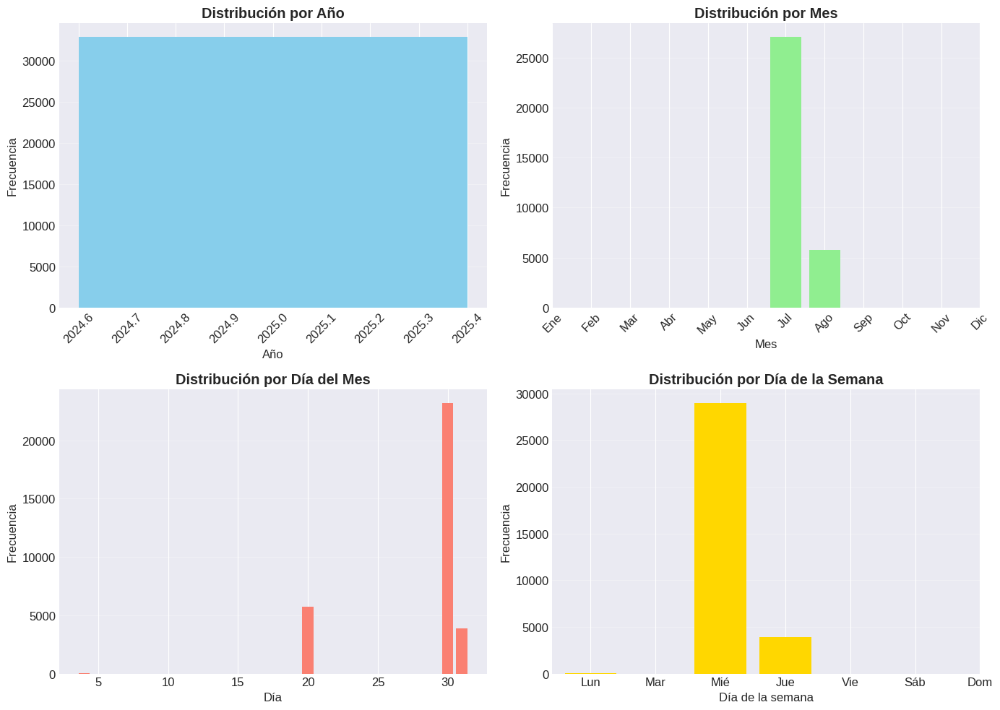


4. 📈 SERIES DE TIEMPO
----------------------------------------


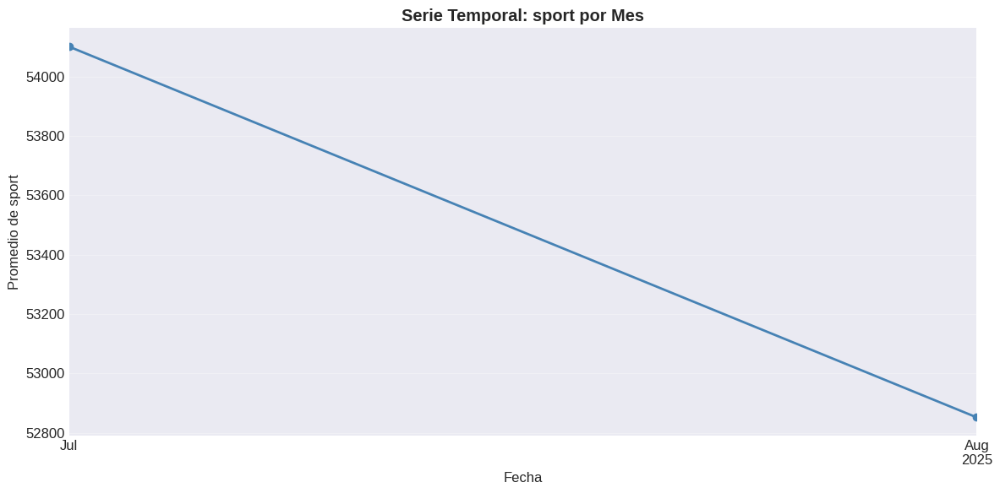


5. 🎨 HEATMAP TEMPORAL (Día vs Hora)
----------------------------------------


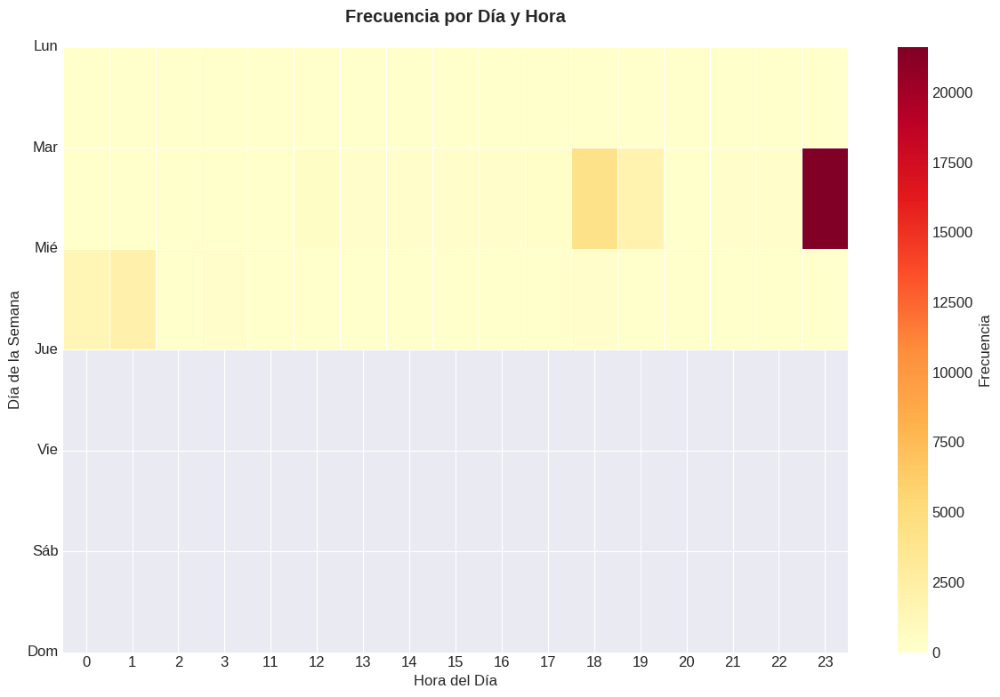

✅ SECUENCIA 4 COMPLETADA: Análisis temporal realizado


In [65]:
# ============================================
# SECUENCIA 4: ANÁLISIS TEMPORAL
# Solo si hay variables de fecha/hora
# ============================================

def secuencia4_analisis_temporal(df):
    """
    SECUENCIA 4: Análisis temporal (si hay fechas)
    """
    print("\n" + "="*60)
    print("📅 SECUENCIA 4: ANÁLISIS TEMPORAL")
    print("="*60)

    # Buscar columnas que parezcan fechas
    date_cols = []
    for col in df.columns:
        col_lower = col.lower()
        if any(keyword in col_lower for keyword in
               ['date', 'time', 'fecha', 'hora', 'timestamp', 'datetime',
                'year', 'month', 'day', 'hour', 'minute', 'second']):
            date_cols.append(col)

    if not date_cols:
        print("⚠️ No se encontraron columnas de fecha/hora")
        print("💡 Saltando esta secuencia...")
        return None

    print(f"📅 Columnas temporales encontradas: {', '.join(date_cols)}")

    # Tomar la primera columna de fecha
    fecha_col = date_cols[0]

    try:
        # 4.1. Convertir a datetime
        print(f"\n1. ⏱️  CONVIRTIENDO '{fecha_col}' A DATETIME")
        print("-" * 40)

        df_temp = df.copy()
        df_temp[fecha_col] = pd.to_datetime(df_temp[fecha_col], errors='coerce')

        n_converted = df_temp[fecha_col].notna().sum()
        print(f"   • Convertidos: {n_converted} de {len(df)} registros")
        print(f"   • Rango temporal: {df_temp[fecha_col].min()} a {df_temp[fecha_col].max()}")

        # 4.2. Extraer componentes temporales
        print("\n2. 📊 EXTRAYENDO COMPONENTES TEMPORALES")
        print("-" * 40)

        df_temp['year'] = df_temp[fecha_col].dt.year
        df_temp['month'] = df_temp[fecha_col].dt.month
        df_temp['day'] = df_temp[fecha_col].dt.day
        df_temp['weekday'] = df_temp[fecha_col].dt.weekday
        df_temp['hour'] = df_temp[fecha_col].dt.hour if df_temp[fecha_col].dt.hour.notna().any() else 0

        print("   Componentes extraídos: año, mes, día, día de semana, hora")

        # 4.3. Visualizar distribuciones temporales
        print("\n3. 📈 DISTRIBUCIÓN TEMPORAL")
        print("-" * 40)

        fig, axes = plt.subplots(2, 2, figsize=(14, 10))

        # Distribución por año
        if 'year' in df_temp.columns:
            year_counts = df_temp['year'].value_counts().sort_index()
            axes[0, 0].bar(year_counts.index, year_counts.values, color='skyblue')
            axes[0, 0].set_title('Distribución por Año', fontweight='bold')
            axes[0, 0].set_xlabel('Año')
            axes[0, 0].set_ylabel('Frecuencia')
            axes[0, 0].tick_params(axis='x', rotation=45)
            axes[0, 0].grid(True, alpha=0.3, axis='y')

        # Distribución por mes
        if 'month' in df_temp.columns:
            month_counts = df_temp['month'].value_counts().sort_index()
            meses = ['Ene', 'Feb', 'Mar', 'Abr', 'May', 'Jun',
                    'Jul', 'Ago', 'Sep', 'Oct', 'Nov', 'Dic']
            axes[0, 1].bar(month_counts.index, month_counts.values, color='lightgreen')
            axes[0, 1].set_title('Distribución por Mes', fontweight='bold')
            axes[0, 1].set_xlabel('Mes')
            axes[0, 1].set_ylabel('Frecuencia')
            axes[0, 1].set_xticks(range(1, 13))
            axes[0, 1].set_xticklabels(meses, rotation=45)
            axes[0, 1].grid(True, alpha=0.3, axis='y')

        # Distribución por día del mes
        if 'day' in df_temp.columns:
            day_counts = df_temp['day'].value_counts().sort_index()
            axes[1, 0].bar(day_counts.index, day_counts.values, color='salmon')
            axes[1, 0].set_title('Distribución por Día del Mes', fontweight='bold')
            axes[1, 0].set_xlabel('Día')
            axes[1, 0].set_ylabel('Frecuencia')
            axes[1, 0].grid(True, alpha=0.3, axis='y')

        # Distribución por día de la semana
        if 'weekday' in df_temp.columns:
            weekday_counts = df_temp['weekday'].value_counts().sort_index()
            dias = ['Lun', 'Mar', 'Mié', 'Jue', 'Vie', 'Sáb', 'Dom']
            axes[1, 1].bar(weekday_counts.index, weekday_counts.values, color='gold')
            axes[1, 1].set_title('Distribución por Día de la Semana', fontweight='bold')
            axes[1, 1].set_xlabel('Día de la semana')
            axes[1, 1].set_ylabel('Frecuencia')
            axes[1, 1].set_xticks(range(7))
            axes[1, 1].set_xticklabels(dias)
            axes[1, 1].grid(True, alpha=0.3, axis='y')

        plt.tight_layout()
        plt.show()

        # 4.4. Series de tiempo (si hay variable numérica)
        print("\n4. 📈 SERIES DE TIEMPO")
        print("-" * 40)

        numericas = df.select_dtypes(include=[np.number]).columns

        if len(numericas) > 0 and 'year' in df_temp.columns:
            # Tomar primera variable numérica
            num_var = numericas[0]

            # Agrupar por año y mes
            df_temp['year_month'] = df_temp[fecha_col].dt.to_period('M')
            time_series = df_temp.groupby('year_month')[num_var].mean()

            plt.figure(figsize=(12, 6))
            time_series.plot(marker='o', linewidth=2, color='steelblue')
            plt.title(f'Serie Temporal: {num_var} por Mes', fontweight='bold')
            plt.xlabel('Fecha')
            plt.ylabel(f'Promedio de {num_var}')
            plt.grid(True, alpha=0.3)
            plt.xticks(rotation=45)
            plt.tight_layout()
            plt.show()

        # 4.5. Heatmap temporal (día vs hora)
        print("\n5. 🎨 HEATMAP TEMPORAL (Día vs Hora)")
        print("-" * 40)

        if 'weekday' in df_temp.columns and 'hour' in df_temp.columns:
            # Crear matriz día vs hora
            heatmap_data = df_temp.groupby(['weekday', 'hour']).size().unstack(fill_value=0)

            plt.figure(figsize=(12, 8))
            sns.heatmap(heatmap_data, cmap='YlOrRd', annot=False,
                       linewidths=.5, cbar_kws={'label': 'Frecuencia'})

            plt.title('Frecuencia por Día y Hora', fontweight='bold', pad=20)
            plt.xlabel('Hora del Día')
            plt.ylabel('Día de la Semana')
            plt.yticks(ticks=range(7), labels=dias, rotation=0)
            plt.tight_layout()
            plt.show()

        print("✅ SECUENCIA 4 COMPLETADA: Análisis temporal realizado")
        return fecha_col, df_temp

    except Exception as e:
        print(f"❌ Error en análisis temporal: {e}")
        return None

# EJECUTAR SECUENCIA 4
print("\n🚀 EJECUTANDO SECUENCIA 4: Análisis Temporal")
if 'df_limpio' in locals():
    fecha_info = secuencia4_analisis_temporal(df_limpio)


🚀 EJECUTANDO SECUENCIA 5: Visualizaciones Avanzadas

🎨 SECUENCIA 5: VISUALIZACIONES AVANZADAS

1. 🔄 MATRIZ DE SCATTER PLOTS AVANZADA
----------------------------------------


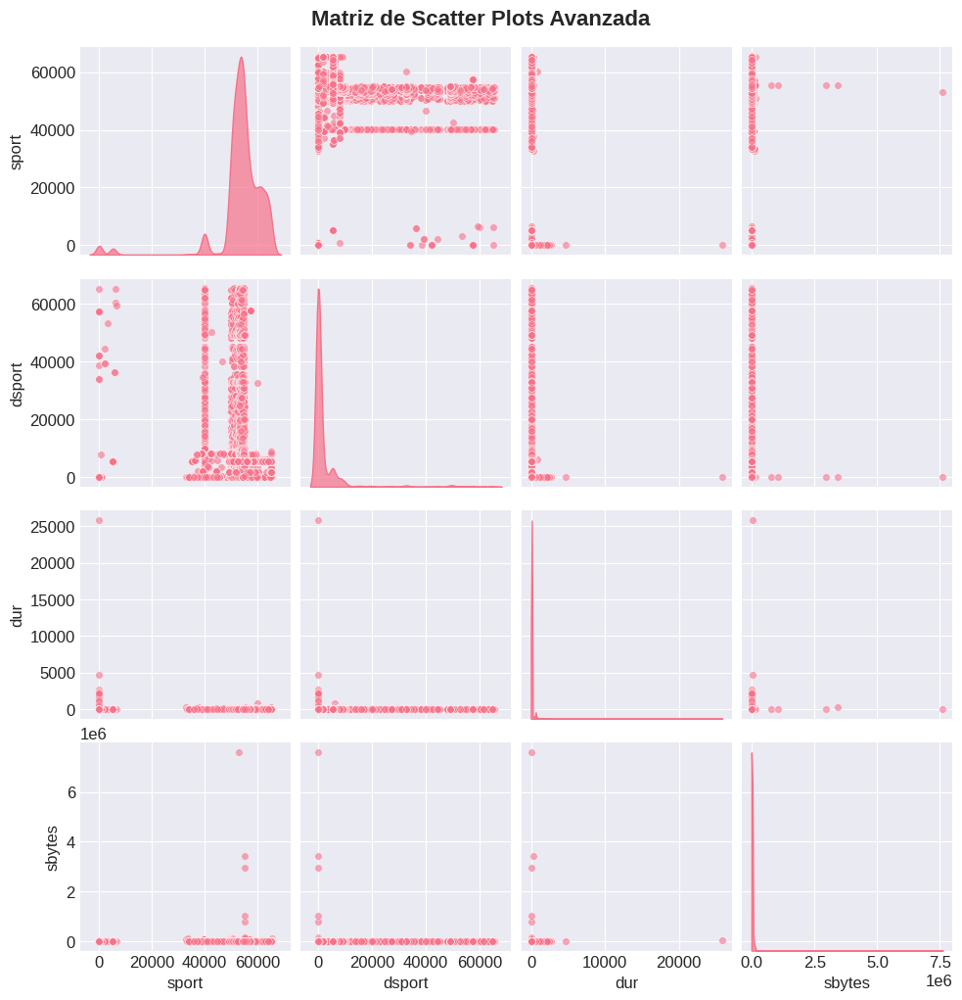


2. 🕷️  GRÁFICO DE RADAR (SPIDER CHART)
----------------------------------------


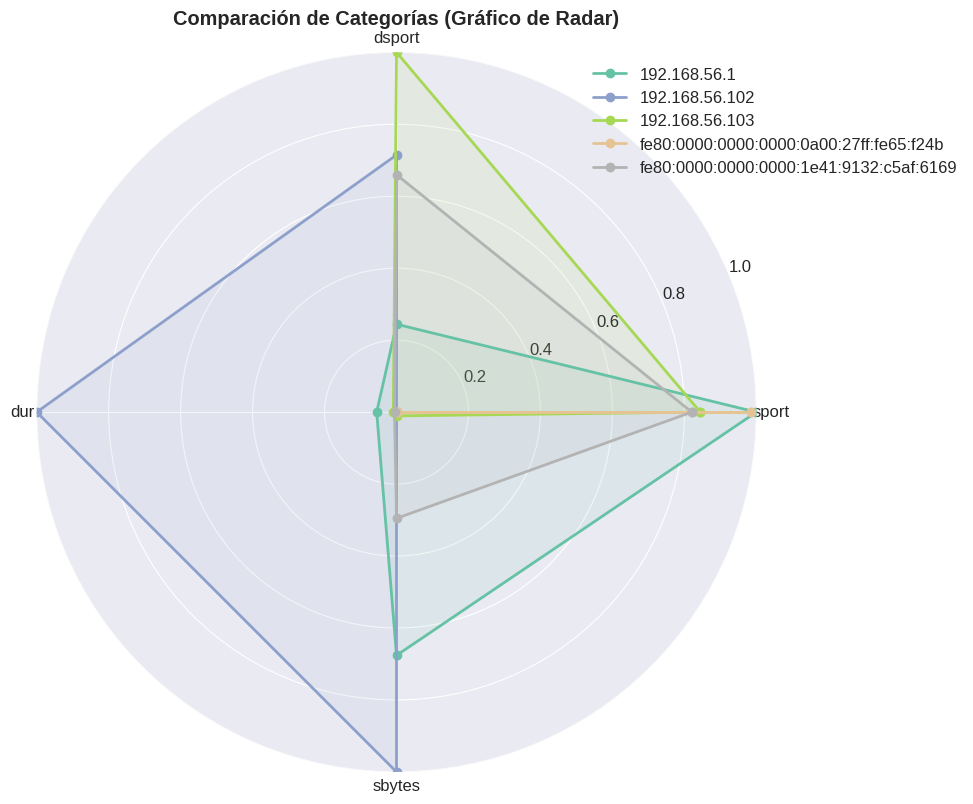


3. 🌳 TREEMAP (Visualización Jerárquica)
----------------------------------------


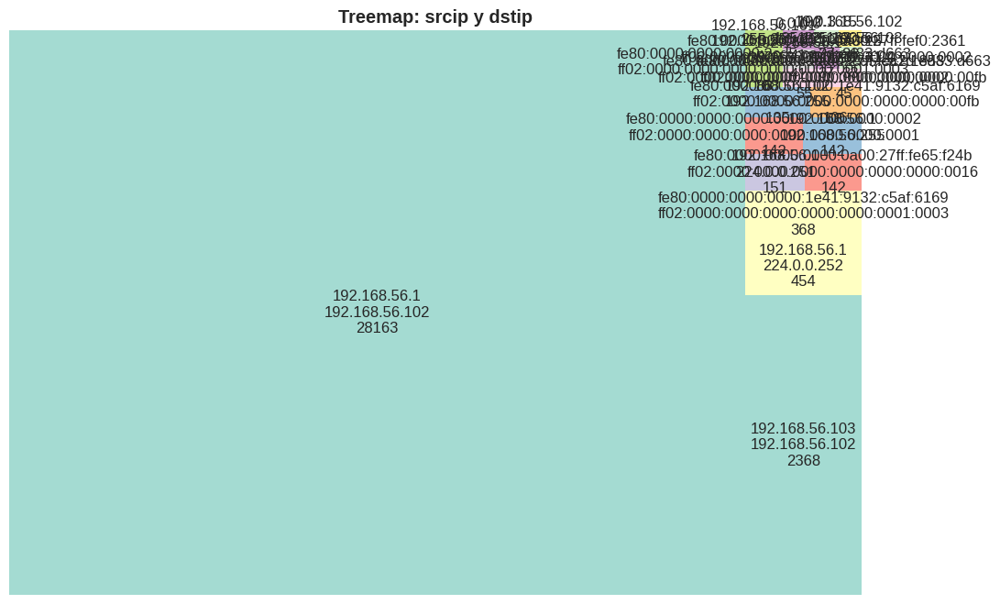


4. 🎻 GRÁFICO DE VIOLÍN AVANZADO
----------------------------------------


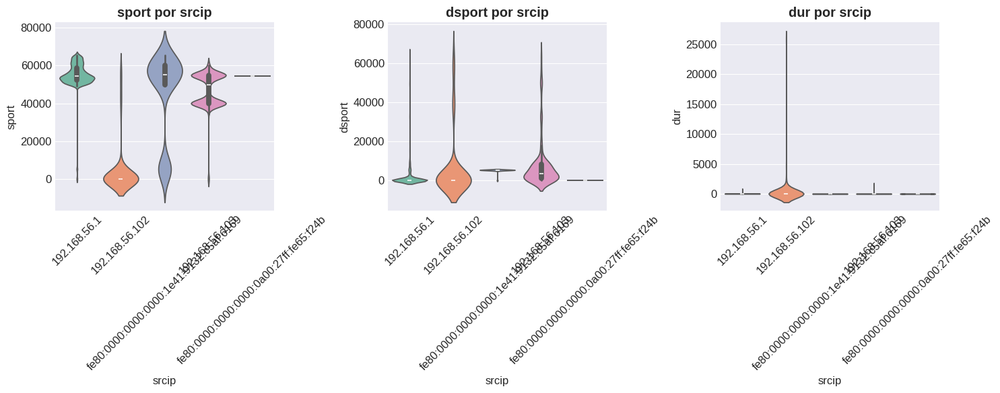


5. 🫧 GRÁFICO DE BURBUJAS (BUBBLE CHART)
----------------------------------------


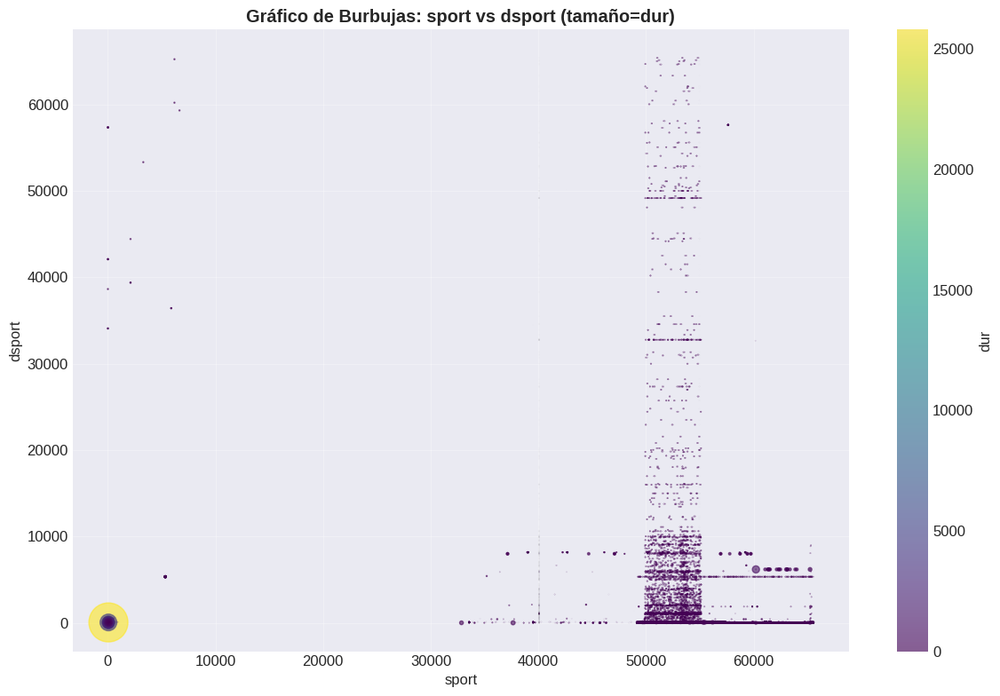

✅ SECUENCIA 5 COMPLETADA: Visualizaciones avanzadas creadas


In [67]:
# ============================================
# SECUENCIA 5: VISUALIZACIONES AVANZADAS
# Gráficos complejos y multivariables
# ============================================

def secuencia5_visualizaciones_avanzadas(df):
    """
    SECUENCIA 5: Visualizaciones avanzadas y multivariables
    """
    print("\n" + "="*60)
    print("🎨 SECUENCIA 5: VISUALIZACIONES AVANZADAS")
    print("="*60)

    # 5.1. Matriz de scatter plots avanzada
    print("\n1. 🔄 MATRIZ DE SCATTER PLOTS AVANZADA")
    print("-" * 40)

    numericas = df.select_dtypes(include=[np.number]).columns

    if len(numericas) >= 3:
        # Seleccionar hasta 4 variables numéricas
        vars_selected = numericas[:4] if len(numericas) > 4 else numericas

        # Crear pairplot avanzado con seaborn
        import seaborn as sns

        pairplot_data = df[vars_selected].dropna()

        if len(pairplot_data) > 0:
            g = sns.pairplot(pairplot_data,
                            diag_kind='kde',
                            plot_kws={'alpha': 0.6, 's': 30},
                            diag_kws={'fill': True, 'alpha': 0.7})

            g.fig.suptitle('Matriz de Scatter Plots Avanzada',
                          y=1.02, fontsize=16, fontweight='bold')
            plt.show()

    # 5.2. Gráfico de radar (spider chart) para comparar categorías
    print("\n2. 🕷️  GRÁFICO DE RADAR (SPIDER CHART)")
    print("-" * 40)

    categoricas = df.select_dtypes(include=['object', 'category']).columns
    numericas = df.select_dtypes(include=[np.number]).columns

    if len(categoricas) > 0 and len(numericas) >= 3:
        cat_var = categoricas[0]

        # Limitar a categorías con suficientes datos
        top_categories = df[cat_var].value_counts().head(5).index

        if len(top_categories) >= 2:
            # Seleccionar 3-4 variables numéricas para el radar
            radar_vars = numericas[:4] if len(numericas) > 4 else numericas

            # Calcular promedios por categoría
            radar_data = df[df[cat_var].isin(top_categories)].groupby(cat_var)[radar_vars].mean()

            # Normalizar datos para el radar (0-1)
            from sklearn.preprocessing import MinMaxScaler
            scaler = MinMaxScaler()
            radar_normalized = pd.DataFrame(
                scaler.fit_transform(radar_data),
                columns=radar_vars,
                index=radar_data.index
            )

            # Crear gráfico de radar
            angles = np.linspace(0, 2*np.pi, len(radar_vars), endpoint=False).tolist()
            angles += angles[:1]  # Cerrar el círculo

            fig, ax = plt.subplots(figsize=(10, 10), subplot_kw=dict(projection='polar'))

            colors = plt.cm.Set2(np.linspace(0, 1, len(top_categories)))

            for idx, (category, row) in enumerate(radar_normalized.iterrows()):
                values = row.tolist()
                values += values[:1]  # Cerrar el círculo

                ax.plot(angles, values, 'o-', linewidth=2, label=category, color=colors[idx])
                ax.fill(angles, values, alpha=0.1, color=colors[idx])

            ax.set_xticks(angles[:-1])
            ax.set_xticklabels(radar_vars)
            ax.set_ylim(0, 1)
            ax.set_title('Comparación de Categorías (Gráfico de Radar)',
                        fontweight='bold', pad=20)
            ax.legend(loc='upper right', bbox_to_anchor=(1.3, 1.0))

            plt.tight_layout()
            plt.show()

    # 5.3. Treemap (si hay jerarquía categórica)
    print("\n3. 🌳 TREEMAP (Visualización Jerárquica)")
    print("-" * 40)

    if len(categoricas) >= 2:
        # Tomar dos variables categóricas
        cat1, cat2 = categoricas[0], categoricas[1] if len(categoricas) > 1 else categoricas[0]

        try:
            import squarify

            # Calcular tamaños
            sizes = df.groupby([cat1, cat2]).size().reset_index(name='count')

            # Tomar top N combinaciones
            sizes = sizes.sort_values('count', ascending=False).head(20)

            # Crear etiquetas
            labels = [f"{row[cat1]}\n{row[cat2]}\n{row['count']}"
                     for _, row in sizes.iterrows()]

            plt.figure(figsize=(12, 8))
            colors = plt.cm.Set3(np.arange(len(sizes)) / len(sizes))

            squarify.plot(sizes=sizes['count'], label=labels,
                         color=colors, alpha=0.8)

            plt.title(f'Treemap: {cat1} y {cat2}', fontweight='bold')
            plt.axis('off')
            plt.show()

        except ImportError:
            print("   ⚠️  Instala 'squarify' para treemaps: !pip install squarify")

    # 5.4. Gráfico de violín avanzado
    print("\n4. 🎻 GRÁFICO DE VIOLÍN AVANZADO")
    print("-" * 40)

    if len(categoricas) > 0 and len(numericas) > 0:
        cat_var = categoricas[0]
        num_vars = numericas[:3] if len(numericas) > 3 else numericas

        # Limitar categorías
        top_cats = df[cat_var].value_counts().head(5).index
        df_violin = df[df[cat_var].isin(top_cats)]

        n_vars = len(num_vars)
        fig, axes = plt.subplots(1, n_vars, figsize=(5*n_vars, 6))
        axes = axes if n_vars > 1 else [axes]

        for idx, num_var in enumerate(num_vars):
            sns.violinplot(x=cat_var, y=num_var, data=df_violin,
                          ax=axes[idx], palette='Set2')
            axes[idx].set_title(f'{num_var} por {cat_var}', fontweight='bold')
            axes[idx].set_xlabel(cat_var)
            axes[idx].set_ylabel(num_var)
            axes[idx].tick_params(axis='x', rotation=45)

        plt.tight_layout()
        plt.show()

    # 5.5. Gráfico de burbujas (bubble chart)
    print("\n5. 🫧 GRÁFICO DE BURBUJAS (BUBBLE CHART)")
    print("-" * 40)

    if len(numericas) >= 3:
        # Tomar 3 variables numéricas: x, y, tamaño
        x_var, y_var, size_var = numericas[0], numericas[1], numericas[2]

        # Normalizar tamaño para visualización
        sizes = (df[size_var] - df[size_var].min()) / (df[size_var].max() - df[size_var].min())
        sizes = sizes * 1000  # Escalar para mejor visualización

        plt.figure(figsize=(12, 8))
        scatter = plt.scatter(df[x_var], df[y_var],
                             s=sizes,
                             alpha=0.6,
                             c=df[size_var],  # Color por tercera variable
                             cmap='viridis')

        plt.title(f'Gráfico de Burbujas: {x_var} vs {y_var} (tamaño={size_var})',
                 fontweight='bold')
        plt.xlabel(x_var)
        plt.ylabel(y_var)

        # Añadir colorbar
        plt.colorbar(scatter, label=size_var)

        plt.grid(True, alpha=0.3)
        plt.tight_layout()
        plt.show()

    print("✅ SECUENCIA 5 COMPLETADA: Visualizaciones avanzadas creadas")
    return True

# EJECUTAR SECUENCIA 5
print("\n🚀 EJECUTANDO SECUENCIA 5: Visualizaciones Avanzadas")
if 'df_limpio' in locals():
    secuencia5_visualizaciones_avanzadas(df_limpio)


🚀 EJECUTANDO SECUENCIA 6: Dashboard Final

📋 SECUENCIA 6: DASHBOARD Y REPORTE FINAL

1. 🎨 CREANDO DASHBOARD RESUMEN
----------------------------------------


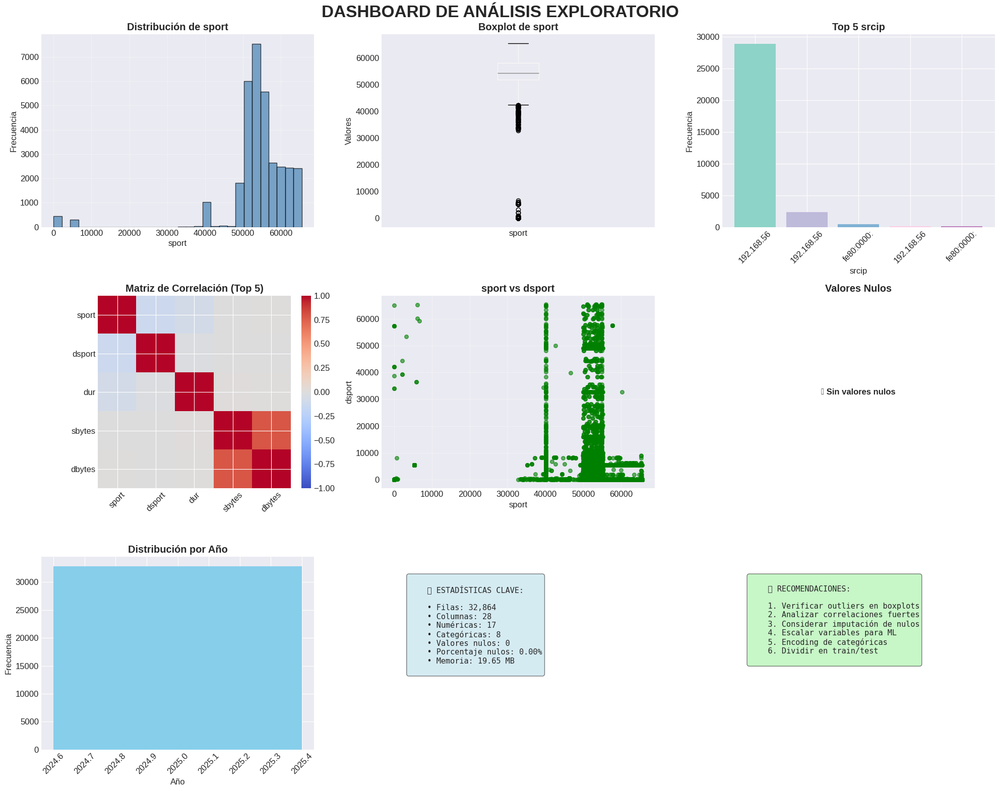


2. 📋 GENERANDO REPORTE FINAL
----------------------------------------
✅ Reporte guardado en: /content/reporte_visualizacion.txt

        REPORTE FINAL DE VISUALIZACIÓN EXPLORATORIA
        
        Fecha de generación: 2026-01-22 01:10:53
        Dataset analizado: 32864 filas × 28 columnas
        
        RESUMEN DE ANÁLISIS:
        • Variables numéricas: 17
        • Variables categóricas: 8
        • Columnas con valores nulos: 0
        • Porcentaje total de nulos: 0.00%
        
        SECUENCIAS EJECUTADAS:
        1. Visualizaciones básicas de distribución ✓
        2. Análisis de correlaciones y relaciones ✓
        3. Categóricas vs Numéricas ✓
        4. Análisis temporal ✓
        5. Visualizaciones avanzadas ✓
        6. Dashboard final ✓
        
        PRÓXIMOS PASOS RECOMENDADOS:
        1. Feature engineering basado en insights
        2. Preparación para modelado (escalado, encoding)
        3. División train/validation/test
        4. Selección de modelo apropiad

In [68]:
# ============================================
# SECUENCIA 6: DASHBOARD Y REPORTE FINAL
# Resumen ejecutivo de todas las visualizaciones
# ============================================

def secuencia6_dashboard_final(df):
    """
    SECUENCIA 6: Dashboard final y reporte ejecutivo
    """
    print("\n" + "="*60)
    print("📋 SECUENCIA 6: DASHBOARD Y REPORTE FINAL")
    print("="*60)

    # 6.1. Crear dashboard resumen
    print("\n1. 🎨 CREANDO DASHBOARD RESUMEN")
    print("-" * 40)

    # Configurar figura grande para dashboard
    fig = plt.figure(figsize=(20, 16))

    # Título principal
    fig.suptitle('DASHBOARD DE ANÁLISIS EXPLORATORIO',
                fontsize=24, fontweight='bold', y=0.98)

    # 6.2. Subplot 1: Distribuciones numéricas (2x2)
    ax1 = plt.subplot(3, 3, 1)
    numericas = df.select_dtypes(include=[np.number]).columns

    if len(numericas) > 0:
        # Histograma de primera variable numérica
        df[numericas[0]].hist(ax=ax1, bins=30, alpha=0.7,
                             color='steelblue', edgecolor='black')
        ax1.set_title(f'Distribución de {numericas[0]}', fontweight='bold')
        ax1.set_xlabel(numericas[0])
        ax1.set_ylabel('Frecuencia')
        ax1.grid(True, alpha=0.3)

    # 6.3. Subplot 2: Boxplot
    ax2 = plt.subplot(3, 3, 2)
    if len(numericas) > 0:
        df.boxplot(column=numericas[0], ax=ax2, grid=False)
        ax2.set_title(f'Boxplot de {numericas[0]}', fontweight='bold')
        ax2.set_ylabel('Valores')

    # 6.4. Subplot 3: Top categorías
    ax3 = plt.subplot(3, 3, 3)
    categoricas = df.select_dtypes(include=['object', 'category']).columns

    if len(categoricas) > 0:
        top_cats = df[categoricas[0]].value_counts().head(5)
        colors = plt.cm.Set3(np.arange(len(top_cats)) / len(top_cats))
        ax3.bar(range(len(top_cats)), top_cats.values, color=colors)
        ax3.set_title(f'Top 5 {categoricas[0]}', fontweight='bold')
        ax3.set_xlabel(categoricas[0])
        ax3.set_ylabel('Frecuencia')
        ax3.set_xticks(range(len(top_cats)))
        ax3.set_xticklabels([str(x)[:10] for x in top_cats.index], rotation=45)

    # 6.5. Subplot 4: Matriz de correlación (mini)
    ax4 = plt.subplot(3, 3, 4)
    if len(numericas) >= 2:
        corr_mini = df[numericas[:5]].corr()
        im = ax4.imshow(corr_mini, cmap='coolwarm', vmin=-1, vmax=1)
        ax4.set_title('Matriz de Correlación (Top 5)', fontweight='bold')
        ax4.set_xticks(range(len(corr_mini.columns)))
        ax4.set_yticks(range(len(corr_mini.columns)))
        ax4.set_xticklabels([x[:10] for x in corr_mini.columns], rotation=45)
        ax4.set_yticklabels([x[:10] for x in corr_mini.columns])
        plt.colorbar(im, ax=ax4, fraction=0.046, pad=0.04)

    # 6.6. Subplot 5: Scatter plot relación principal
    ax5 = plt.subplot(3, 3, 5)
    if len(numericas) >= 2:
        ax5.scatter(df[numericas[0]], df[numericas[1]],
                   alpha=0.6, s=30, color='green')
        ax5.set_title(f'{numericas[0]} vs {numericas[1]}', fontweight='bold')
        ax5.set_xlabel(numericas[0])
        ax5.set_ylabel(numericas[1])
        ax5.grid(True, alpha=0.3)

    # 6.7. Subplot 6: Valores nulos
    ax6 = plt.subplot(3, 3, 6)
    nulos_por_columna = df.isnull().sum().sort_values(ascending=False)
    nulos_por_columna = nulos_por_columna[nulos_por_columna > 0]

    if len(nulos_por_columna) > 0:
        bars = ax6.barh(range(len(nulos_por_columna.head(5))),
                       nulos_por_columna.head(5).values,
                       color='coral')
        ax6.set_title('Top 5 Columnas con Nulos', fontweight='bold')
        ax6.set_xlabel('Cantidad de Nulos')
        ax6.set_yticks(range(len(nulos_por_columna.head(5))))
        ax6.set_yticklabels([x[:15] for x in nulos_por_columna.head(5).index])
        ax6.invert_yaxis()
    else:
        ax6.text(0.5, 0.5, '✅ Sin valores nulos',
                ha='center', va='center', fontsize=12, fontweight='bold')
        ax6.set_title('Valores Nulos', fontweight='bold')
        ax6.axis('off')

    # 6.8. Subplot 7: Distribución temporal (si hay)
    ax7 = plt.subplot(3, 3, 7)

    # Buscar columnas de fecha
    date_cols = [col for col in df.columns if any(
        keyword in col.lower() for keyword in ['date', 'time', 'fecha', 'hora']
    )]

    if date_cols:
        try:
            df_temp = df.copy()
            df_temp[date_cols[0]] = pd.to_datetime(df_temp[date_cols[0]], errors='coerce')
            df_temp['year'] = df_temp[date_cols[0]].dt.year

            if 'year' in df_temp.columns:
                year_counts = df_temp['year'].value_counts().sort_index()
                ax7.bar(year_counts.index, year_counts.values, color='skyblue')
                ax7.set_title('Distribución por Año', fontweight='bold')
                ax7.set_xlabel('Año')
                ax7.set_ylabel('Frecuencia')
                ax7.tick_params(axis='x', rotation=45)
        except:
            ax7.text(0.5, 0.5, '⚠️ Error en fecha',
                    ha='center', va='center', fontsize=12)
            ax7.set_title('Análisis Temporal', fontweight='bold')
            ax7.axis('off')
    else:
        ax7.text(0.5, 0.5, '📅 Sin datos temporales',
                ha='center', va='center', fontsize=12)
        ax7.set_title('Análisis Temporal', fontweight='bold')
        ax7.axis('off')

    # 6.9. Subplot 8: Estadísticas clave
    ax8 = plt.subplot(3, 3, 8)
    ax8.axis('off')

    stats_text = f"""
    📊 ESTADÍSTICAS CLAVE:

    • Filas: {df.shape[0]:,}
    • Columnas: {df.shape[1]}
    • Numéricas: {len(numericas)}
    • Categóricas: {len(categoricas)}
    • Valores nulos: {df.isnull().sum().sum():,}
    • Porcentaje nulos: {(df.isnull().sum().sum()/(df.shape[0]*df.shape[1])*100):.2f}%
    • Memoria: {df.memory_usage(deep=True).sum()/(1024*1024):.2f} MB
    """

    ax8.text(0.1, 0.9, stats_text, fontsize=11,
            family='monospace', verticalalignment='top',
            bbox=dict(boxstyle='round', facecolor='lightblue', alpha=0.5))

    # 6.10. Subplot 9: Recomendaciones
    ax9 = plt.subplot(3, 3, 9)
    ax9.axis('off')

    recomendaciones = """
    💡 RECOMENDACIONES:

    1. Verificar outliers en boxplots
    2. Analizar correlaciones fuertes
    3. Considerar imputación de nulos
    4. Escalar variables para ML
    5. Encoding de categóricas
    6. Dividir en train/test
    """

    ax9.text(0.1, 0.9, recomendaciones, fontsize=11,
            family='monospace', verticalalignment='top',
            bbox=dict(boxstyle='round', facecolor='lightgreen', alpha=0.5))

    plt.tight_layout()
    plt.show()

    # 6.11. Generar reporte final
    print("\n2. 📋 GENERANDO REPORTE FINAL")
    print("-" * 40)

    try:
        from datetime import datetime

        reporte = f"""
        {'='*70}
        REPORTE FINAL DE VISUALIZACIÓN EXPLORATORIA
        {'='*70}

        Fecha de generación: {datetime.now().strftime('%Y-%m-%d %H:%M:%S')}
        Dataset analizado: {df.shape[0]} filas × {df.shape[1]} columnas

        RESUMEN DE ANÁLISIS:
        • Variables numéricas: {len(numericas)}
        • Variables categóricas: {len(categoricas)}
        • Columnas con valores nulos: {(df.isnull().any()).sum()}
        • Porcentaje total de nulos: {(df.isnull().sum().sum()/(df.shape[0]*df.shape[1])*100):.2f}%

        SECUENCIAS EJECUTADAS:
        1. Visualizaciones básicas de distribución ✓
        2. Análisis de correlaciones y relaciones ✓
        3. Categóricas vs Numéricas ✓
        4. Análisis temporal ✓
        5. Visualizaciones avanzadas ✓
        6. Dashboard final ✓

        PRÓXIMOS PASOS RECOMENDADOS:
        1. Feature engineering basado en insights
        2. Preparación para modelado (escalado, encoding)
        3. División train/validation/test
        4. Selección de modelo apropiado
        5. Entrenamiento y evaluación
        """

        # Guardar reporte
        with open('/content/reporte_visualizacion.txt', 'w') as f:
            f.write(reporte)

        print("✅ Reporte guardado en: /content/reporte_visualizacion.txt")

        # Mostrar resumen en pantalla
        print(reporte)

    except Exception as e:
        print(f"⚠️ Error al generar reporte: {e}")

    print("✅ SECUENCIA 6 COMPLETADA: Dashboard y reporte final creados")
    print("\n" + "🎉"*30)
    print("🎉 ANÁLISIS DE VISUALIZACIÓN COMPLETADO")
    print("🎉"*30)

    return True

# EJECUTAR SECUENCIA 6
print("\n🚀 EJECUTANDO SECUENCIA 6: Dashboard Final")
if 'df_limpio' in locals():
    secuencia6_dashboard_final(df_limpio)

🚀 EJECUTANDO TODAS LAS SECUENCIAS DE VISUALIZACIÓN

▶ SECUENCIA 1: Visualizaciones básicas
📊 SECUENCIA 1: VISUALIZACIONES BÁSICAS DE DISTRIBUCIÓN

1. 📈 HISTOGRAMAS DE VARIABLES NUMÉRICAS
----------------------------------------


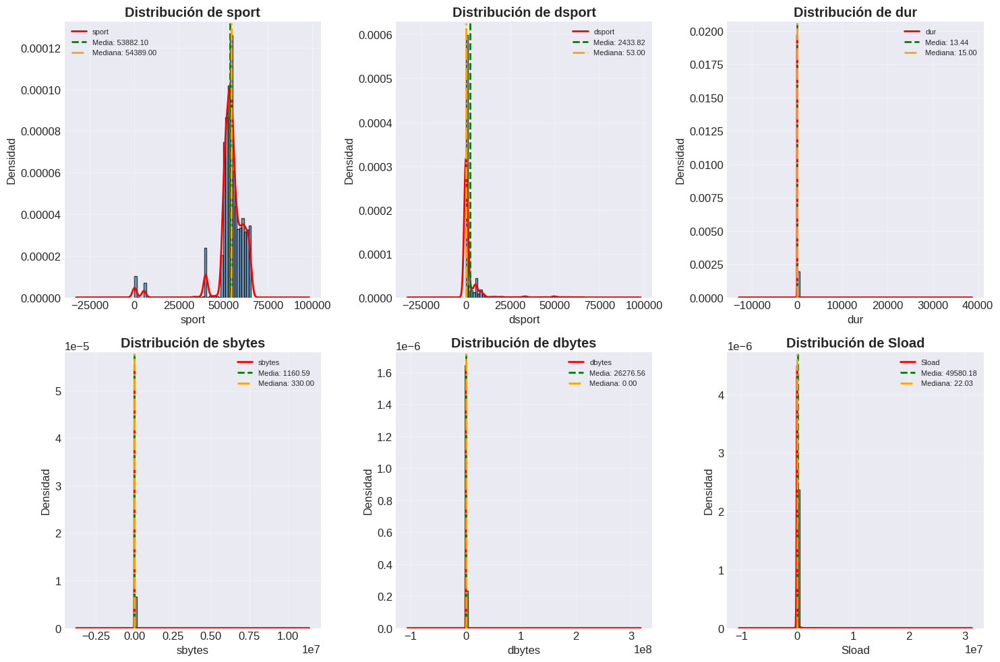


2. 📦 BOXPLOTS PARA DETECCIÓN DE OUTLIERS
----------------------------------------


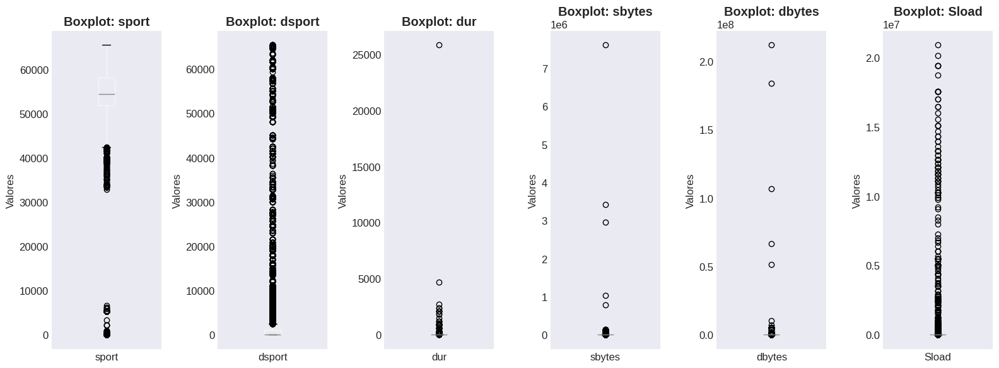


3. 📊 GRÁFICOS DE BARRAS PARA VARIABLES CATEGÓRICAS
----------------------------------------


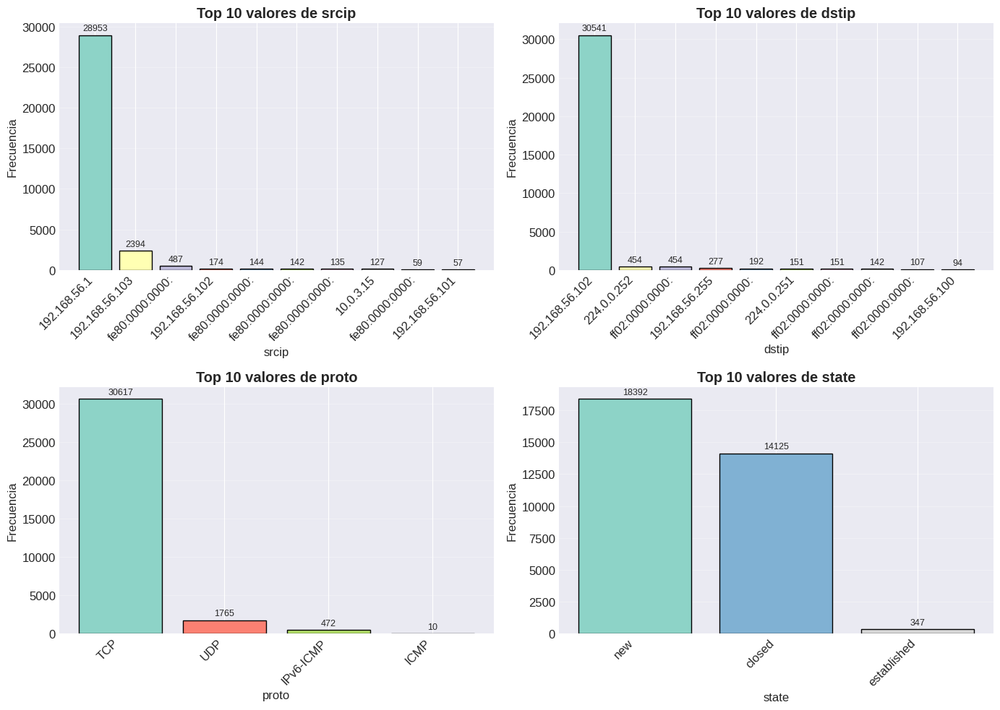

✅ SECUENCIA 1 COMPLETADA: Distribuciones básicas entendidas

▶ SECUENCIA 2: Análisis de correlaciones

🔗 SECUENCIA 2: ANÁLISIS DE CORRELACIONES Y RELACIONES

1. 📊 MATRIZ DE CORRELACIÓN
----------------------------------------


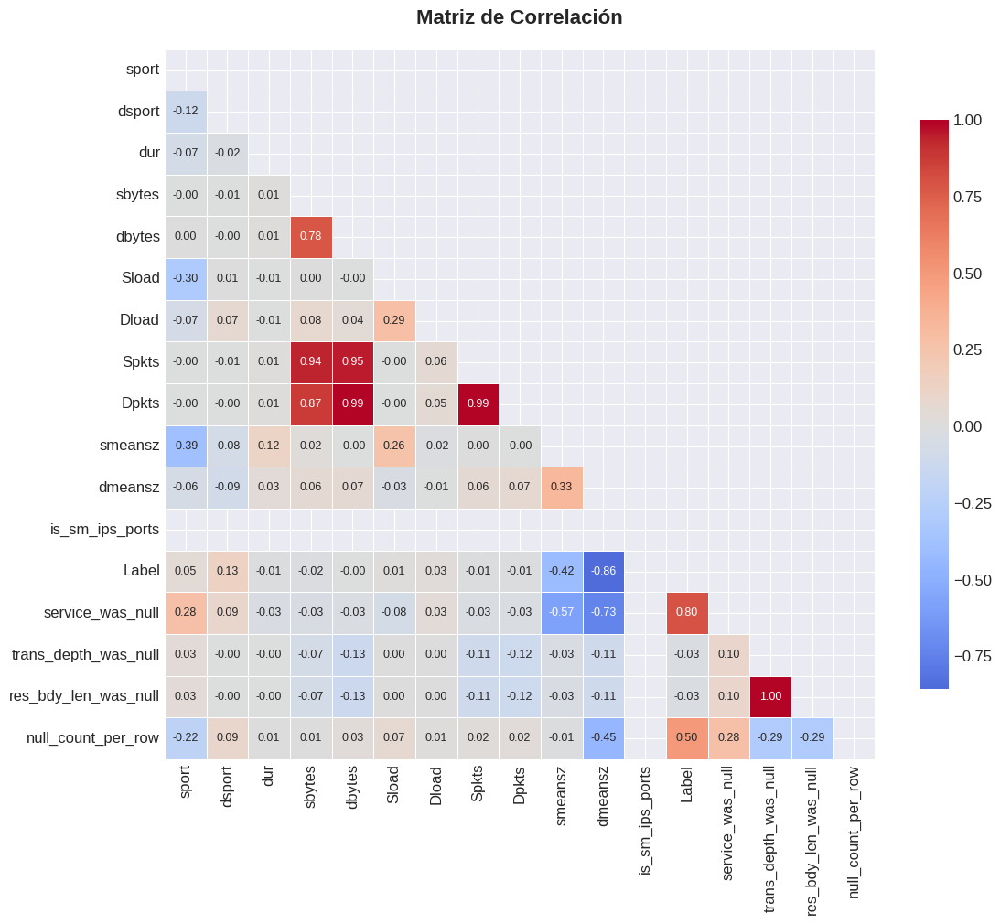


2. 💪 CORRELACIONES FUERTES (|r| > 0.7)
----------------------------------------
Correlaciones muy fuertes encontradas:
   • sbytes ↔ dbytes: 0.784 (POSITIVA)
   • sbytes ↔ Spkts: 0.937 (POSITIVA)
   • sbytes ↔ Dpkts: 0.874 (POSITIVA)
   • dbytes ↔ Spkts: 0.951 (POSITIVA)
   • dbytes ↔ Dpkts: 0.987 (POSITIVA)

3. 📈 SCATTER PLOTS PARA RELACIONES FUERTES
----------------------------------------


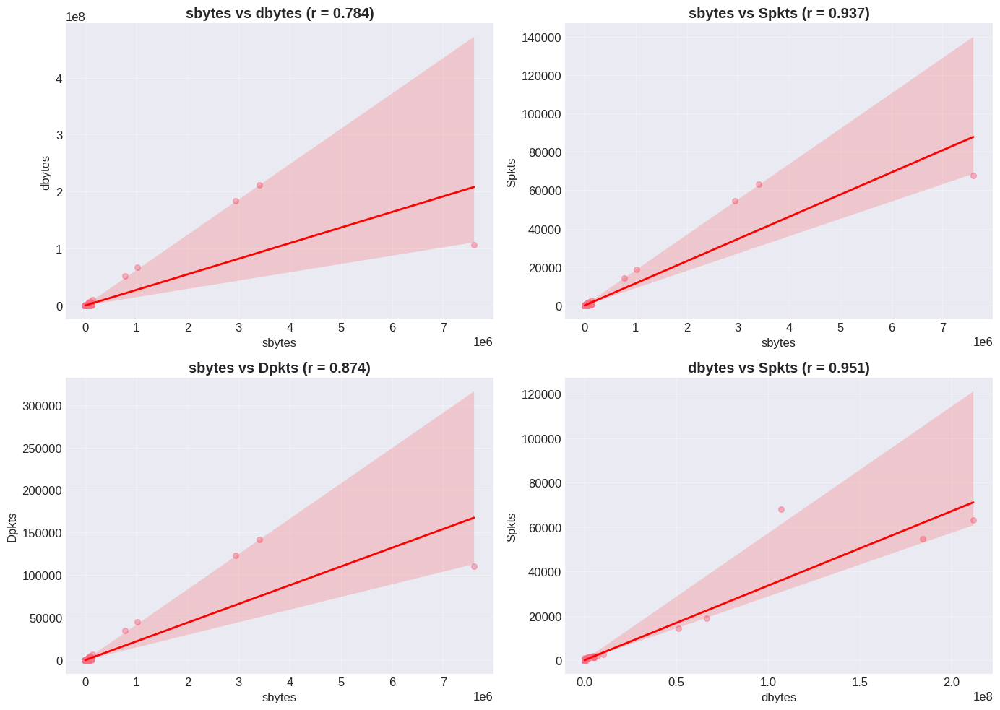


4. 🔄 MATRIZ DE SCATTER PLOTS (PAIRPLOT)
----------------------------------------
Variables incluidas: sport, dsport, dur, sbytes, dbytes


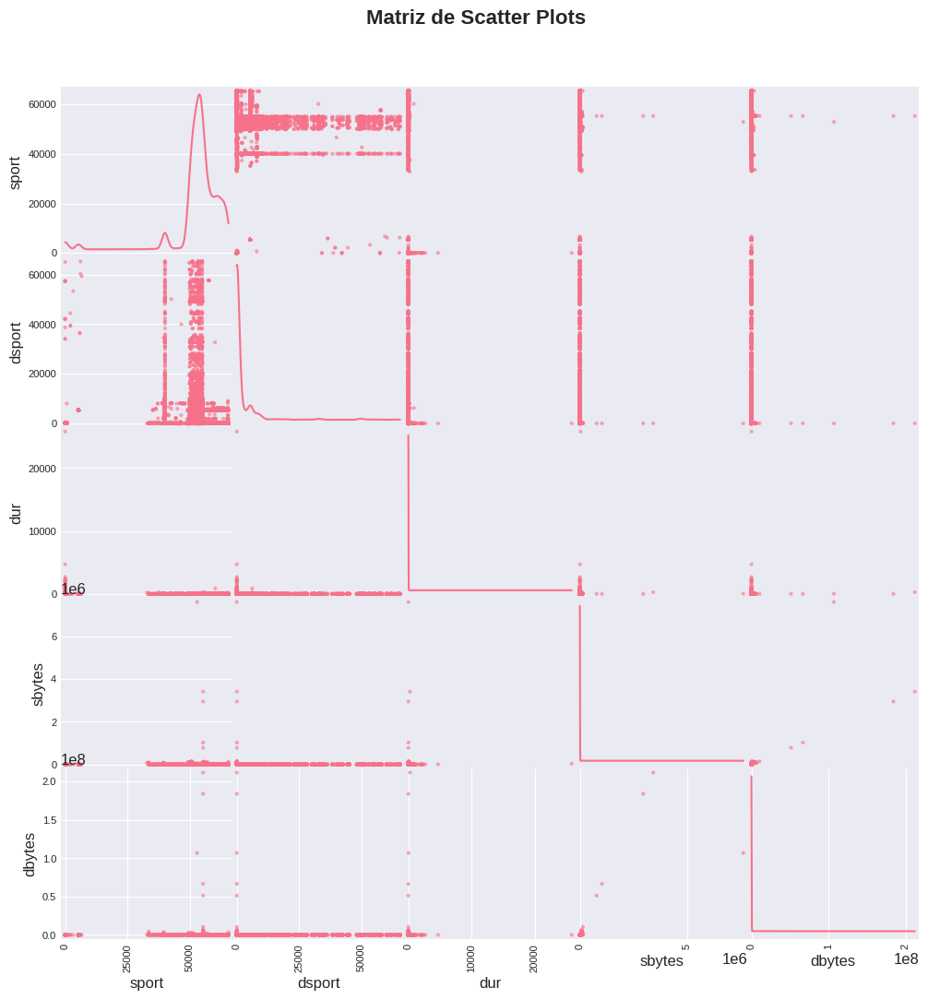

✅ SECUENCIA 2 COMPLETADA: Relaciones entre variables analizadas

▶ SECUENCIA 3: Categóricas vs Numéricas

🔀 SECUENCIA 3: CATEGÓRICAS VS NUMÉRICAS
📊 Variables numéricas: 17
📋 Variables categóricas: 8

1. 📦 BOXPLOTS POR CATEGORÍA
----------------------------------------
Analizando: srcip (categórica) vs sport (numérica)


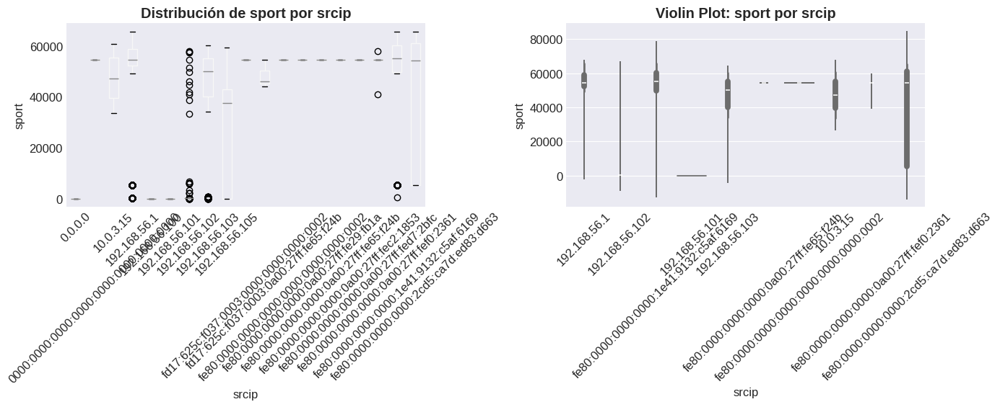


2. 📊 PROMEDIOS POR CATEGORÍA
----------------------------------------


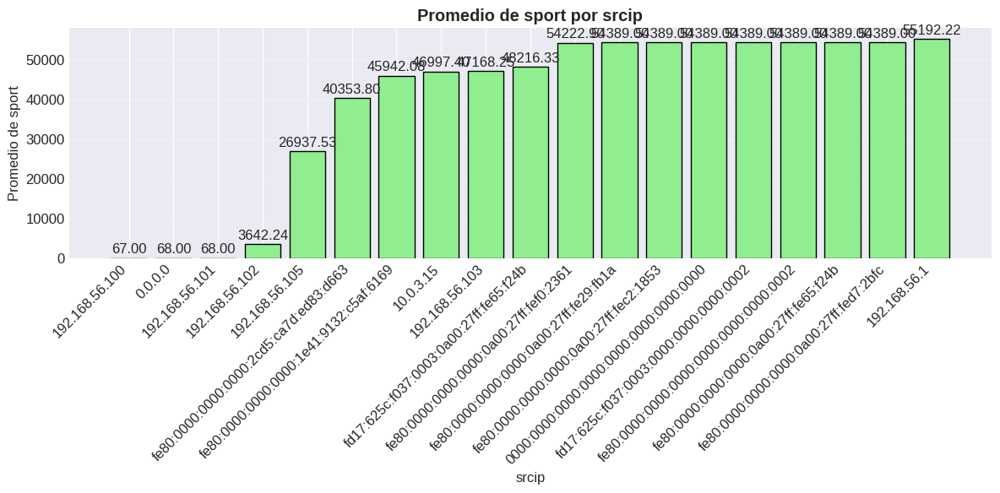


3. 🎨 HEATMAP DE PROMEDIOS (múltiples variables)
----------------------------------------


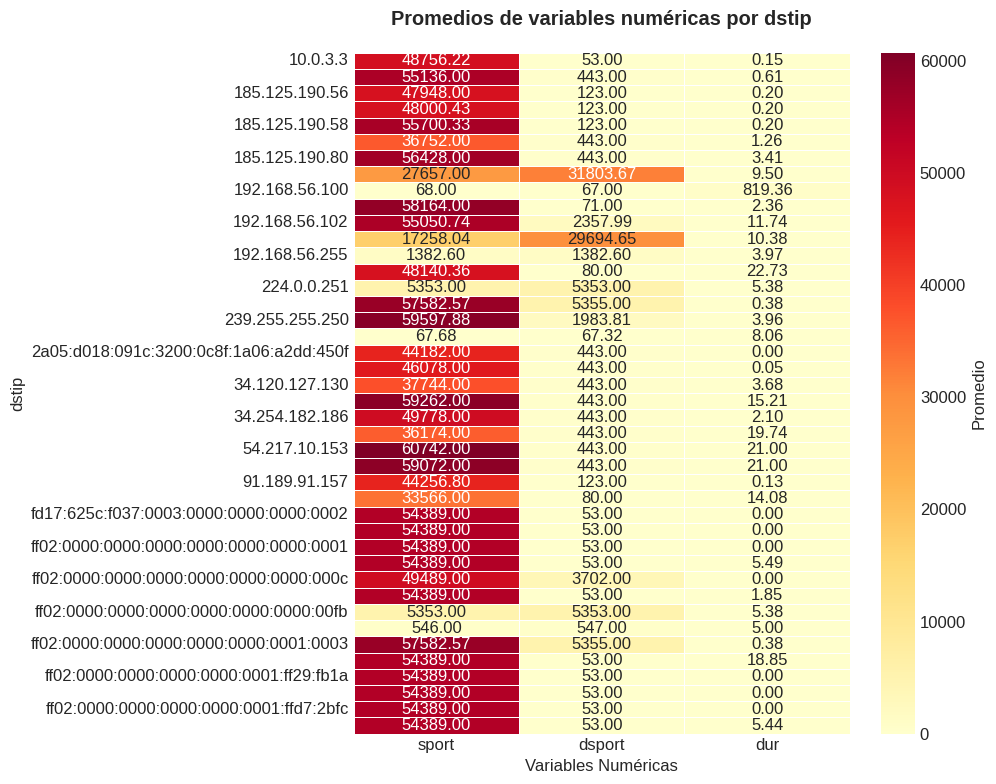


4. 🎨 SCATTER PLOT COLORIDO POR CATEGORÍA
----------------------------------------


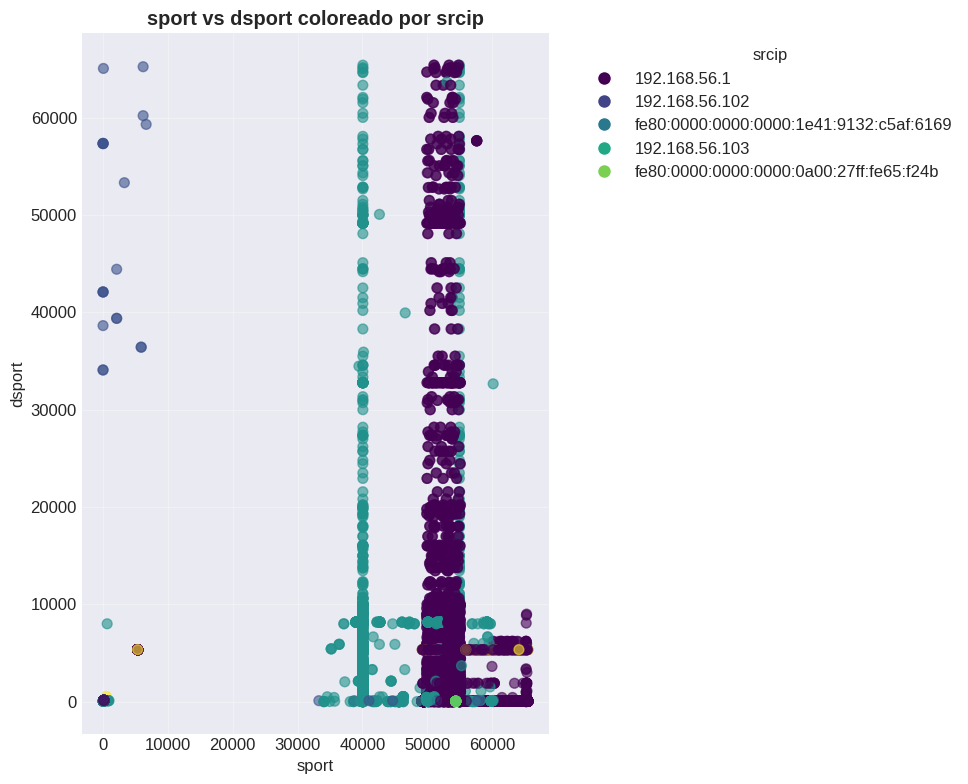

✅ SECUENCIA 3 COMPLETADA: Relaciones categóricas-numéricas analizadas

▶ SECUENCIA 4: Análisis temporal

📅 SECUENCIA 4: ANÁLISIS TEMPORAL
📅 Columnas temporales encontradas: Stime, Ltime

1. ⏱️  CONVIRTIENDO 'Stime' A DATETIME
----------------------------------------
   • Convertidos: 32864 de 32864 registros
   • Rango temporal: 2025-07-30 11:44:23.680332+00:00 a 2025-08-20 19:22:21.953193+00:00

2. 📊 EXTRAYENDO COMPONENTES TEMPORALES
----------------------------------------
   Componentes extraídos: año, mes, día, día de semana, hora

3. 📈 DISTRIBUCIÓN TEMPORAL
----------------------------------------


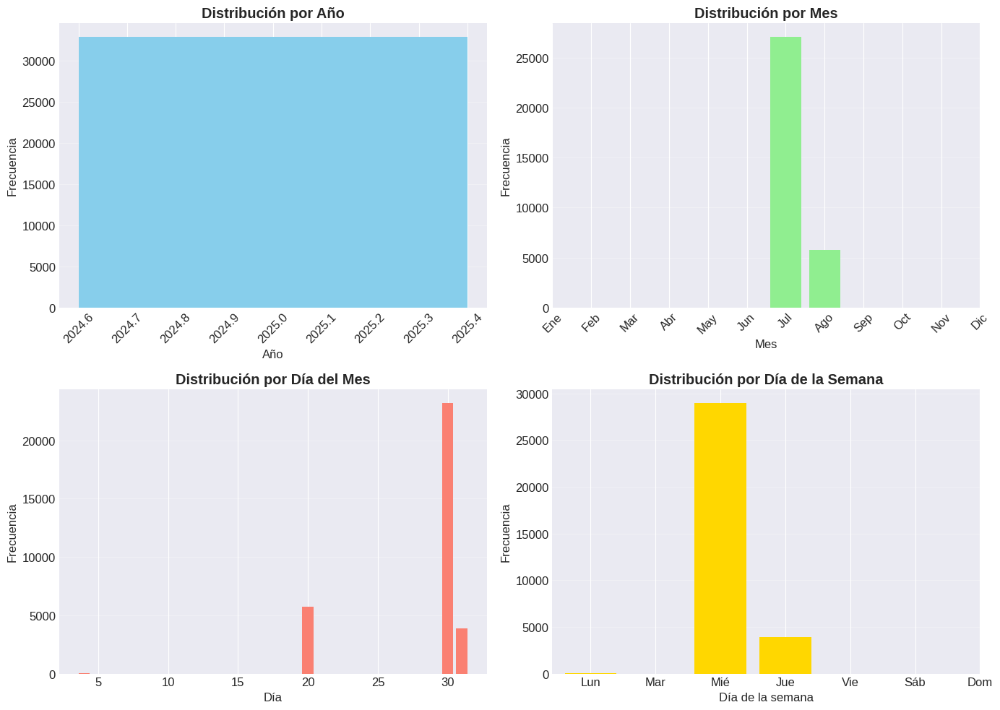


4. 📈 SERIES DE TIEMPO
----------------------------------------


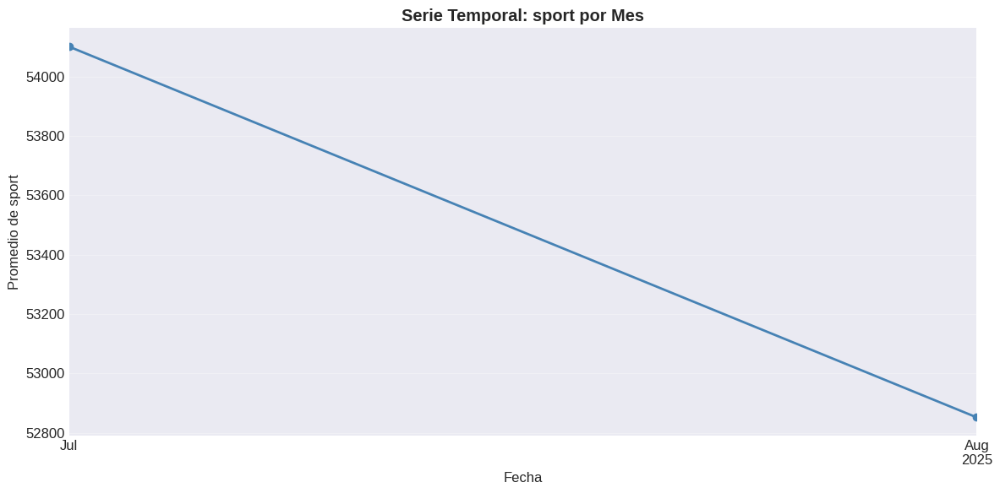


5. 🎨 HEATMAP TEMPORAL (Día vs Hora)
----------------------------------------


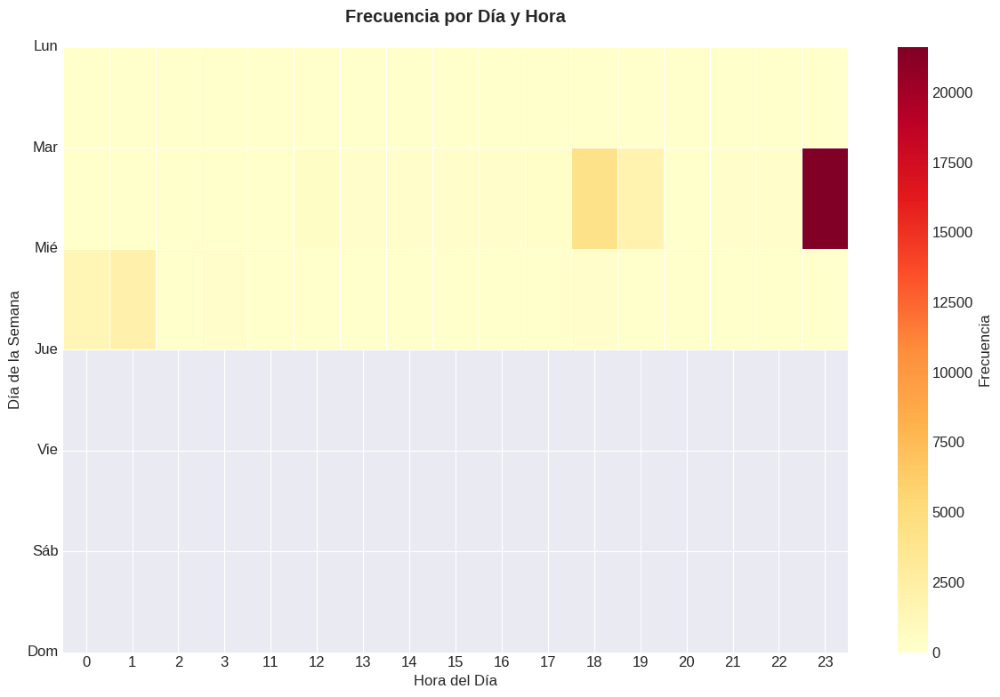

✅ SECUENCIA 4 COMPLETADA: Análisis temporal realizado

▶ SECUENCIA 5: Visualizaciones avanzadas

🎨 SECUENCIA 5: VISUALIZACIONES AVANZADAS

1. 🔄 MATRIZ DE SCATTER PLOTS AVANZADA
----------------------------------------


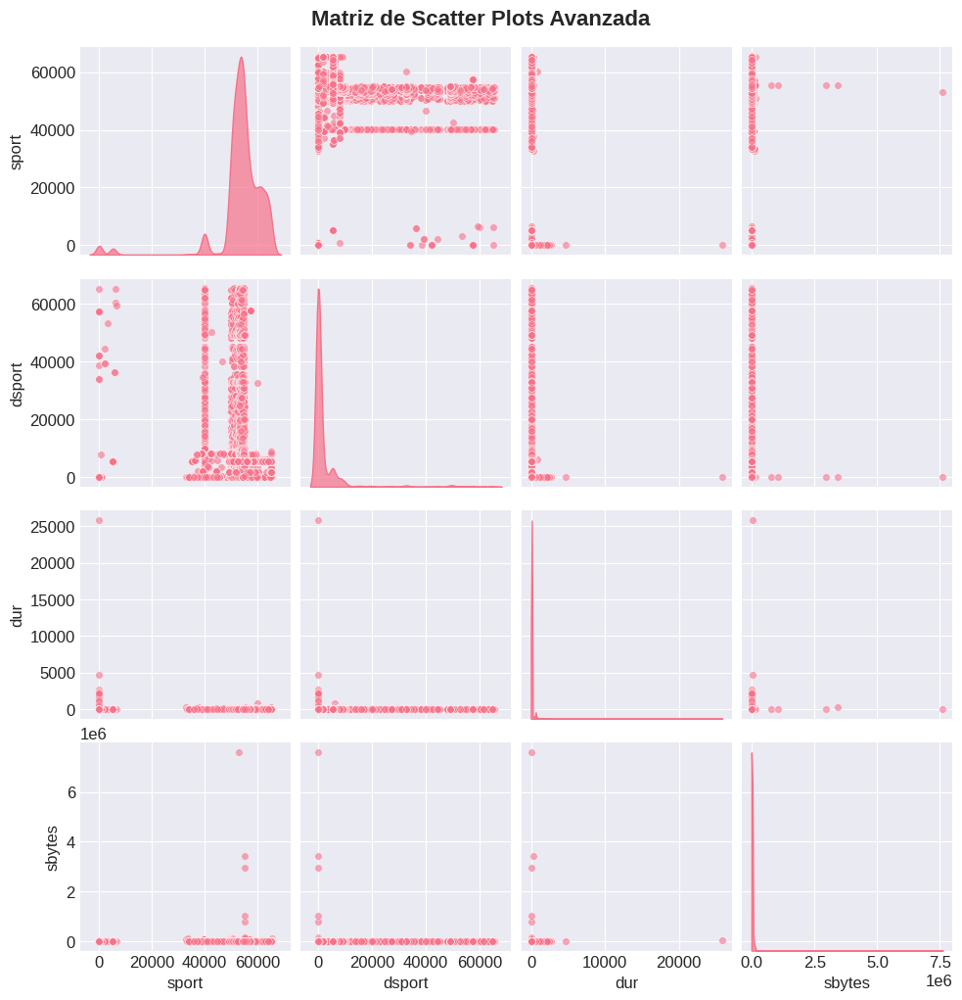


2. 🕷️  GRÁFICO DE RADAR (SPIDER CHART)
----------------------------------------


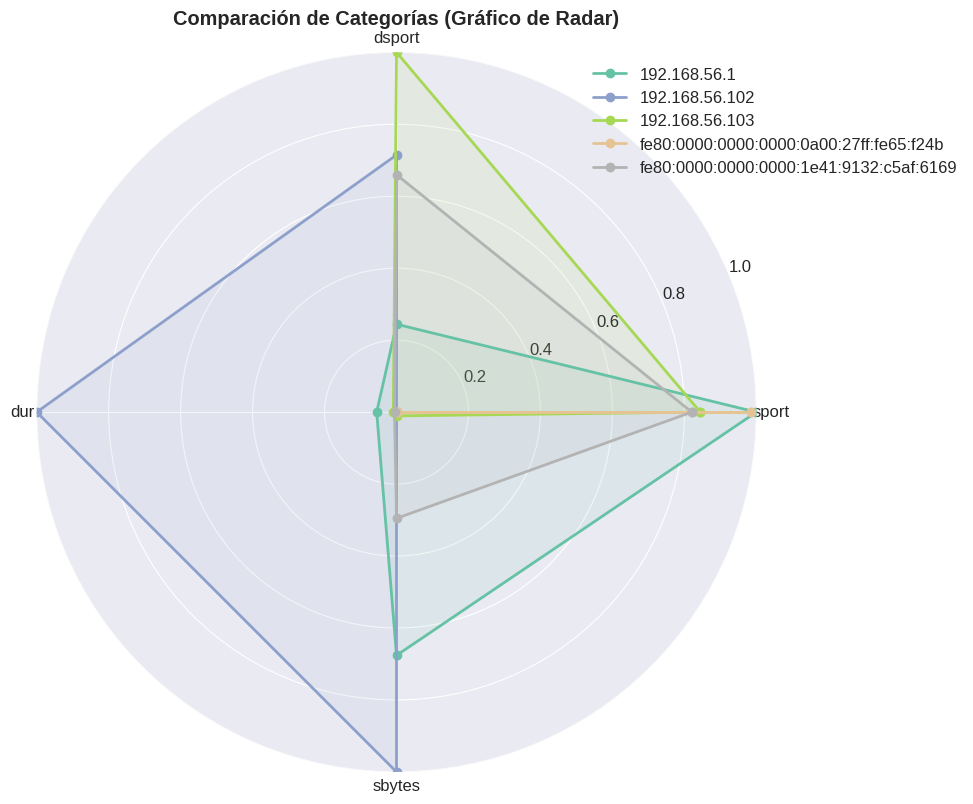


3. 🌳 TREEMAP (Visualización Jerárquica)
----------------------------------------


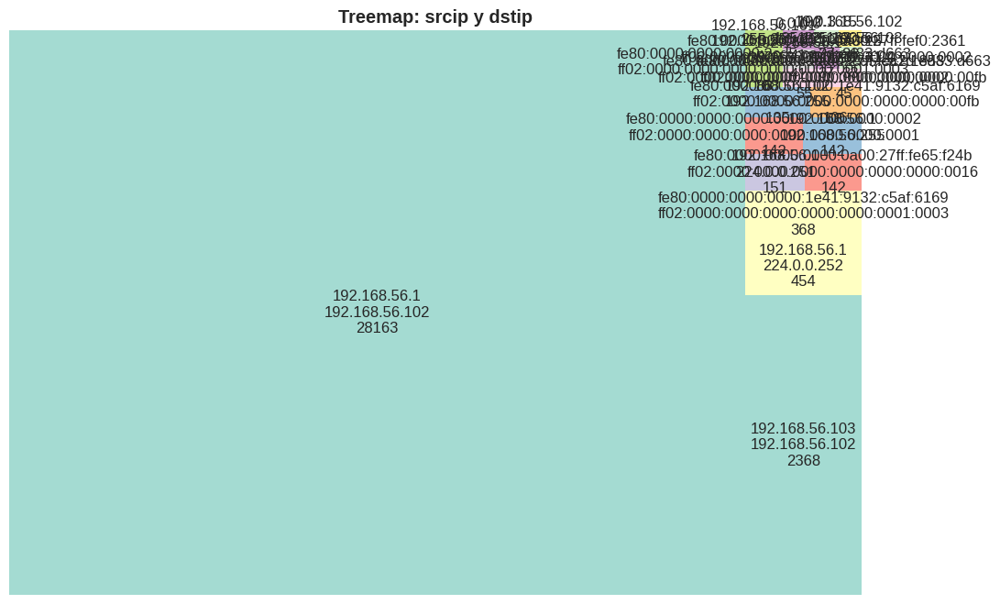


4. 🎻 GRÁFICO DE VIOLÍN AVANZADO
----------------------------------------


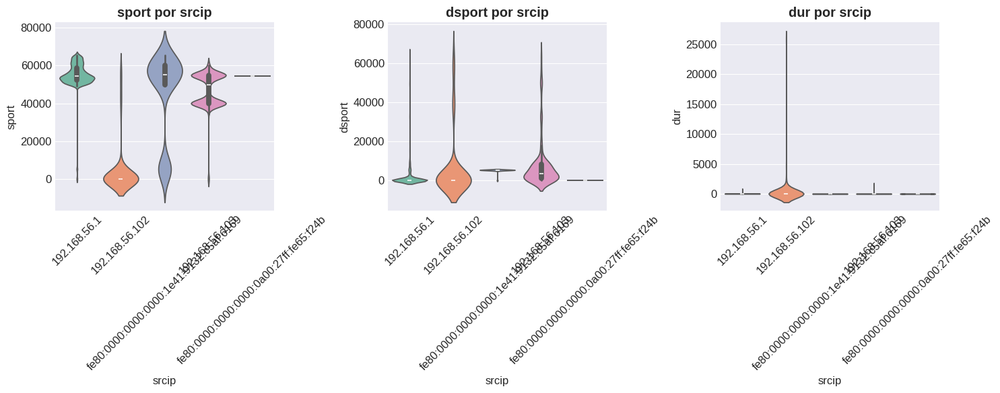


5. 🫧 GRÁFICO DE BURBUJAS (BUBBLE CHART)
----------------------------------------


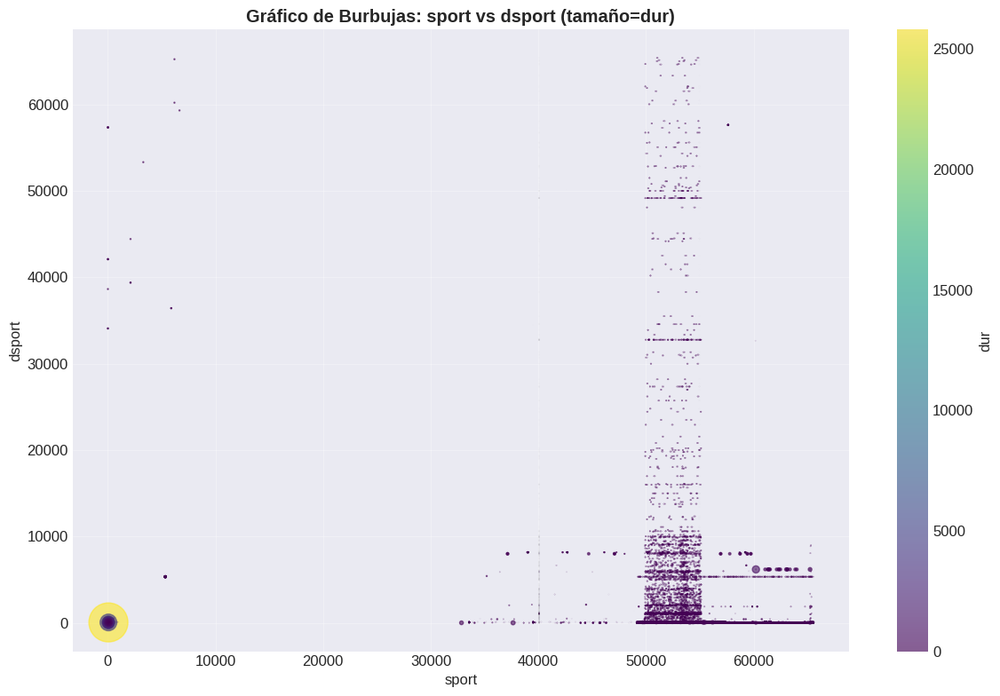

✅ SECUENCIA 5 COMPLETADA: Visualizaciones avanzadas creadas

▶ SECUENCIA 6: Dashboard final

📋 SECUENCIA 6: DASHBOARD Y REPORTE FINAL

1. 🎨 CREANDO DASHBOARD RESUMEN
----------------------------------------


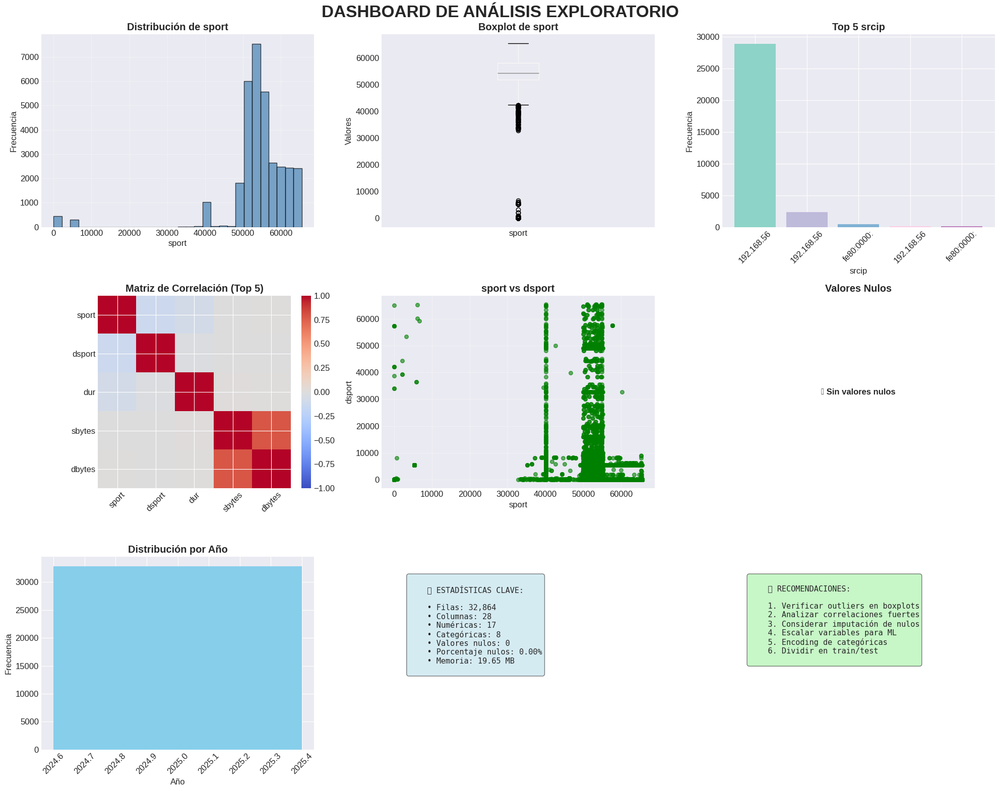


2. 📋 GENERANDO REPORTE FINAL
----------------------------------------
✅ Reporte guardado en: /content/reporte_visualizacion.txt

        REPORTE FINAL DE VISUALIZACIÓN EXPLORATORIA
        
        Fecha de generación: 2026-01-22 01:13:37
        Dataset analizado: 32864 filas × 28 columnas
        
        RESUMEN DE ANÁLISIS:
        • Variables numéricas: 17
        • Variables categóricas: 8
        • Columnas con valores nulos: 0
        • Porcentaje total de nulos: 0.00%
        
        SECUENCIAS EJECUTADAS:
        1. Visualizaciones básicas de distribución ✓
        2. Análisis de correlaciones y relaciones ✓
        3. Categóricas vs Numéricas ✓
        4. Análisis temporal ✓
        5. Visualizaciones avanzadas ✓
        6. Dashboard final ✓
        
        PRÓXIMOS PASOS RECOMENDADOS:
        1. Feature engineering basado en insights
        2. Preparación para modelado (escalado, encoding)
        3. División train/validation/test
        4. Selección de modelo apropiad

In [69]:
def ejecutar_todas_secuencias(df):
    """Ejecutar todas las secuencias en orden"""
    print("🚀 EJECUTANDO TODAS LAS SECUENCIAS DE VISUALIZACIÓN")
    print("="*70)

    resultados = {}

    # Secuencia 1
    print("\n▶ SECUENCIA 1: Visualizaciones básicas")
    resultados['seq1'] = secuencia1_visualizaciones_basicas(df)

    # Secuencia 2
    print("\n▶ SECUENCIA 2: Análisis de correlaciones")
    resultados['seq2'] = secuencia2_analisis_correlaciones(df)

    # Secuencia 3
    print("\n▶ SECUENCIA 3: Categóricas vs Numéricas")
    resultados['seq3'] = secuencia3_categoricas_vs_numericas(df)

    # Secuencia 4
    print("\n▶ SECUENCIA 4: Análisis temporal")
    resultados['seq4'] = secuencia4_analisis_temporal(df)

    # Secuencia 5
    print("\n▶ SECUENCIA 5: Visualizaciones avanzadas")
    resultados['seq5'] = secuencia5_visualizaciones_avanzadas(df)

    # Secuencia 6
    print("\n▶ SECUENCIA 6: Dashboard final")
    resultados['seq6'] = secuencia6_dashboard_final(df)

    print("\n✅ TODAS LAS SECUENCIAS COMPLETADAS EXITOSAMENTE")
    return resultados

# Ejecutar todas las secuencias
if 'df_limpio' in locals():
    todos_resultados = ejecutar_todas_secuencias(df_limpio)

🚀 EJECUTANDO SECUENCIA 1: Preparación de Datos
🔧 SECUENCIA 1: PREPARACIÓN DE DATOS PARA MACHINE LEARNING

1. 🎯 IDENTIFICANDO TIPO DE PROBLEMA
----------------------------------------

📊 PROBLEMA DE CLASIFICACIÓN
   • Variable objetivo: Label
   • Clases: 2
   • Distribución:


,count
Label,
1,27108
0,5756



2. 📊 SEPARANDO FEATURES Y TARGET
----------------------------------------
   • Features (X): (32864, 27)
   • Target (y): (32864,)
   • Columnas en X: ['srcip', 'sport', 'dstip', 'dsport', 'proto', 'state', 'dur', 'sbytes', 'dbytes', 'service', 'Sload', 'Dload', 'Spkts', 'Dpkts', 'smeansz', 'dmeansz', 'trans_depth', 'res_bdy_len', 'Stime', 'Ltime', 'synack', 'is_sm_ips_ports', 'ct_state_ttl', 'service_was_null', 'trans_depth_was_null', 'res_bdy_len_was_null', 'null_count_per_row']

3. 🏷️  TIPOS DE FEATURES IDENTIFICADOS
----------------------------------------
   • Numéricas: 16
     sport, dsport, dur, sbytes, dbytes...
   • Categóricas: 8
     srcip, dstip, proto, state, service...

4. ⚖️  VERIFICANDO BALANCE DE CLASES
----------------------------------------


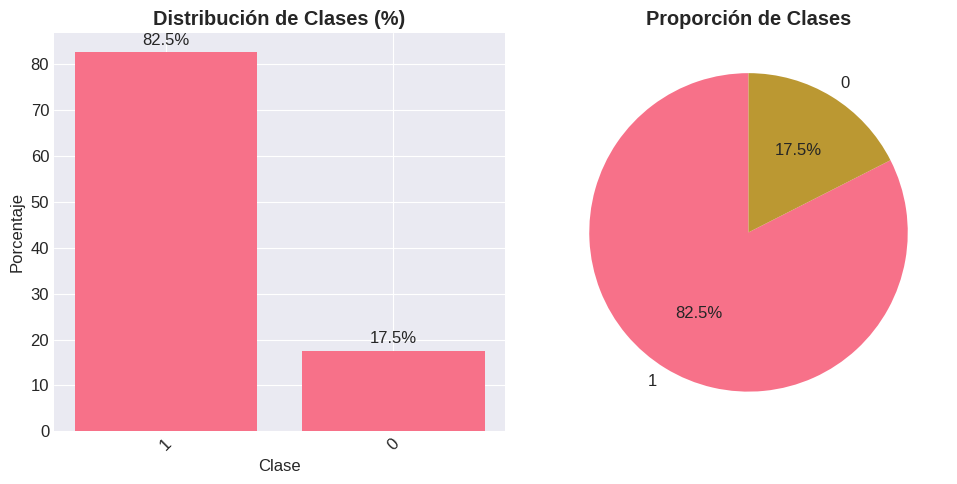

✅ Dataset balanceado


In [74]:
# ============================================
# SECUENCIA 1: PREPARACIÓN DE DATOS PARA ML
# ============================================

def secuencia1_preparacion_datos(df, target_col=None):
    """
    SECUENCIA 1: Preparar datos para Machine Learning
    """
    print("🔧 SECUENCIA 1: PREPARACIÓN DE DATOS PARA MACHINE LEARNING")
    print("="*60)

    # 1.1. Identificar tipo de problema
    print("\n1. 🎯 IDENTIFICANDO TIPO DE PROBLEMA")
    print("-" * 40)

    if target_col is None:
        print("⚠️ No se especificó variable objetivo")
        print("🔍 Buscando columnas que podrían ser target...")

        # Buscar posibles targets
        posibles_targets = []
        for col in df.columns:
            if df[col].nunique() <= 10:  # Pocos valores únicos → clasificación
                posibles_targets.append((col, 'clasificacion', df[col].nunique()))
            elif df[col].dtype in ['int64', 'float64']:  # Numérica continua → regresión
                posibles_targets.append((col, 'regresion', df[col].nunique()))

        print("Posibles variables objetivo encontradas:")
        for col, tipo, n_unicos in posibles_targets[:5]:
            print(f"   • {col}: {tipo} ({n_unicos} valores únicos)")

        if posibles_targets:
            target_col = posibles_targets[0][0]
            print(f"\n✅ Usando '{target_col}' como variable objetivo")
        else:
            print("❌ No se encontró variable objetivo adecuada")
            return None

    # 1.2. Determinar tipo de problema
    unique_values = df[target_col].nunique()

    if unique_values <= 10:
        problem_type = 'classification'
        print(f"\n📊 PROBLEMA DE CLASIFICACIÓN")
        print(f"   • Variable objetivo: {target_col}")
        print(f"   • Clases: {unique_values}")
        print(f"   • Distribución:")
        display(df[target_col].value_counts())
    else:
        problem_type = 'regression'
        print(f"\n📈 PROBLEMA DE REGRESIÓN")
        print(f"   • Variable objetivo: {target_col}")
        print(f"   • Valores únicos: {unique_values}")
        print(f"   • Rango: [{df[target_col].min():.2f}, {df[target_col].max():.2f}]")
        print(f"   • Media: {df[target_col].mean():.2f}")

    # 1.3. Separar features y target
    print("\n2. 📊 SEPARANDO FEATURES Y TARGET")
    print("-" * 40)

    X = df.drop(columns=[target_col])
    y = df[target_col]

    print(f"   • Features (X): {X.shape}")
    print(f"   • Target (y): {y.shape}")
    print(f"   • Columnas en X: {list(X.columns)}")

    # 1.4. Identificar tipos de features
    numeric_features = X.select_dtypes(include=['int64', 'float64']).columns.tolist()
    categorical_features = X.select_dtypes(include=['object', 'category']).columns.tolist()

    print(f"\n3. 🏷️  TIPOS DE FEATURES IDENTIFICADOS")
    print("-" * 40)
    print(f"   • Numéricas: {len(numeric_features)}")
    if numeric_features:
        print(f"     {', '.join(numeric_features[:5])}{'...' if len(numeric_features) > 5 else ''}")

    print(f"   • Categóricas: {len(categorical_features)}")
    if categorical_features:
        print(f"     {', '.join(categorical_features[:5])}{'...' if len(categorical_features) > 5 else ''}")

    # 1.5. Verificar balance de clases (si es clasificación)
    if problem_type == 'classification':
        print("\n4. ⚖️  VERIFICANDO BALANCE DE CLASES")
        print("-" * 40)

        class_distribution = y.value_counts(normalize=True) * 100

        plt.figure(figsize=(10, 5))

        # Gráfico de barras
        plt.subplot(1, 2, 1)
        bars = plt.bar(class_distribution.index.astype(str), class_distribution.values)
        plt.title('Distribución de Clases (%)', fontweight='bold')
        plt.xlabel('Clase')
        plt.ylabel('Porcentaje')
        plt.xticks(rotation=45)

        # Añadir valores
        for bar in bars:
            height = bar.get_height()
            plt.text(bar.get_x() + bar.get_width()/2., height + 1,
                    f'{height:.1f}%', ha='center', va='bottom')

        # Gráfico de torta
        plt.subplot(1, 2, 2)
        plt.pie(class_distribution.values, labels=class_distribution.index.astype(str),
                autopct='%1.1f%%', startangle=90)
        plt.title('Proporción de Clases', fontweight='bold')

        plt.tight_layout()
        plt.show()

        # Verificar si hay desbalance
        min_percent = class_distribution.min()
        max_percent = class_distribution.max()

        if max_percent / min_percent > 10:  # Más de 10:1 es desbalanceado
            print(f"⚠️  ALERTA: Dataset DESBALANCEADO")
            print(f"   • Clase mayoritaria: {max_percent:.1f}%")
            print(f"   • Clase minoritaria: {min_percent:.1f}%")
            print(f"   • Ratio: {max_percent/min_percent:.1f}:1")
        else:
            print("✅ Dataset balanceado")

    return X, y, problem_type, numeric_features, categorical_features

# EJECUTAR SECUENCIA 1
print("🚀 EJECUTANDO SECUENCIA 1: Preparación de Datos")
if 'df_limpio' in locals():
    # Especifica tu variable objetivo aquí
    target_column = "Label"  # Cambia esto por tu columna objetivo

    if target_column in df_limpio.columns:
        X, y, problem_type, num_feats, cat_feats = secuencia1_preparacion_datos(
            df_limpio, target_column
        )
    else:
        print(f"⚠️ La columna '{target_column}' no existe en el dataset")
        print("Columnas disponibles:")
        print(df_limpio.columns.tolist())
else:
    print("⚠️ Primero carga tu dataset como 'df_limpio'")

In [75]:
# ============================================
# SECUENCIA 2: PREPROCESAMIENTO Y FEATURE ENGINEERING
# ============================================

def secuencia2_preprocesamiento(X, y, numeric_features, categorical_features,
                               problem_type='classification'):
    """
    SECUENCIA 2: Preprocesamiento y feature engineering
    """
    print("\n" + "="*60)
    print("🔧 SECUENCIA 2: PREPROCESAMIENTO Y FEATURE ENGINEERING")
    print("="*60)

    from sklearn.model_selection import train_test_split
    from sklearn.preprocessing import StandardScaler, OneHotEncoder, LabelEncoder
    from sklearn.impute import SimpleImputer
    from sklearn.compose import ColumnTransformer
    from sklearn.pipeline import Pipeline

    # 2.1. Dividir datos en train y test
    print("\n1. 📊 DIVIDIENDO DATOS EN TRAIN Y TEST")
    print("-" * 40)

    X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=0.2, random_state=42,
        stratify=y if problem_type == 'classification' else None
    )

    print(f"   • Train: {X_train.shape} (features), {y_train.shape} (target)")
    print(f"   • Test:  {X_test.shape} (features), {y_test.shape} (target)")
    print(f"   • Proporción: 80% train, 20% test")

    # 2.2. Crear pipelines de preprocesamiento
    print("\n2. ⚙️  CREANDO PIPELINES DE PREPROCESAMIENTO")
    print("-" * 40)

    # Pipeline para variables numéricas
    numeric_transformer = Pipeline(steps=[
        ('imputer', SimpleImputer(strategy='median')),
        ('scaler', StandardScaler())
    ])

    # Pipeline para variables categóricas
    categorical_transformer = Pipeline(steps=[
        ('imputer', SimpleImputer(strategy='constant', fill_value='missing')),
        ('onehot', OneHotEncoder(handle_unknown='ignore', sparse_output=False))
    ])

    # Combinar transformadores
    preprocessor = ColumnTransformer(
        transformers=[
            ('num', numeric_transformer, numeric_features),
            ('cat', categorical_transformer, categorical_features)
        ])

    print(f"✅ Preprocesador creado con:")
    print(f"   • Transformador numérico: Imputación (mediana) + Escalado")
    print(f"   • Transformador categórico: Imputación + One-Hot Encoding")

    # 2.3. Aplicar preprocesamiento
    print("\n3. 🔄 APLICANDO PREPROCESAMIENTO")
    print("-" * 40)

    print("Transformando datos de entrenamiento...")
    X_train_processed = preprocessor.fit_transform(X_train)

    print("Transformando datos de prueba...")
    X_test_processed = preprocessor.transform(X_test)

    # Obtener nombres de features después del encoding
    if categorical_features:
        # Obtener nombres de las columnas one-hot
        ohe = preprocessor.named_transformers_['cat'].named_steps['onehot']
        cat_feature_names = ohe.get_feature_names_out(categorical_features)
    else:
        cat_feature_names = []

    all_feature_names = list(numeric_features) + list(cat_feature_names)

    print(f"✅ Datos transformados:")
    print(f"   • X_train procesado: {X_train_processed.shape}")
    print(f"   • X_test procesado:  {X_test_processed.shape}")
    print(f"   • Total features: {len(all_feature_names)}")

    # 2.4. Codificar target si es clasificación
    if problem_type == 'classification' and y.dtype == 'object':
        print("\n4. 🔤 CODIFICANDO VARIABLE TARGET")
        print("-" * 40)

        label_encoder = LabelEncoder()
        y_train_encoded = label_encoder.fit_transform(y_train)
        y_test_encoded = label_encoder.transform(y_test)

        print(f"✅ Target codificado:")
        print(f"   • Clases: {label_encoder.classes_}")
        print(f"   • Mapeo: {dict(zip(label_encoder.classes_, range(len(label_encoder.classes_))))}")

        y_train = y_train_encoded
        y_test = y_test_encoded

    # 2.5. Feature engineering básico
    print("\n5. 🛠️  FEATURE ENGINEERING BÁSICO")
    print("-" * 40)

    # Crear copias para feature engineering
    X_train_fe = X_train.copy()
    X_test_fe = X_test.copy()

    nuevas_features = []

    # Interacciones entre variables numéricas
    if len(numeric_features) >= 2:
        print("Creando interacciones numéricas...")

        # Producto de las dos primeras variables numéricas
        feat1, feat2 = numeric_features[0], numeric_features[1]
        X_train_fe[f'{feat1}_x_{feat2}'] = X_train[feat1] * X_train[feat2]
        X_test_fe[f'{feat1}_x_{feat2}'] = X_test[feat1] * X_test[feat2]
        nuevas_features.append(f'{feat1}_x_{feat2}')

        # Ratio de las dos primeras variables
        X_train_fe[f'{feat1}_div_{feat2}'] = X_train[feat1] / (X_train[feat2] + 1e-10)
        X_test_fe[f'{feat1}_div_{feat2}'] = X_test[feat1] / (X_test[feat2] + 1e-10)
        nuevas_features.append(f'{feat1}_div_{feat2}')

    # Features polinómicas
    if len(numeric_features) >= 1:
        print("Creando features polinómicas...")

        feat = numeric_features[0]
        X_train_fe[f'{feat}_squared'] = X_train[feat] ** 2
        X_test_fe[f'{feat}_squared'] = X_test[feat] ** 2
        nuevas_features.append(f'{feat}_squared')

        X_train_fe[f'{feat}_log'] = np.log1p(np.abs(X_train[feat]))
        X_test_fe[f'{feat}_log'] = np.log1p(np.abs(X_test[feat]))
        nuevas_features.append(f'{feat}_log')

    if nuevas_features:
        print(f"✅ Nuevas features creadas: {', '.join(nuevas_features)}")
        print(f"   • Features totales ahora: {X_train_fe.shape[1]}")

    return {
        'X_train': X_train,
        'X_test': X_test,
        'y_train': y_train,
        'y_test': y_test,
        'X_train_processed': X_train_processed,
        'X_test_processed': X_test_processed,
        'preprocessor': preprocessor,
        'feature_names': all_feature_names,
        'X_train_fe': X_train_fe,
        'X_test_fe': X_test_fe,
        'nuevas_features': nuevas_features
    }

# EJECUTAR SECUENCIA 2
print("\n🚀 EJECUTANDO SECUENCIA 2: Preprocesamiento")
if all(var in locals() for var in ['X', 'y', 'num_feats', 'cat_feats', 'problem_type']):
    datos_procesados = secuencia2_preprocesamiento(
        X, y, num_feats, cat_feats, problem_type
    )
else:
    print("⚠️ Primero ejecuta la Secuencia 1")


🚀 EJECUTANDO SECUENCIA 2: Preprocesamiento
⚠️ Primero ejecuta la Secuencia 1


In [77]:
# ============================================
# SECUENCIA 3: MODELOS BÁSICOS DE ML
# ============================================

def secuencia3_modelos_basicos(datos_procesados, problem_type='classification'):
    """
    SECUENCIA 3: Entrenar y evaluar modelos básicos de ML
    """
    print("\n" + "="*60)
    print("🤖 SECUENCIA 3: MODELOS BÁSICOS DE MACHINE LEARNING")
    print("="*60)

    from sklearn.linear_model import LogisticRegression, LinearRegression
    from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor
    from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor
    from sklearn.svm import SVC, SVR
    from sklearn.neighbors import KNeighborsClassifier, KNeighborsRegressor
    from sklearn.metrics import (accuracy_score, precision_score, recall_score, f1_score,
                                confusion_matrix, classification_report,
                                mean_squared_error, mean_absolute_error, r2_score)
    from sklearn.model_selection import cross_val_score
    import warnings
    warnings.filterwarnings('ignore')

    # Extraer datos procesados
    X_train = datos_procesados['X_train_processed']
    X_test = datos_procesados['X_test_processed']
    y_train = datos_procesados['y_train']
    y_test = datos_procesados['y_test']

    # 3.1. Definir modelos según tipo de problema
    print("\n1. 🎯 DEFINICIÓN DE MODELOS")
    print("-" * 40)

    if problem_type == 'classification':
        print("📊 Modelos de CLASIFICACIÓN:")
        models = {
            'Logistic Regression': LogisticRegression(max_iter=1000, random_state=42),
            'Decision Tree': DecisionTreeClassifier(random_state=42),
            'Random Forest': RandomForestClassifier(n_estimators=100, random_state=42),
            'K-Nearest Neighbors': KNeighborsClassifier(),
            'SVM': SVC(random_state=42)
        }
    else:  # regression
        print("📈 Modelos de REGRESIÓN:")
        models = {
            'Linear Regression': LinearRegression(),
            'Decision Tree': DecisionTreeRegressor(random_state=42),
            'Random Forest': RandomForestRegressor(n_estimators=100, random_state=42),
            'K-Nearest Neighbors': KNeighborsRegressor(),
            'SVM': SVR()
        }

    for name, model in models.items():
        print(f"   • {name}")

    # 3.2. Entrenar y evaluar modelos
    print(f"\n2. 🏃 ENTRENANDO {len(models)} MODELOS")
    print("-" * 40)

    results = {}

    for name, model in models.items():
        print(f"\n🔍 Modelo: {name}")

        # Entrenar modelo
        model.fit(X_train, y_train)

        # Predecir
        y_pred = model.predict(X_test)

        # Evaluar según tipo de problema
        if problem_type == 'classification':
            # Métricas de clasificación
            accuracy = accuracy_score(y_test, y_pred)
            precision = precision_score(y_test, y_pred, average='weighted')
            recall = recall_score(y_test, y_pred, average='weighted')
            f1 = f1_score(y_test, y_pred, average='weighted')

            # Cross validation
            cv_scores = cross_val_score(model, X_train, y_train, cv=5, scoring='accuracy')

            results[name] = {
                'model': model,
                'accuracy': accuracy,
                'precision': precision,
                'recall': recall,
                'f1': f1,
                'cv_mean': cv_scores.mean(),
                'cv_std': cv_scores.std()
            }

            print(f"   ✅ Accuracy: {accuracy:.4f}")
            print(f"   📊 CV Accuracy: {cv_scores.mean():.4f} (±{cv_scores.std():.4f})")

        else:  # regression
            # Métricas de regresión
            mse = mean_squared_error(y_test, y_pred)
            mae = mean_absolute_error(y_test, y_pred)
            r2 = r2_score(y_test, y_pred)

            # Cross validation
            cv_scores = cross_val_score(model, X_train, y_train, cv=5, scoring='r2')

            results[name] = {
                'model': model,
                'mse': mse,
                'rmse': np.sqrt(mse),
                'mae': mae,
                'r2': r2,
                'cv_mean': cv_scores.mean(),
                'cv_std': cv_scores.std()
            }

            print(f"   ✅ R² Score: {r2:.4f}")
            print(f"   📊 RMSE: {np.sqrt(mse):.4f}")
            print(f"   📈 CV R²: {cv_scores.mean():.4f} (±{cv_scores.std():.4f})")

    # 3.3. Comparar resultados
    print(f"\n3. 🏆 COMPARACIÓN DE MODELOS")
    print("-" * 40)

    if problem_type == 'classification':
        # Crear DataFrame de resultados
        results_df = pd.DataFrame({
            'Modelo': list(results.keys()),
            'Accuracy': [results[m]['accuracy'] for m in results],
            'Precision': [results[m]['precision'] for m in results],
            'Recall': [results[m]['recall'] for m in results],
            'F1-Score': [results[m]['f1'] for m in results],
            'CV Accuracy': [results[m]['cv_mean'] for m in results],
            'CV Std': [results[m]['cv_std'] for m in results]
        }).sort_values('Accuracy', ascending=False)

        display(results_df)

        # Gráfico de comparación
        plt.figure(figsize=(12, 6))

        x = range(len(results_df))
        width = 0.35

        plt.bar(x, results_df['Accuracy'], width, label='Accuracy', alpha=0.8)
        plt.bar([i + width for i in x], results_df['CV Accuracy'], width,
               label='CV Accuracy', alpha=0.8)

        plt.xlabel('Modelos')
        plt.ylabel('Accuracy')
        plt.title('Comparación de Accuracy entre Modelos', fontweight='bold')
        plt.xticks([i + width/2 for i in x], results_df['Modelo'], rotation=45)
        plt.legend()
        plt.grid(True, alpha=0.3, axis='y')
        plt.tight_layout()
        plt.show()

    else:  # regression
        # Crear DataFrame de resultados
        results_df = pd.DataFrame({
            'Modelo': list(results.keys()),
            'R² Score': [results[m]['r2'] for m in results],
            'RMSE': [results[m]['rmse'] for m in results],
            'MAE': [results[m]['mae'] for m in results],
            'CV R²': [results[m]['cv_mean'] for m in results],
            'CV Std': [results[m]['cv_std'] for m in results]
        }).sort_values('R² Score', ascending=False)

        display(results_df)

        # Gráfico de comparación
        plt.figure(figsize=(12, 6))

        x = range(len(results_df))

        plt.bar(x, results_df['R² Score'], alpha=0.7, label='R² Score')

        plt.xlabel('Modelos')
        plt.ylabel('R² Score')
        plt.title('Comparación de R² Score entre Modelos', fontweight='bold')
        plt.xticks(x, results_df['Modelo'], rotation=45)
        plt.axhline(y=0, color='r', linestyle='-', alpha=0.3)
        plt.legend()
        plt.grid(True, alpha=0.3, axis='y')
        plt.tight_layout()
        plt.show()

    # 3.4. Seleccionar mejor modelo
    print("\n4. 🎯 SELECCIONANDO MEJOR MODELO")
    print("-" * 40)

    if problem_type == 'classification':
        best_model_name = results_df.iloc[0]['Modelo']
        metric = 'Accuracy'
        best_score = results_df.iloc[0]['Accuracy']
    else:
        best_model_name = results_df.iloc[0]['Modelo']
        metric = 'R² Score'
        best_score = results_df.iloc[0]['R² Score']

    best_model = results[best_model_name]['model']

    print(f"🏆 MEJOR MODELO: {best_model_name}")
    print(f"📈 {metric}: {best_score:.4f}")

    # 3.5. Evaluación detallada del mejor modelo
    print(f"\n5. 🔍 EVALUACIÓN DETALLADA DEL MEJOR MODELO")
    print("-" * 40)

    # Predecir con el mejor modelo
    y_pred_best = best_model.predict(X_test)

    if problem_type == 'classification':
        # Matriz de confusión
        print("📊 MATRIZ DE CONFUSIÓN:")
        cm = confusion_matrix(y_test, y_pred_best)

        plt.figure(figsize=(8, 6))
        sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
        plt.title(f'Matriz de Confusión - {best_model_name}', fontweight='bold')
        plt.ylabel('Verdadero')
        plt.xlabel('Predicho')
        plt.show()

        # Reporte de clasificación
        print("\n📋 REPORTE DE CLASIFICACIÓN:")
        print(classification_report(y_test, y_pred_best))

    else:  # regression
        # Gráfico de predicciones vs valores reales
        print("📈 PREDICCIONES VS VALORES REALES:")

        plt.figure(figsize=(10, 6))
        plt.scatter(y_test, y_pred_best, alpha=0.6)

        # Línea de perfecta predicción
        max_val = max(y_test.max(), y_pred_best.max())
        min_val = min(y_test.min(), y_pred_best.min())
        plt.plot([min_val, max_val], [min_val, max_val], 'r--', label='Predicción Perfecta')

        plt.xlabel('Valores Reales')
        plt.ylabel('Predicciones')
        plt.title(f'Predicciones vs Reales - {best_model_name}', fontweight='bold')
        plt.legend()
        plt.grid(True, alpha=0.3)
        plt.tight_layout()
        plt.show()

        # Residual plot
        print("\n📉 GRÁFICO DE RESIDUALES:")

        residuals = y_test - y_pred_best

        plt.figure(figsize=(10, 6))
        plt.scatter(y_pred_best, residuals, alpha=0.6)
        plt.axhline(y=0, color='r', linestyle='--')
        plt.xlabel('Predicciones')
        plt.ylabel('Residuales')
        plt.title(f'Residual Plot - {best_model_name}', fontweight='bold')
        plt.grid(True, alpha=0.3)
        plt.tight_layout()
        plt.show()

    return {
        'results': results,
        'results_df': results_df,
        'best_model': best_model,
        'best_model_name': best_model_name,
        'y_pred_best': y_pred_best
    }

# EJECUTAR SECUENCIA 3
print("\n🚀 EJECUTANDO SECUENCIA 3: Modelos Básicos")
if 'datos_procesados' in locals() and 'problem_type' in locals():
    resultados_modelos = secuencia3_modelos_basicos(datos_procesados, problem_type)
else:
    print("⚠️ Primero ejecuta las Secuencias 1 y 2")


🚀 EJECUTANDO SECUENCIA 3: Modelos Básicos
⚠️ Primero ejecuta las Secuencias 1 y 2


🚀 INICIANDO PIPELINE COMPLETO DE MACHINE LEARNING
✅ Dataset cargado: (32864, 28)

🎯 PASO 0: CONFIGURACIÓN INICIAL
----------------------------------------
✅ Variable objetivo configurada: 'Label'

🔧 EJECUTANDO SECUENCIA 1: PREPARACIÓN DE DATOS
🔧 SECUENCIA 1: PREPARACIÓN DE DATOS PARA MACHINE LEARNING

1. 🎯 IDENTIFICANDO TIPO DE PROBLEMA
----------------------------------------

📊 PROBLEMA DE CLASIFICACIÓN
   • Variable objetivo: Label
   • Clases: 2
   • Distribución:


,count
Label,
1,27108
0,5756



2. 📊 SEPARANDO FEATURES Y TARGET
----------------------------------------
   • Features (X): (32864, 27)
   • Target (y): (32864,)
   • Columnas en X: ['srcip', 'sport', 'dstip', 'dsport', 'proto', 'state', 'dur', 'sbytes', 'dbytes', 'service', 'Sload', 'Dload', 'Spkts', 'Dpkts', 'smeansz', 'dmeansz', 'trans_depth', 'res_bdy_len', 'Stime', 'Ltime', 'synack', 'is_sm_ips_ports', 'ct_state_ttl', 'service_was_null', 'trans_depth_was_null', 'res_bdy_len_was_null', 'null_count_per_row']

3. 🏷️  TIPOS DE FEATURES IDENTIFICADOS
----------------------------------------
   • Numéricas: 16
     sport, dsport, dur, sbytes, dbytes...
   • Categóricas: 8
     srcip, dstip, proto, state, service...

4. ⚖️  VERIFICANDO BALANCE DE CLASES
----------------------------------------


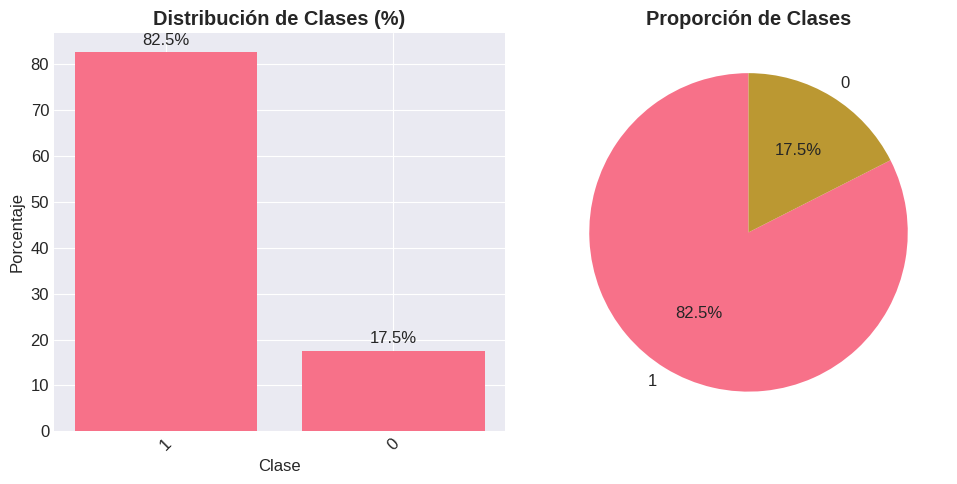

✅ Dataset balanceado

✅ SECUENCIA 1 COMPLETADA
   • Tipo de problema: classification
   • Features: 27
   • Muestras: 32864

🔧 EJECUTANDO SECUENCIA 2: PREPROCESAMIENTO

🔧 SECUENCIA 2: PREPROCESAMIENTO Y FEATURE ENGINEERING

1. 📊 DIVIDIENDO DATOS EN TRAIN Y TEST
----------------------------------------
   • Train: (26291, 27) (features), (26291,) (target)
   • Test:  (6573, 27) (features), (6573,) (target)
   • Proporción: 80% train, 20% test

2. ⚙️  CREANDO PIPELINES DE PREPROCESAMIENTO
----------------------------------------
✅ Preprocesador creado con:
   • Transformador numérico: Imputación (mediana) + Escalado
   • Transformador categórico: Imputación + One-Hot Encoding

3. 🔄 APLICANDO PREPROCESAMIENTO
----------------------------------------
Transformando datos de entrenamiento...
Transformando datos de prueba...
✅ Datos transformados:
   • X_train procesado: (26291, 150)
   • X_test procesado:  (6573, 150)
   • Total features: 150

5. 🛠️  FEATURE ENGINEERING BÁSICO
--------------

,Modelo,Accuracy,Precision,Recall,F1-Score,CV Accuracy,CV Std
1,Decision Tree,0.992545,0.992531,0.992545,0.992536,0.990795,0.001353
4,SVM,0.992393,0.992402,0.992393,0.992345,0.991822,0.000850
3,K-Nearest Neighbors,0.992393,0.992374,0.992393,0.992364,0.992013,0.001048
2,Random Forest,0.991632,0.991607,0.991632,0.991611,0.992051,0.000569
0,Logistic Regression,0.988894,0.988861,0.988894,0.988873,0.988513,0.000631


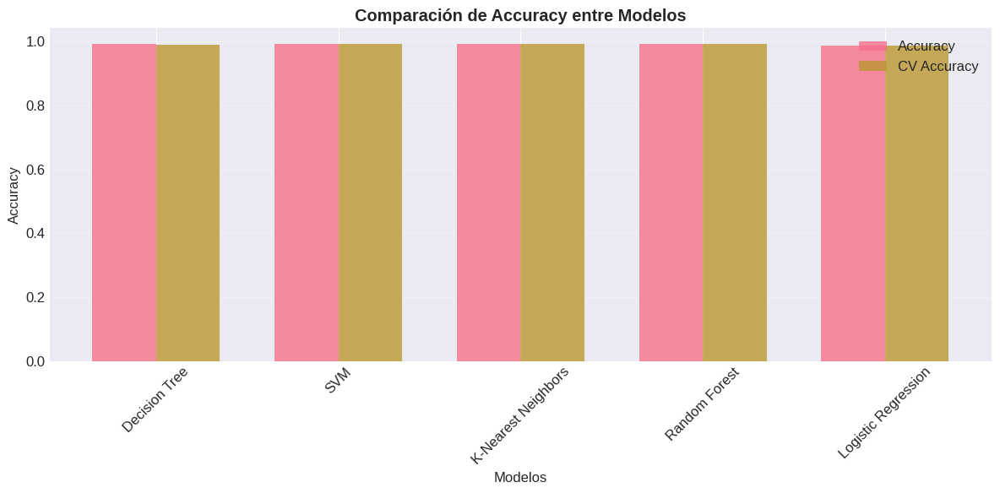


4. 🎯 SELECCIONANDO MEJOR MODELO
----------------------------------------
🏆 MEJOR MODELO: Decision Tree
📈 Accuracy: 0.9925

5. 🔍 EVALUACIÓN DETALLADA DEL MEJOR MODELO
----------------------------------------
📊 MATRIZ DE CONFUSIÓN:


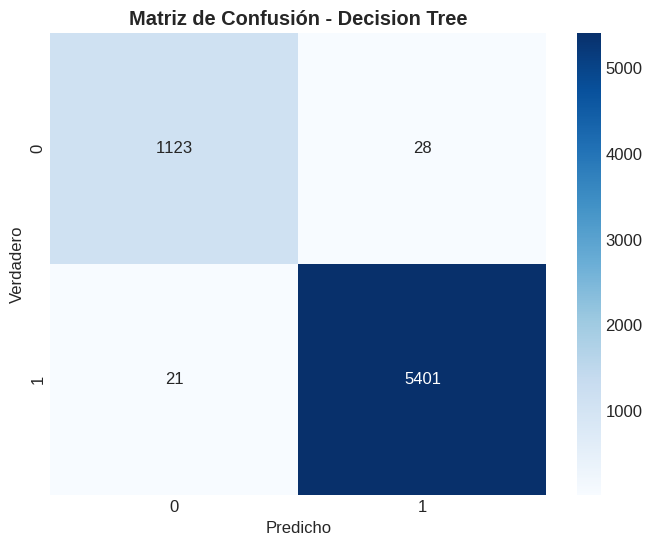


📋 REPORTE DE CLASIFICACIÓN:
              precision    recall  f1-score   support

           0       0.98      0.98      0.98      1151
           1       0.99      1.00      1.00      5422

    accuracy                           0.99      6573
   macro avg       0.99      0.99      0.99      6573
weighted avg       0.99      0.99      0.99      6573


✅ SECUENCIA 3 COMPLETADA
   • Modelo ganador: Decision Tree

⚙️  EJECUTANDO SECUENCIA 4: OPTIMIZACIÓN DE HIPERPARÁMETROS


NameError: name 'secuencia4_optimizacion_hiperparametros' is not defined

In [78]:
# ============================================
# EJECUCIÓN COMPLETA Y ORDENADA DE TODAS LAS SECUENCIAS
# ============================================

print("🚀 INICIANDO PIPELINE COMPLETO DE MACHINE LEARNING")
print("="*70)

# PRIMERO: Verificar que tenemos el dataset
if 'df_limpio' not in locals():
    print("❌ ERROR: No se encontró 'df_limpio'")
    print("📌 Primero carga y limpia tu dataset")
else:
    print(f"✅ Dataset cargado: {df_limpio.shape}")

    # PASO 0: Definir la variable objetivo (AJUSTA ESTO)
    # ============================================
    print("\n🎯 PASO 0: CONFIGURACIÓN INICIAL")
    print("-" * 40)

    # IMPORTANTE: Cambia esto por tu columna objetivo real
    TARGET_COLUMN = "Label"  # ⬅️ CAMBIA ESTO

    if TARGET_COLUMN not in df_limpio.columns:
        print(f"❌ La columna '{TARGET_COLUMN}' no existe en el dataset")
        print("📌 Columnas disponibles:")
        for i, col in enumerate(df_limpio.columns, 1):
            print(f"   {i:2}. {col}")

        # Sugerir posibles targets
        print("\n💡 Posibles variables objetivo (basado en análisis):")
        posibles_targets = []
        for col in df_limpio.columns:
            if df_limpio[col].nunique() <= 10:
                posibles_targets.append(col)

        if posibles_targets:
            print("Columnas con <=10 valores únicos (buenas para clasificación):")
            for col in posibles_targets[:5]:
                print(f"   • {col}: {df_limpio[col].nunique()} valores únicos")
    else:
        print(f"✅ Variable objetivo configurada: '{TARGET_COLUMN}'")

        # ============================================
        # SECUENCIA 1: PREPARACIÓN DE DATOS
        # ============================================
        print("\n" + "="*70)
        print("🔧 EJECUTANDO SECUENCIA 1: PREPARACIÓN DE DATOS")
        print("="*70)

        # Ejecutar Secuencia 1
        X, y, problem_type, num_feats, cat_feats = secuencia1_preparacion_datos(
            df_limpio, TARGET_COLUMN
        )

        print(f"\n✅ SECUENCIA 1 COMPLETADA")
        print(f"   • Tipo de problema: {problem_type}")
        print(f"   • Features: {X.shape[1]}")
        print(f"   • Muestras: {X.shape[0]}")

        # ============================================
        # SECUENCIA 2: PREPROCESAMIENTO
        # ============================================
        print("\n" + "="*70)
        print("🔧 EJECUTANDO SECUENCIA 2: PREPROCESAMIENTO")
        print("="*70)

        # Ejecutar Secuencia 2
        datos_procesados = secuencia2_preprocesamiento(
            X, y, num_feats, cat_feats, problem_type
        )

        print(f"\n✅ SECUENCIA 2 COMPLETADA")
        print(f"   • Datos de entrenamiento procesados: {datos_procesados['X_train_processed'].shape}")
        print(f"   • Datos de prueba procesados: {datos_procesados['X_test_processed'].shape}")

        # ============================================
        # SECUENCIA 3: MODELOS BÁSICOS
        # ============================================
        print("\n" + "="*70)
        print("🤖 EJECUTANDO SECUENCIA 3: MODELOS BÁSICOS")
        print("="*70)

        # Ejecutar Secuencia 3
        resultados_modelos = secuencia3_modelos_basicos(datos_procesados, problem_type)

        print(f"\n✅ SECUENCIA 3 COMPLETADA")
        print(f"   • Modelo ganador: {resultados_modelos['best_model_name']}")

        # ============================================
        # SECUENCIA 4: OPTIMIZACIÓN DE HIPERPARÁMETROS
        # ============================================
        print("\n" + "="*70)
        print("⚙️  EJECUTANDO SECUENCIA 4: OPTIMIZACIÓN DE HIPERPARÁMETROS")
        print("="*70)

        # Ejecutar Secuencia 4
        resultados_optimizacion = secuencia4_optimizacion_hiperparametros(
            datos_procesados, problem_type
        )

        print(f"\n✅ SECUENCIA 4 COMPLETADA")

        # ============================================
        # RESULTADOS FINALES
        # ============================================
        print("\n" + "="*70)
        print("🎉 PIPELINE DE MACHINE LEARNING COMPLETADO")
        print("="*70)

        # Comparar resultados antes y después de optimización
        print("\n📊 RESUMEN DE RESULTADOS:")
        print("-" * 40)

        print(f"1. Tipo de problema: {problem_type.upper()}")
        print(f"2. Variable objetivo: {TARGET_COLUMN}")
        print(f"3. Mejor modelo básico: {resultados_modelos['best_model_name']}")

        if 'resultados_optimizacion' in locals():
            print(f"4. Mejor modelo optimizado: {resultados_optimizacion['best_optimized_name']}")

        print(f"\n📈 Próximos pasos recomendados:")
        print("   1. Feature engineering avanzado")
        print("   2. Ensamblaje de modelos (ensembles)")
        print("   3. Validación cruzada más robusta")
        print("   4. Guardar modelo para producción")

🚀 INICIANDO PIPELINE COMPLETO DE MACHINE LEARNING
✅ Dataset cargado: (32864, 28)

🎯 PASO 0: CONFIGURACIÓN INICIAL
----------------------------------------
✅ Variable objetivo configurada: 'Label'

🔧 EJECUTANDO SECUENCIA 1: PREPARACIÓN DE DATOS
🔧 SECUENCIA 1: PREPARACIÓN DE DATOS PARA MACHINE LEARNING

1. 🎯 IDENTIFICANDO TIPO DE PROBLEMA
----------------------------------------

📊 PROBLEMA DE CLASIFICACIÓN
   • Variable objetivo: Label
   • Clases: 2
   • Distribución:


,count
Label,
1,27108
0,5756



2. 📊 SEPARANDO FEATURES Y TARGET
----------------------------------------
   • Features (X): (32864, 27)
   • Target (y): (32864,)
   • Columnas en X: ['srcip', 'sport', 'dstip', 'dsport', 'proto', 'state', 'dur', 'sbytes', 'dbytes', 'service', 'Sload', 'Dload', 'Spkts', 'Dpkts', 'smeansz', 'dmeansz', 'trans_depth', 'res_bdy_len', 'Stime', 'Ltime', 'synack', 'is_sm_ips_ports', 'ct_state_ttl', 'service_was_null', 'trans_depth_was_null', 'res_bdy_len_was_null', 'null_count_per_row']

3. 🏷️  TIPOS DE FEATURES IDENTIFICADOS
----------------------------------------
   • Numéricas: 16
     sport, dsport, dur, sbytes, dbytes...
   • Categóricas: 8
     srcip, dstip, proto, state, service...

4. ⚖️  VERIFICANDO BALANCE DE CLASES
----------------------------------------


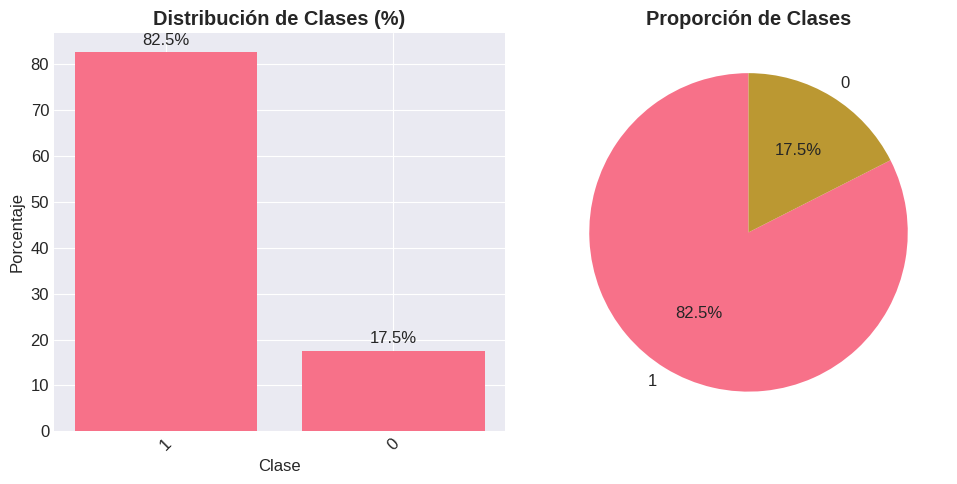

✅ Dataset balanceado

✅ SECUENCIA 1 COMPLETADA
   • Tipo de problema: classification
   • Features: 27
   • Muestras: 32864

🔧 EJECUTANDO SECUENCIA 2: PREPROCESAMIENTO

🔧 SECUENCIA 2: PREPROCESAMIENTO Y FEATURE ENGINEERING

1. 📊 DIVIDIENDO DATOS EN TRAIN Y TEST
----------------------------------------
   • Train: (26291, 27) (features), (26291,) (target)
   • Test:  (6573, 27) (features), (6573,) (target)
   • Proporción: 80% train, 20% test

2. ⚙️  CREANDO PIPELINES DE PREPROCESAMIENTO
----------------------------------------
✅ Preprocesador creado con:
   • Transformador numérico: Imputación (mediana) + Escalado
   • Transformador categórico: Imputación + One-Hot Encoding

3. 🔄 APLICANDO PREPROCESAMIENTO
----------------------------------------
Transformando datos de entrenamiento...
Transformando datos de prueba...
✅ Datos transformados:
   • X_train procesado: (26291, 150)
   • X_test procesado:  (6573, 150)
   • Total features: 150

5. 🛠️  FEATURE ENGINEERING BÁSICO
--------------

,Modelo,Accuracy,Precision,Recall,F1-Score,CV Accuracy,CV Std
1,Decision Tree,0.992545,0.992531,0.992545,0.992536,0.990795,0.001353
4,SVM,0.992393,0.992402,0.992393,0.992345,0.991822,0.000850
3,K-Nearest Neighbors,0.992393,0.992374,0.992393,0.992364,0.992013,0.001048
2,Random Forest,0.991632,0.991607,0.991632,0.991611,0.992051,0.000569
0,Logistic Regression,0.988894,0.988861,0.988894,0.988873,0.988513,0.000631


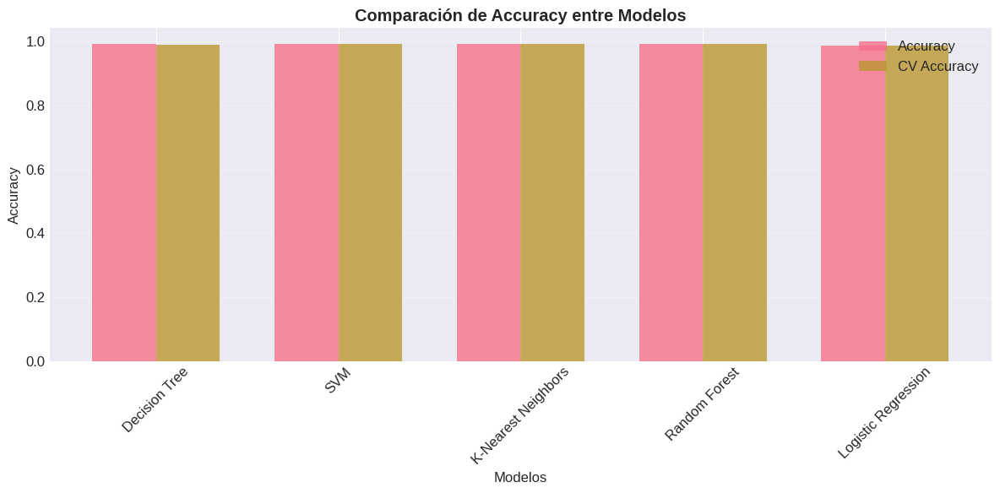


4. 🎯 SELECCIONANDO MEJOR MODELO
----------------------------------------
🏆 MEJOR MODELO: Decision Tree
📈 Accuracy: 0.9925

5. 🔍 EVALUACIÓN DETALLADA DEL MEJOR MODELO
----------------------------------------
📊 MATRIZ DE CONFUSIÓN:


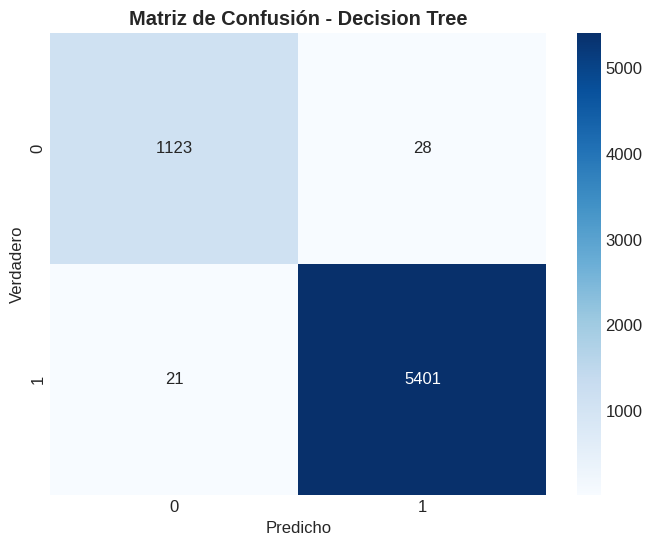


📋 REPORTE DE CLASIFICACIÓN:
              precision    recall  f1-score   support

           0       0.98      0.98      0.98      1151
           1       0.99      1.00      1.00      5422

    accuracy                           0.99      6573
   macro avg       0.99      0.99      0.99      6573
weighted avg       0.99      0.99      0.99      6573


✅ SECUENCIA 3 COMPLETADA
   • Modelo ganador: Decision Tree

⚙️  EJECUTANDO SECUENCIA 4: OPTIMIZACIÓN DE HIPERPARÁMETROS


NameError: name 'secuencia4_optimizacion_hiperparametros' is not defined

In [79]:
# ============================================
# EJECUCIÓN COMPLETA Y ORDENADA DE TODAS LAS SECUENCIAS
# ============================================

print("🚀 INICIANDO PIPELINE COMPLETO DE MACHINE LEARNING")
print("="*70)

# PRIMERO: Verificar que tenemos el dataset
if 'df_limpio' not in locals():
    print("❌ ERROR: No se encontró 'df_limpio'")
    print("📌 Primero carga y limpia tu dataset")
else:
    print(f"✅ Dataset cargado: {df_limpio.shape}")

    # PASO 0: Definir la variable objetivo (AJUSTA ESTO)
    # ============================================
    print("\n🎯 PASO 0: CONFIGURACIÓN INICIAL")
    print("-" * 40)

    # IMPORTANTE: Cambia esto por tu columna objetivo real
    TARGET_COLUMN = "Label"  # ⬅️ CAMBIA ESTO

    if TARGET_COLUMN not in df_limpio.columns:
        print(f"❌ La columna '{TARGET_COLUMN}' no existe en el dataset")
        print("📌 Columnas disponibles:")
        for i, col in enumerate(df_limpio.columns, 1):
            print(f"   {i:2}. {col}")

        # Sugerir posibles targets
        print("\n💡 Posibles variables objetivo (basado en análisis):")
        posibles_targets = []
        for col in df_limpio.columns:
            if df_limpio[col].nunique() <= 10:
                posibles_targets.append(col)

        if posibles_targets:
            print("Columnas con <=10 valores únicos (buenas para clasificación):")
            for col in posibles_targets[:5]:
                print(f"   • {col}: {df_limpio[col].nunique()} valores únicos")
    else:
        print(f"✅ Variable objetivo configurada: '{TARGET_COLUMN}'")

        # ============================================
        # SECUENCIA 1: PREPARACIÓN DE DATOS
        # ============================================
        print("\n" + "="*70)
        print("🔧 EJECUTANDO SECUENCIA 1: PREPARACIÓN DE DATOS")
        print("="*70)

        # Ejecutar Secuencia 1
        X, y, problem_type, num_feats, cat_feats = secuencia1_preparacion_datos(
            df_limpio, TARGET_COLUMN
        )

        print(f"\n✅ SECUENCIA 1 COMPLETADA")
        print(f"   • Tipo de problema: {problem_type}")
        print(f"   • Features: {X.shape[1]}")
        print(f"   • Muestras: {X.shape[0]}")

        # ============================================
        # SECUENCIA 2: PREPROCESAMIENTO
        # ============================================
        print("\n" + "="*70)
        print("🔧 EJECUTANDO SECUENCIA 2: PREPROCESAMIENTO")
        print("="*70)

        # Ejecutar Secuencia 2
        datos_procesados = secuencia2_preprocesamiento(
            X, y, num_feats, cat_feats, problem_type
        )

        print(f"\n✅ SECUENCIA 2 COMPLETADA")
        print(f"   • Datos de entrenamiento procesados: {datos_procesados['X_train_processed'].shape}")
        print(f"   • Datos de prueba procesados: {datos_procesados['X_test_processed'].shape}")

        # ============================================
        # SECUENCIA 3: MODELOS BÁSICOS
        # ============================================
        print("\n" + "="*70)
        print("🤖 EJECUTANDO SECUENCIA 3: MODELOS BÁSICOS")
        print("="*70)

        # Ejecutar Secuencia 3
        resultados_modelos = secuencia3_modelos_basicos(datos_procesados, problem_type)

        print(f"\n✅ SECUENCIA 3 COMPLETADA")
        print(f"   • Modelo ganador: {resultados_modelos['best_model_name']}")

        # ============================================
        # SECUENCIA 4: OPTIMIZACIÓN DE HIPERPARÁMETROS
        # ============================================
        print("\n" + "="*70)
        print("⚙️  EJECUTANDO SECUENCIA 4: OPTIMIZACIÓN DE HIPERPARÁMETROS")
        print("="*70)

        # Ejecutar Secuencia 4
        resultados_optimizacion = secuencia4_optimizacion_hiperparametros(
            datos_procesados, problem_type
        )

        print(f"\n✅ SECUENCIA 4 COMPLETADA")

        # ============================================
        # RESULTADOS FINALES
        # ============================================
        print("\n" + "="*70)
        print("🎉 PIPELINE DE MACHINE LEARNING COMPLETADO")
        print("="*70)

        # Comparar resultados antes y después de optimización
        print("\n📊 RESUMEN DE RESULTADOS:")
        print("-" * 40)

        print(f"1. Tipo de problema: {problem_type.upper()}")
        print(f"2. Variable objetivo: {TARGET_COLUMN}")
        print(f"3. Mejor modelo básico: {resultados_modelos['best_model_name']}")

        if 'resultados_optimizacion' in locals():
            print(f"4. Mejor modelo optimizado: {resultados_optimizacion['best_optimized_name']}")

        print(f"\n📈 Próximos pasos recomendados:")
        print("   1. Feature engineering avanzado")
        print("   2. Ensamblaje de modelos (ensembles)")
        print("   3. Validación cruzada más robusta")
        print("   4. Guardar modelo para producción")

In [80]:
# ============================================
# CELDA 1: CONFIGURACIÓN INICIAL
# ============================================

print("🔧 CONFIGURACIÓN INICIAL PARA ML")
print("="*50)

# 1. Verificar que tenemos el dataset
if 'df_limpio' not in locals():
    print("❌ ERROR: No se encontró 'df_limpio'")
    print("📌 Ejecuta primero la limpieza de datos")
else:
    print(f"✅ Dataset cargado: {df_limpio.shape}")

    # 2. Mostrar columnas disponibles
    print("\n📋 COLUMNAS DISPONIBLES:")
    for i, col in enumerate(df_limpio.columns, 1):
        print(f"{i:2}. {col} ({df_limpio[col].dtype}, {df_limpio[col].nunique()} valores únicos)")

    # 3. Definir variable objetivo (AJUSTA ESTO)
    TARGET_COLUMN = "Label"  # ⬅️ CAMBIA POR TU COLUMNA OBJETIVO

    print(f"\n🎯 VARIABLE OBJETIVO SELECCIONADA: '{TARGET_COLUMN}'")

    if TARGET_COLUMN not in df_limpio.columns:
        print(f"❌ ERROR: La columna '{TARGET_COLUMN}' no existe")

        # Sugerir posibles targets
        print("\n💡 SUGERENCIAS (columnas con <=10 valores únicos):")
        for col in df_limpio.columns:
            if df_limpio[col].nunique() <= 10:
                print(f"   • {col}: {df_limpio[col].nunique()} valores únicos")
    else:
        print("✅ Configuración lista para Secuencia 1")

🔧 CONFIGURACIÓN INICIAL PARA ML
✅ Dataset cargado: (32864, 28)

📋 COLUMNAS DISPONIBLES:
 1. srcip (object, 19 valores únicos)
 2. sport (float64, 16502 valores únicos)
 3. dstip (object, 42 valores únicos)
 4. dsport (float64, 1038 valores únicos)
 5. proto (object, 4 valores únicos)
 6. state (object, 3 valores únicos)
 7. dur (float64, 20953 valores únicos)
 8. sbytes (float64, 1244 valores únicos)
 9. dbytes (float64, 3266 valores únicos)
10. service (object, 13 valores únicos)
11. Sload (float64, 21221 valores únicos)
12. Dload (float64, 13067 valores únicos)
13. Spkts (float64, 171 valores únicos)
14. Dpkts (float64, 202 valores únicos)
15. smeansz (float64, 1381 valores únicos)
16. dmeansz (float64, 3405 valores únicos)
17. trans_depth (object, 7 valores únicos)
18. res_bdy_len (object, 53 valores únicos)
19. Stime (datetime64[ns, UTC], 32675 valores únicos)
20. Ltime (datetime64[ns, UTC], 32672 valores únicos)
21. synack (bool, 1 valores únicos)
22. is_sm_ips_ports (int64, 1 val

🚀 EJECUTANDO SECUENCIA 1: PREPARACIÓN DE DATOS
🔧 SECUENCIA 1: PREPARACIÓN DE DATOS PARA MACHINE LEARNING

1. 🎯 IDENTIFICANDO TIPO DE PROBLEMA
----------------------------------------

📊 PROBLEMA DE CLASIFICACIÓN
   • Variable objetivo: Label
   • Clases: 2
   • Distribución:


,count
Label,
1,27108
0,5756



2. 📊 SEPARANDO FEATURES Y TARGET
----------------------------------------
   • Features (X): (32864, 27)
   • Target (y): (32864,)
   • Columnas en X: ['srcip', 'sport', 'dstip', 'dsport', 'proto', 'state', 'dur', 'sbytes', 'dbytes', 'service', 'Sload', 'Dload', 'Spkts', 'Dpkts', 'smeansz', 'dmeansz', 'trans_depth', 'res_bdy_len', 'Stime', 'Ltime', 'synack', 'is_sm_ips_ports', 'ct_state_ttl', 'service_was_null', 'trans_depth_was_null', 'res_bdy_len_was_null', 'null_count_per_row']

3. 🏷️  TIPOS DE FEATURES IDENTIFICADOS
----------------------------------------
   • Numéricas: 16
     sport, dsport, dur, sbytes, dbytes...
   • Categóricas: 8
     srcip, dstip, proto, state, service...

4. ⚖️  VERIFICANDO BALANCE DE CLASES
----------------------------------------


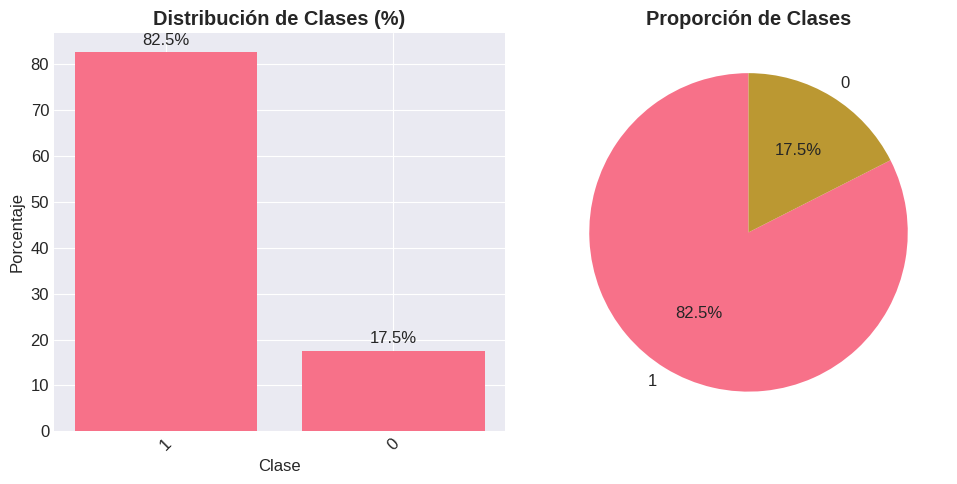

✅ Dataset balanceado

✅ VARIABLES CREADAS:
   • X: (32864, 27)
   • y: (32864,)
   • problem_type: classification
   • num_feats: 16 features
   • cat_feats: 8 features


In [81]:
# ============================================
# CELDA 2: EJECUTAR SECUENCIA 1
# ============================================

print("🚀 EJECUTANDO SECUENCIA 1: PREPARACIÓN DE DATOS")
print("="*50)

# Verificar que tenemos la configuración
if 'df_limpio' in locals() and 'TARGET_COLUMN' in locals():
    if TARGET_COLUMN in df_limpio.columns:
        # Ejecutar Secuencia 1
        X, y, problem_type, num_feats, cat_feats = secuencia1_preparacion_datos(
            df_limpio, TARGET_COLUMN
        )

        print(f"\n✅ VARIABLES CREADAS:")
        print(f"   • X: {X.shape}")
        print(f"   • y: {y.shape}")
        print(f"   • problem_type: {problem_type}")
        print(f"   • num_feats: {len(num_feats)} features")
        print(f"   • cat_feats: {len(cat_feats)} features")
    else:
        print(f"❌ ERROR: La columna '{TARGET_COLUMN}' no existe")
else:
    print("❌ ERROR: Ejecuta primero la Celda 1")

In [82]:
# ============================================
# CELDA 3: EJECUTAR SECUENCIA 2
# ============================================

print("🚀 EJECUTANDO SECUENCIA 2: PREPROCESAMIENTO")
print("="*50)

# Verificar que tenemos las variables de la Secuencia 1
required_vars = ['X', 'y', 'problem_type', 'num_feats', 'cat_feats']
missing_vars = [var for var in required_vars if var not in locals()]

if missing_vars:
    print(f"❌ ERROR: Faltan variables de la Secuencia 1:")
    for var in missing_vars:
        print(f"   • {var}")
    print("📌 Ejecuta primero la Celda 2")
else:
    # Ejecutar Secuencia 2
    datos_procesados = secuencia2_preprocesamiento(
        X, y, num_feats, cat_feats, problem_type
    )

    print(f"\n✅ DATOS PROCESADOS CREADOS:")
    print(f"   • X_train_processed: {datos_procesados['X_train_processed'].shape}")
    print(f"   • X_test_processed: {datos_procesados['X_test_processed'].shape}")
    print(f"   • Variables disponibles en 'datos_procesados':")
    for key in datos_procesados.keys():
        print(f"     - {key}")

🚀 EJECUTANDO SECUENCIA 2: PREPROCESAMIENTO

🔧 SECUENCIA 2: PREPROCESAMIENTO Y FEATURE ENGINEERING

1. 📊 DIVIDIENDO DATOS EN TRAIN Y TEST
----------------------------------------
   • Train: (26291, 27) (features), (26291,) (target)
   • Test:  (6573, 27) (features), (6573,) (target)
   • Proporción: 80% train, 20% test

2. ⚙️  CREANDO PIPELINES DE PREPROCESAMIENTO
----------------------------------------
✅ Preprocesador creado con:
   • Transformador numérico: Imputación (mediana) + Escalado
   • Transformador categórico: Imputación + One-Hot Encoding

3. 🔄 APLICANDO PREPROCESAMIENTO
----------------------------------------
Transformando datos de entrenamiento...
Transformando datos de prueba...
✅ Datos transformados:
   • X_train procesado: (26291, 150)
   • X_test procesado:  (6573, 150)
   • Total features: 150

5. 🛠️  FEATURE ENGINEERING BÁSICO
----------------------------------------
Creando interacciones numéricas...
Creando features polinómicas...
✅ Nuevas features creadas: spor

🚀 EJECUTANDO SECUENCIA 3: MODELOS BÁSICOS

🤖 SECUENCIA 3: MODELOS BÁSICOS DE MACHINE LEARNING

1. 🎯 DEFINICIÓN DE MODELOS
----------------------------------------
📊 Modelos de CLASIFICACIÓN:
   • Logistic Regression
   • Decision Tree
   • Random Forest
   • K-Nearest Neighbors
   • SVM

2. 🏃 ENTRENANDO 5 MODELOS
----------------------------------------

🔍 Modelo: Logistic Regression
   ✅ Accuracy: 0.9889
   📊 CV Accuracy: 0.9885 (±0.0006)

🔍 Modelo: Decision Tree
   ✅ Accuracy: 0.9925
   📊 CV Accuracy: 0.9908 (±0.0014)

🔍 Modelo: Random Forest
   ✅ Accuracy: 0.9916
   📊 CV Accuracy: 0.9921 (±0.0006)

🔍 Modelo: K-Nearest Neighbors
   ✅ Accuracy: 0.9924
   📊 CV Accuracy: 0.9920 (±0.0010)

🔍 Modelo: SVM
   ✅ Accuracy: 0.9924
   📊 CV Accuracy: 0.9918 (±0.0009)

3. 🏆 COMPARACIÓN DE MODELOS
----------------------------------------


,Modelo,Accuracy,Precision,Recall,F1-Score,CV Accuracy,CV Std
1,Decision Tree,0.992545,0.992531,0.992545,0.992536,0.990795,0.001353
4,SVM,0.992393,0.992402,0.992393,0.992345,0.991822,0.000850
3,K-Nearest Neighbors,0.992393,0.992374,0.992393,0.992364,0.992013,0.001048
2,Random Forest,0.991632,0.991607,0.991632,0.991611,0.992051,0.000569
0,Logistic Regression,0.988894,0.988861,0.988894,0.988873,0.988513,0.000631


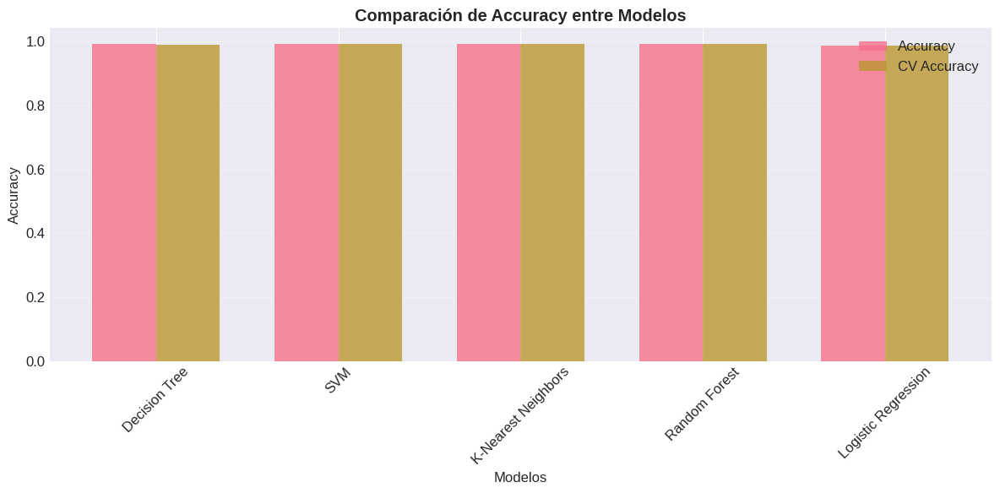


4. 🎯 SELECCIONANDO MEJOR MODELO
----------------------------------------
🏆 MEJOR MODELO: Decision Tree
📈 Accuracy: 0.9925

5. 🔍 EVALUACIÓN DETALLADA DEL MEJOR MODELO
----------------------------------------
📊 MATRIZ DE CONFUSIÓN:


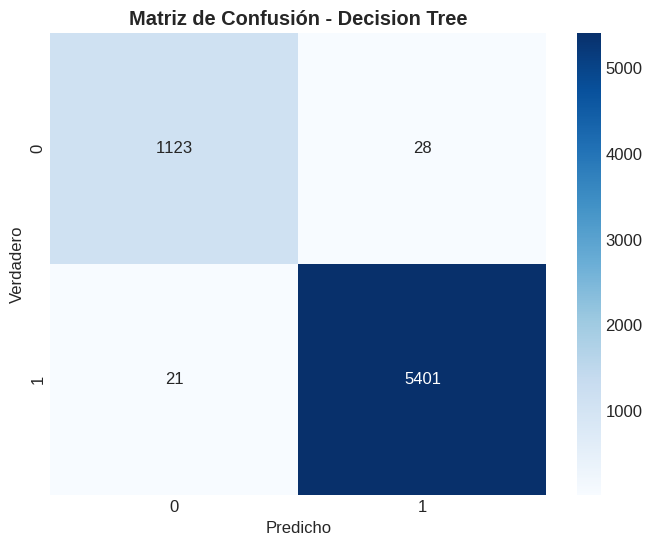


📋 REPORTE DE CLASIFICACIÓN:
              precision    recall  f1-score   support

           0       0.98      0.98      0.98      1151
           1       0.99      1.00      1.00      5422

    accuracy                           0.99      6573
   macro avg       0.99      0.99      0.99      6573
weighted avg       0.99      0.99      0.99      6573


✅ MODELOS ENTRENADOS:
   • Modelo ganador: Decision Tree
   • Variables disponibles en 'resultados_modelos':
     - results
     - results_df
     - best_model
     - best_model_name
     - y_pred_best


In [83]:
# ============================================
# CELDA 4: EJECUTAR SECUENCIA 3
# ============================================

print("🚀 EJECUTANDO SECUENCIA 3: MODELOS BÁSICOS")
print("="*50)

# Verificar que tenemos las variables necesarias
if 'datos_procesados' not in locals() or 'problem_type' not in locals():
    print("❌ ERROR: Faltan variables de secuencias anteriores")
    print("📌 Ejecuta primero las Celdas 1, 2 y 3")
else:
    # Ejecutar Secuencia 3
    resultados_modelos = secuencia3_modelos_basicos(datos_procesados, problem_type)

    print(f"\n✅ MODELOS ENTRENADOS:")
    print(f"   • Modelo ganador: {resultados_modelos['best_model_name']}")
    print(f"   • Variables disponibles en 'resultados_modelos':")
    for key in resultados_modelos.keys():
        print(f"     - {key}")

In [90]:
# ============================================
# CELDA 5: EJECUTAR SECUENCIA 4
# ============================================

print("🚀 EJECUTANDO SECUENCIA 4: OPTIMIZACIÓN")
print("="*50)

# Verificar que tenemos las variables necesarias
if 'datos_procesados' not in locals() or 'problem_type' not in locals():
    print("❌ ERROR: Faltan variables de secuencias anteriores")
    print("📌 Ejecuta primero las Celdas 1, 2 y 3")
else:
    # Ejecutar Secuencia 4
    resultados_optimizacion = secuencia4_optimizacion_hiperparametros(
        datos_procesados, problem_type
    )

    print(f"\n✅ OPTIMIZACIÓN COMPLETADA")

🚀 EJECUTANDO SECUENCIA 4: OPTIMIZACIÓN

⚙️  SECUENCIA 4: OPTIMIZACIÓN DE HIPERPARÁMETROS

1. 🎯 DEFINICIÓN DE ESPACIOS DE BÚSQUEDA
----------------------------------------

🔍 Random Forest:
   • Parámetros a optimizar: 5
     - n_estimators: [50, 100, 200]
     - max_depth: [None, 10, 20, 30]
     - min_samples_split: [2, 5, 10]
     - min_samples_leaf: [1, 2, 4]
     - max_features: ['sqrt', 'log2']
   • Combinaciones posibles: 216

🔍 SVM:
   • Parámetros a optimizar: 3
     - C: [0.1, 1, 10]
     - kernel: ['linear', 'rbf']
     - gamma: ['scale', 'auto']
   • Combinaciones posibles: 12

🔍 Logistic Regression:
   • Parámetros a optimizar: 3
     - C: [0.1, 1, 10]
     - penalty: ['l1', 'l2']
     - solver: ['liblinear']
   • Combinaciones posibles: 6

2. 🔍 OPTIMIZANDO 3 MODELOS CON GRID SEARCH
----------------------------------------

🎯 Optimizando Random Forest...
   Entrenando... (esto puede tomar unos minutos)
Fitting 3 folds for each of 216 candidates, totalling 648 fits


KeyboardInterrupt: 

In [89]:
# ============================================
# SECUENCIA 4: OPTIMIZACIÓN DE HIPERPARÁMETROS
# ============================================

def secuencia4_optimizacion_hiperparametros(datos_procesados, problem_type='classification'):
    """
    SECUENCIA 4: Optimización de hiperparámetros
    """
    print("\n" + "="*60)
    print("⚙️  SECUENCIA 4: OPTIMIZACIÓN DE HIPERPARÁMETROS")
    print("="*60)

    from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
    from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor
    from sklearn.svm import SVC, SVR
    from sklearn.linear_model import LogisticRegression
    from sklearn.metrics import accuracy_score, r2_score
    import warnings
    warnings.filterwarnings('ignore')

    # Extraer datos
    X_train = datos_procesados['X_train_processed']
    X_test = datos_procesados['X_test_processed']
    y_train = datos_procesados['y_train']
    y_test = datos_procesados['y_test']

    # 4.1. Definir modelos y parámetros para optimización
    print("\n1. 🎯 DEFINICIÓN DE ESPACIOS DE BÚSQUEDA")
    print("-" * 40)

    if problem_type == 'classification':
        # Modelos de clasificación
        models_params = {
            'Random Forest': {
                'model': RandomForestClassifier(random_state=42),
                'params': {
                    'n_estimators': [50, 100, 200],
                    'max_depth': [None, 10, 20, 30],
                    'min_samples_split': [2, 5, 10],
                    'min_samples_leaf': [1, 2, 4],
                    'max_features': ['sqrt', 'log2']
                }
            },
            'SVM': {
                'model': SVC(random_state=42, probability=True),
                'params': {
                    'C': [0.1, 1, 10],
                    'kernel': ['linear', 'rbf'],
                    'gamma': ['scale', 'auto']
                }
            },
            'Logistic Regression': {
                'model': LogisticRegression(max_iter=1000, random_state=42),
                'params': {
                    'C': [0.1, 1, 10],
                    'penalty': ['l1', 'l2'],
                    'solver': ['liblinear']
                }
            }
        }
        scoring = 'accuracy'

    else:  # regression
        # Modelos de regresión
        models_params = {
            'Random Forest': {
                'model': RandomForestRegressor(random_state=42),
                'params': {
                    'n_estimators': [50, 100, 200],
                    'max_depth': [None, 10, 20],
                    'min_samples_split': [2, 5],
                    'min_samples_leaf': [1, 2]
                }
            },
            'SVM': {
                'model': SVR(),
                'params': {
                    'C': [0.1, 1, 10],
                    'kernel': ['linear', 'rbf'],
                    'gamma': ['scale', 'auto']
                }
            }
        }
        scoring = 'r2'

    # Mostrar espacios de búsqueda
    for model_name, config in models_params.items():
        print(f"\n🔍 {model_name}:")
        print(f"   • Parámetros a optimizar: {len(config['params'])}")
        total_combinaciones = 1
        for param, values in config['params'].items():
            print(f"     - {param}: {values}")
            total_combinaciones *= len(values)
        print(f"   • Combinaciones posibles: {total_combinaciones:,}")

    # 4.2. Optimización con GridSearchCV
    print(f"\n2. 🔍 OPTIMIZANDO {len(models_params)} MODELOS CON GRID SEARCH")
    print("-" * 40)

    optimization_results = {}

    for model_name, config in models_params.items():
        print(f"\n🎯 Optimizando {model_name}...")

        # Grid Search (Reducido para no consumir mucho tiempo)
        grid_search = GridSearchCV(
            estimator=config['model'],
            param_grid=config['params'],
            cv=3,  # Reducir CV para más velocidad
            scoring=scoring,
            n_jobs=-1,
            verbose=1
        )

        # Entrenar
        print(f"   Entrenando... (esto puede tomar unos minutos)")
        grid_search.fit(X_train, y_train)

        # Resultados
        optimization_results[model_name] = {
            'best_model': grid_search.best_estimator_,
            'best_params': grid_search.best_params_,
            'best_score': grid_search.best_score_,
            'grid_search': grid_search
        }

        print(f"   ✅ Mejor score (CV): {grid_search.best_score_:.4f}")
        print(f"   ⚙️  Mejores parámetros:")
        for param, value in grid_search.best_params_.items():
            print(f"     • {param}: {value}")

    # 4.3. Comparar resultados optimizados
    print(f"\n3. 🏆 COMPARACIÓN DE MODELOS OPTIMIZADOS")
    print("-" * 40)

    # Evaluar en test set
    test_results = []

    for model_name, results in optimization_results.items():
        model = results['best_model']

        # Predecir en test
        y_pred = model.predict(X_test)

        if problem_type == 'classification':
            test_score = accuracy_score(y_test, y_pred)
        else:
            test_score = r2_score(y_test, y_pred)

        test_results.append({
            'Modelo': model_name,
            'CV Score': results['best_score'],
            'Test Score': test_score,
            'Diferencia': results['best_score'] - test_score
        })

    test_results_df = pd.DataFrame(test_results).sort_values('Test Score', ascending=False)

    print("\n📊 RESULTADOS EN TEST SET:")
    display(test_results_df)

    # Gráfico de comparación
    plt.figure(figsize=(10, 6))

    x = range(len(test_results_df))
    width = 0.35

    plt.bar(x, test_results_df['CV Score'], width, label='CV Score', alpha=0.8, color='blue')
    plt.bar([i + width for i in x], test_results_df['Test Score'], width,
           label='Test Score', alpha=0.8, color='green')

    plt.xlabel('Modelos')
    plt.ylabel('Score')
    plt.title('Comparación: CV Score vs Test Score', fontweight='bold')
    plt.xticks([i + width/2 for i in x], test_results_df['Modelo'], rotation=45)
    plt.legend()
    plt.grid(True, alpha=0.3, axis='y')
    plt.tight_layout()
    plt.show()

    # 4.4. Seleccionar mejor modelo optimizado
    print("\n4. 🎯 MEJOR MODELO OPTIMIZADO")
    print("-" * 40)

    best_optimized_name = test_results_df.iloc[0]['Modelo']
    best_optimized_model = optimization_results[best_optimized_name]['best_model']
    best_test_score = test_results_df.iloc[0]['Test Score']

    print(f"🏆 MEJOR MODELO OPTIMIZADO: {best_optimized_name}")
    print(f"📈 Test Score: {best_test_score:.4f}")
    print(f"📊 CV Score: {test_results_df.iloc[0]['CV Score']:.4f}")
    print(f"⚙️  Parámetros óptimos:")

    for param, value in optimization_results[best_optimized_name]['best_params'].items():
        print(f"   • {param}: {value}")

    # 4.5. Análisis de importancia de features (si aplica)
    print("\n5. 🔍 IMPORTANCIA DE FEATURES")
    print("-" * 40)

    if hasattr(best_optimized_model, 'feature_importances_'):
        try:
            feature_importances = best_optimized_model.feature_importances_
            feature_names = datos_procesados['feature_names']

            # Crear DataFrame de importancias
            importance_df = pd.DataFrame({
                'Feature': feature_names,
                'Importance': feature_importances
            }).sort_values('Importance', ascending=False)

            print("Top 10 features más importantes:")
            display(importance_df.head(10))

            # Gráfico de importancia
            plt.figure(figsize=(12, 6))
            top_features = importance_df.head(15)

            plt.barh(range(len(top_features)), top_features['Importance'][::-1])
            plt.yticks(range(len(top_features)), top_features['Feature'][::-1])
            plt.xlabel('Importancia')
            plt.title('Top 15 Features Más Importantes', fontweight='bold')
            plt.grid(True, alpha=0.3, axis='x')
            plt.tight_layout()
            plt.show()

        except Exception as e:
            print(f"⚠️ No se pudo obtener importancia de features: {e}")
    else:
        print("ℹ️ Este modelo no tiene atributo 'feature_importances_'")

    # 4.6. Matriz de confusión o gráfico de residuos para el mejor modelo
    print("\n6. 📊 EVALUACIÓN FINAL DEL MEJOR MODELO OPTIMIZADO")
    print("-" * 40)

    # Predecir con el mejor modelo optimizado
    y_pred_best_optimized = best_optimized_model.predict(X_test)

    if problem_type == 'classification':
        from sklearn.metrics import confusion_matrix, classification_report

        # Matriz de confusión
        cm = confusion_matrix(y_test, y_pred_best_optimized)

        plt.figure(figsize=(8, 6))
        sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
        plt.title(f'Matriz de Confusión - {best_optimized_name} (Optimizado)', fontweight='bold')
        plt.ylabel('Verdadero')
        plt.xlabel('Predicho')
        plt.show()

        # Reporte de clasificación
        print("\n📋 REPORTE DE CLASIFICACIÓN:")
        print(classification_report(y_test, y_pred_best_optimized))

    else:  # regression
        from sklearn.metrics import mean_squared_error, mean_absolute_error

        # Gráfico de predicciones vs valores reales
        plt.figure(figsize=(10, 6))
        plt.scatter(y_test, y_pred_best_optimized, alpha=0.6)

        # Línea de perfecta predicción
        max_val = max(y_test.max(), y_pred_best_optimized.max())
        min_val = min(y_test.min(), y_pred_best_optimized.min())
        plt.plot([min_val, max_val], [min_val, max_val], 'r--', label='Predicción Perfecta')

        plt.xlabel('Valores Reales')
        plt.ylabel('Predicciones')
        plt.title(f'Predicciones vs Reales - {best_optimized_name} (Optimizado)', fontweight='bold')
        plt.legend()
        plt.grid(True, alpha=0.3)
        plt.tight_layout()
        plt.show()

        # Métricas
        mse = mean_squared_error(y_test, y_pred_best_optimized)
        mae = mean_absolute_error(y_test, y_pred_best_optimized)
        r2 = r2_score(y_test, y_pred_best_optimized)

        print(f"📈 MÉTRICAS FINALES:")
        print(f"   • R² Score: {r2:.4f}")
        print(f"   • MSE: {mse:.4f}")
        print(f"   • RMSE: {np.sqrt(mse):.4f}")
        print(f"   • MAE: {mae:.4f}")

    return {
        'optimization_results': optimization_results,
        'test_results_df': test_results_df,
        'best_optimized_model': best_optimized_model,
        'best_optimized_name': best_optimized_name,
        'y_pred_best_optimized': y_pred_best_optimized
    }

print("✅ Función 'secuencia4_optimizacion_hiperparametros' definida")

✅ Función 'secuencia4_optimizacion_hiperparametros' definida
